In [1]:
import os
import random

import numpy as np
import pandas as pd

from skimage import io

from sklearn.model_selection import train_test_split
from sklearn.linear_model import Perceptron
from sklearn.metrics import accuracy_score

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Pytorch
import torch, torchvision, torch.utils
from torch import Tensor
from torch import cat
from torch.autograd.grad_mode import no_grad
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import torch.optim as optim
from torch.nn import (
    Module,
    Conv2d,
    Linear,
    Dropout2d,
    NLLLoss, BCELoss, CrossEntropyLoss, MSELoss,
    MaxPool2d,
    Flatten,
    Sequential,
    ReLU,
)

import torch.nn.functional as F
from torchviz import make_dot
from torchsummary import summary
from sklearn.metrics import accuracy_score,ConfusionMatrixDisplay,RocCurveDisplay,classification_report,precision_score,recall_score,f1_score
import time


In [3]:
def matrix_confusion(yt, yp,time_taken):
    data = {'Y_Real': yt,
            'Y_Pred': yp}

    df = pd.DataFrame(data, columns=['Y_Real','Y_Pred'])
    confusion_matrix = pd.crosstab(df['Y_Real'], df['Y_Pred'], rownames=['Real'], colnames=['Predicted'])
    sns.heatmap(confusion_matrix, annot=True, fmt='g')

    plt.show()
    y_val = df['Y_Real'].to_numpy()
    predictions = df['Y_Pred'].to_numpy()
    accuracy = accuracy_score(y_val,predictions)
    precision = precision_score(y_val,predictions)
    recall = recall_score(y_val,predictions)
    f1 = f1_score(y_val,predictions)
    print('Time taken: ',time_taken)
    print('Test size:',len(y_val))
    print('Total Accuracy: ',accuracy)
    print('Total Precision: ',precision)
    print('Total Recall: ',recall)
    print('Total F1 Score: ',f1)
    print("Classification Report:\n")
    print(classification_report(y_val,predictions))


    return time_taken,accuracy,precision,recall,f1

In [4]:
torch.cuda.is_available()

True

In [5]:
train_data = torchvision.datasets.ImageFolder('C:/Users/rjuya/OneDrive/Desktop/github stuff/CNLDS2023 Conference/Data/train', transform=transforms.Compose([transforms.ToTensor()]))
test_data = torchvision.datasets.ImageFolder('C:/Users/rjuya/OneDrive/Desktop/github stuff/CNLDS2023 Conference/Data/test', transform=transforms.Compose([transforms.ToTensor()]))
valid_data = torchvision.datasets.ImageFolder('C:/Users/rjuya/OneDrive/Desktop/github stuff/CNLDS2023 Conference/Data/valid', transform=transforms.Compose([transforms.ToTensor()]))

In [6]:
train_data[0][0].shape

torch.Size([3, 640, 640])

In [7]:
train_loader = DataLoader(train_data, shuffle=True, batch_size=8)
test_loader = DataLoader(valid_data, shuffle=True, batch_size=1)
hold_out_test_loader = DataLoader(test_data, shuffle=True, batch_size=1)

In [8]:
# Normal (0) and True, Pneumonia (1)
print((train_loader.dataset.class_to_idx))
print((test_loader.dataset.class_to_idx))
print((hold_out_test_loader.dataset.class_to_idx))

{'NORMAL': 0, 'PNEUMONIA': 1}
{'NORMAL': 0, 'PNEUMONIA': 1}
{'NORMAL': 0, 'PNEUMONIA': 1}


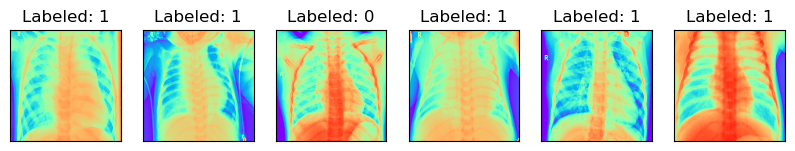

In [9]:
n_samples_show = 6

data_iter = iter(train_loader)
fig, axes = plt.subplots(nrows=1, ncols=n_samples_show, figsize=(10, 10))

while n_samples_show > 0:
    images, targets = data_iter.__next__()

    axes[n_samples_show - 1].imshow(images[0, 0].numpy().squeeze(), cmap=plt.cm.rainbow)
    axes[n_samples_show - 1].set_xticks([])
    axes[n_samples_show - 1].set_yticks([])
    axes[n_samples_show - 1].set_title(f"Labeled: {targets[0].item()}")

    n_samples_show -= 1

In [10]:
class LogisticRegression(Module):
    def __init__(self,input_size,num_classes):
        super(LogisticRegression,self).__init__()
        self.linear = Linear(input_size,num_classes)
    
    def forward(self,x):
        x = x.view(x.size(0), -1)
        return torch.sigmoid(self.linear(x))

In [11]:
input_size = 640*640*3  #Size of image

num_classes = 2  #the image number are in range 0-10

epochs = 4 #one cycle through the full train data

# batch_size = 100 #sample size consider before updating the model’s weights

learning_rate = 0.001  #step size to update parameter

In [12]:
model = LogisticRegression(input_size,num_classes)
loss_func = CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(),lr=learning_rate)

In [13]:

tic = time.time()
loss_list = []
total_accuracy = []
for epoch in range(epochs):
    correct = 0
    total_loss = []
    batch_size = 0
    for i, (images, labels) in enumerate(train_loader):
        batch_size+=1
        optimizer.zero_grad()
        # print(images.shape)
        # print(images.view(-1, input_size).shape)
        output = model(images)
        loss = loss_func(output, labels)
        # Loss.append(loss.item())
        loss.backward()
        optimizer.step()
        total_loss.append(loss.item())
        train_pred = output.argmax(dim=1, keepdim=True)
        correct += train_pred.eq(labels.view_as(train_pred)).sum().item()
    loss_list.append(sum(total_loss) / len(total_loss))
    accuracy = 100 * correct / 4077 # No. of training examples = 4077
    total_accuracy.append(accuracy)
    print(f"Training [{100.0 * (epoch + 1) / epochs:.0f}%]\tLoss: {loss_list[-1]:.4f}\tAccuracy: {accuracy:.2f}%")

toc = time.time()
time_taken = toc-tic
print('Time taken: ',time_taken)

Training [25%]	Loss: 0.5845	Accuracy: 72.82%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [75%]	Loss: 0.5838	Accuracy: 72.92%
Training [100%]	Loss: 0.5841	Accuracy: 72.92%
Time taken:  85.73757076263428


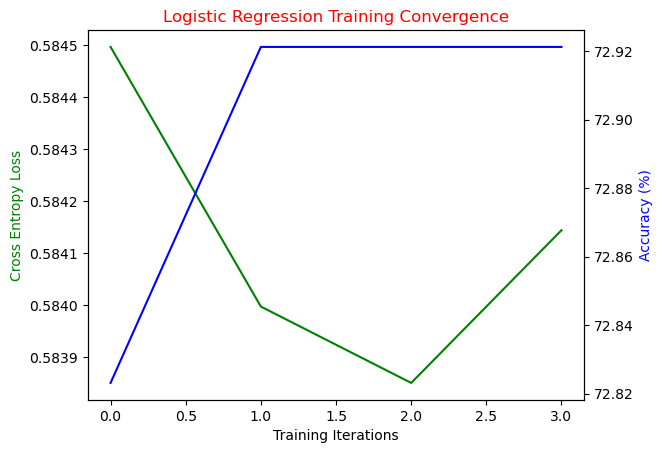

In [14]:
fig, ax1 = plt.subplots()
ax1.plot(loss_list, 'g-')
ax2 = ax1.twinx()
ax2.plot(total_accuracy, 'b')
plt.title("Logistic Regression Training Convergence", color='red')
ax1.set_xlabel("Training Iterations")
ax1.set_ylabel("Cross Entropy Loss", color='g')
ax2.set_ylabel("Accuracy (%)", color='b')
plt.show()

In [15]:
model_path = 'C:/Users/rjuya/OneDrive/Desktop/github stuff/EE5610/Project/Models/log_reg model.pt'

In [16]:
torch.save(model.state_dict(), model_path)

In [17]:
model_temp = LogisticRegression(input_size,num_classes)
model_temp.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [18]:
batch_size=1

model_temp.eval()
pred_targets = []
test_targets= []
with no_grad():

    correct = 0
    for batch_idx, (data, target) in enumerate(test_loader):
        output = model_temp(data)
        if len(output.shape) == 1:
            output = output.reshape(1, *output.shape)
        pred = output.argmax(dim=1, keepdim=True)
        pred_targets.append(pred.item())
        test_targets.append(target.item())
        correct += pred.eq(target.view_as(pred)).sum().item()

        loss = loss_func(output, target)
        total_loss.append(loss.item())

    print(f"Performance on test data:\n\tLoss: {sum(total_loss) / len(total_loss):.4f}\n\tAccuracy: {100 * correct / len(test_loader) / batch_size:.2f}%")
    print(test_targets)
    print(pred_targets)

Performance on test data:
	Loss: 0.5772
	Accuracy: 73.91%
[1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1,

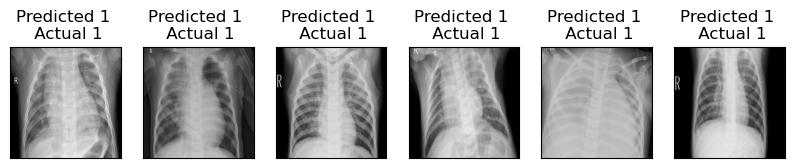

In [19]:
from PIL import Image
#abc
n_samples_show = 6
count = 0
fig, axes = plt.subplots(nrows=1, ncols=n_samples_show, figsize=(10, 3))

model_temp.eval()
with no_grad():
    for batch_idx, (data, target) in enumerate(test_loader):
        if count == n_samples_show:
            break
        output = model_temp(data[0:1])
        if len(output.shape) == 1:
            output = output.reshape(3, *output.shape)

        pred = output.argmax(dim=1, keepdim=True)
        test_targets2 = target.item()
        axes[count].imshow(torchvision.transforms.ToPILImage(mode='RGB')(data[0].squeeze()), cmap=plt.cm.rainbow)

        axes[count].set_xticks([])
        axes[count].set_yticks([])
        axes[count].set_title("Predicted {} \n Actual {}".format(pred.item(),test_targets2))

        count += 1

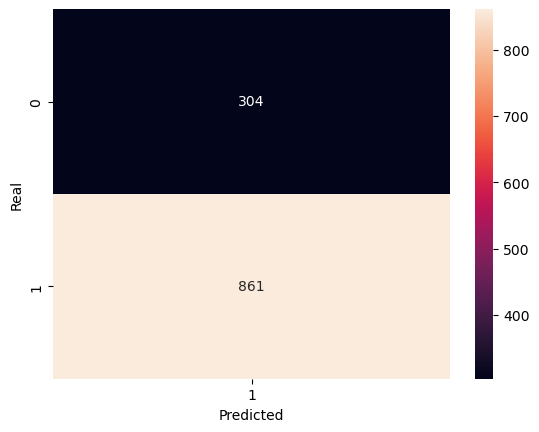

Time taken:  85.73757076263428
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [20]:
val_logreg = matrix_confusion(test_targets, pred_targets,time_taken)

In [21]:
out = pd.DataFrame([val_logreg],
                   index = ['Logistic Regression'],
                  columns=['Time','Accuracy','Precision','Recall','F1 score'])
out.sort_values('Time')

,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression,85.737571,0.739056,0.739056,1.0,0.849951


# Grid Search on Logistic Regression

In [22]:
import pickle
from IPython.display import display

In [23]:
batch_sizes = [16, 32, 64]
num_epochs_list = [10,20,30]
learning_rates = [0.0001,0.001, 0.01, 0.1,1]
optimizers = ['SGD','Adam']

In [24]:
input_size = 640*640*3  #Size of image

num_classes = 2  #the image number are in range 0-10


Training with batch size: 16, epochs: 10, learning rate: 0.0001, optimizer: SGD
Current: 1/90
Training [10%]	Loss: 0.5672	Accuracy: 72.73%
Training [20%]	Loss: 0.5082	Accuracy: 72.95%
Training [30%]	Loss: 0.4885	Accuracy: 72.92%
Training [40%]	Loss: 0.4804	Accuracy: 72.99%
Training [50%]	Loss: 0.4753	Accuracy: 73.07%
Training [60%]	Loss: 0.4720	Accuracy: 73.09%
Training [70%]	Loss: 0.4690	Accuracy: 73.14%
Training [80%]	Loss: 0.4675	Accuracy: 73.19%
Training [90%]	Loss: 0.4655	Accuracy: 73.17%
Training [100%]	Loss: 0.4639	Accuracy: 73.26%
Time taken:  189.16188311576843


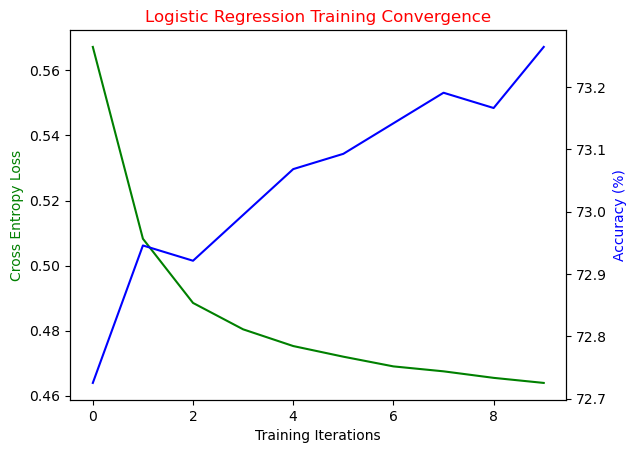

Performance on test data:
	Loss: 0.4564
	Accuracy: 74.25%


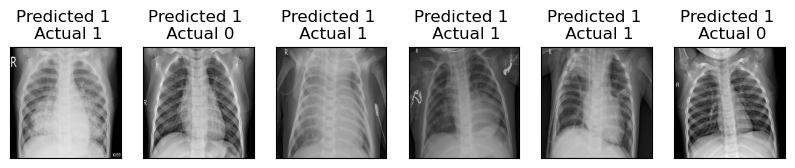

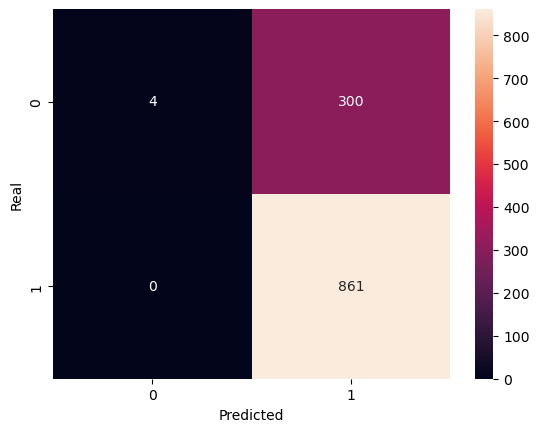

Time taken:  189.16188311576843
Test size: 1165
Total Accuracy:  0.7424892703862661
Total Precision:  0.7416020671834626
Total Recall:  1.0
Total F1 Score:  0.8516320474777448
Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.01      0.03       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.87      0.51      0.44      1165
weighted avg       0.81      0.74      0.64      1165



,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs10_lr0.0001_optimizerSGD,189.161883,0.742489,0.741602,1.0,0.851632


Data Stored Successfully
Training with batch size: 16, epochs: 10, learning rate: 0.0001, optimizer: Adam
Current: 2/90
Training [10%]	Loss: 0.5848	Accuracy: 72.92%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5841	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [80%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5841	Accuracy: 72.92%
Training [100%]	Loss: 0.5842	Accuracy: 72.92%
Time taken:  230.20081782341003


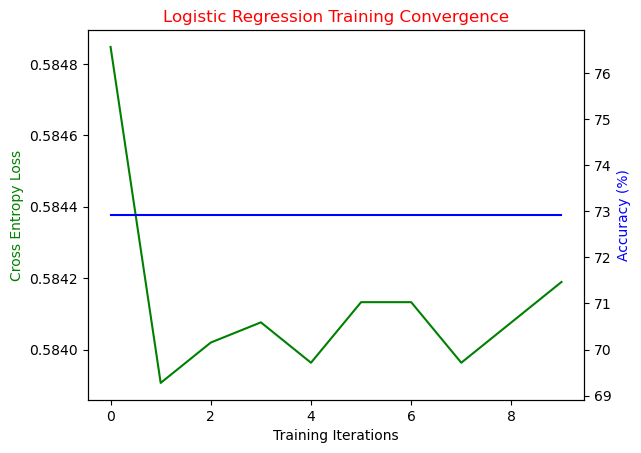

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


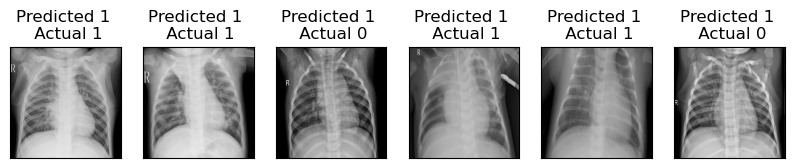

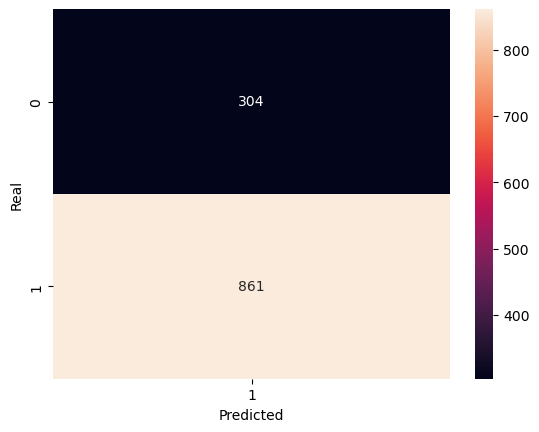

Time taken:  230.20081782341003
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs10_lr0.0001_optimizerAdam,230.200818,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 10, learning rate: 0.001, optimizer: SGD
Current: 3/90
Training [10%]	Loss: 0.5844	Accuracy: 72.82%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [70%]	Loss: 0.5840	Accuracy: 72.92%
Training [80%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5841	Accuracy: 72.92%
Training [100%]	Loss: 0.5841	Accuracy: 72.92%
Time taken:  193.41015458106995


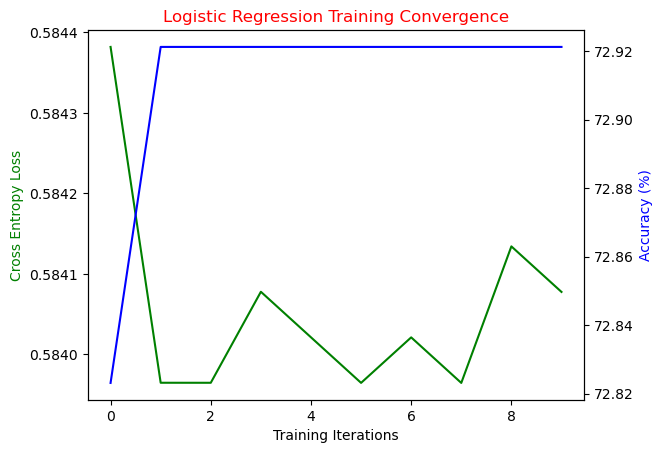

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


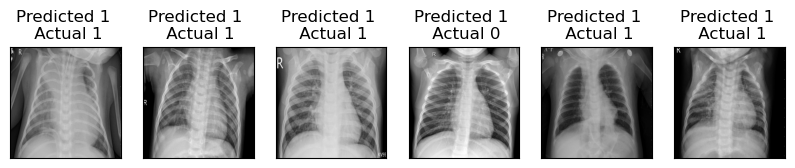

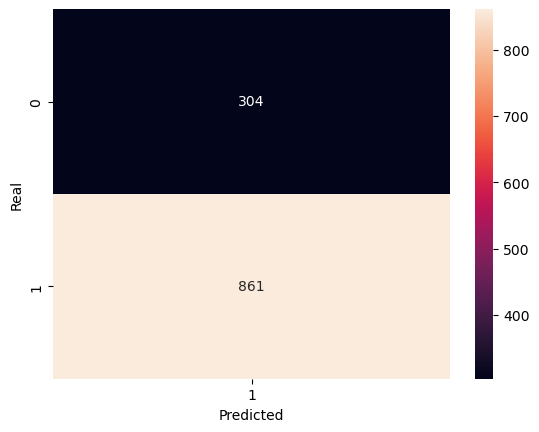

Time taken:  193.41015458106995
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs10_lr0.001_optimizerSGD,193.410155,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 10, learning rate: 0.001, optimizer: Adam
Current: 4/90
Training [10%]	Loss: 0.5842	Accuracy: 72.92%
Training [20%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [70%]	Loss: 0.5840	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5840	Accuracy: 72.92%
Training [100%]	Loss: 0.5841	Accuracy: 72.92%
Time taken:  228.5272650718689


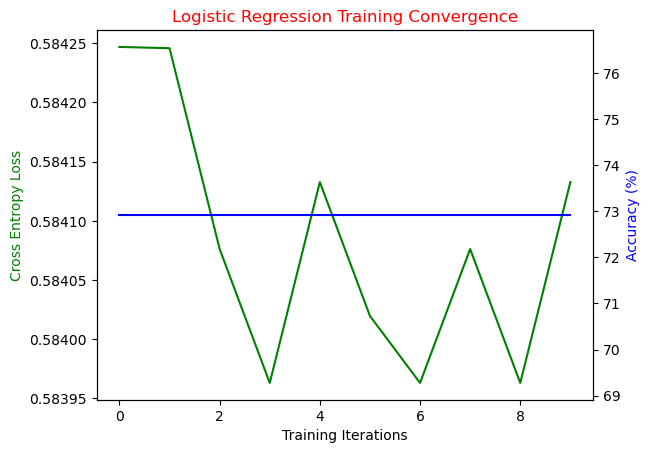

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


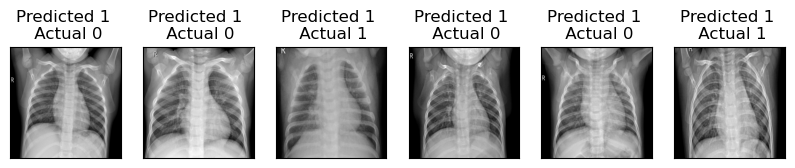

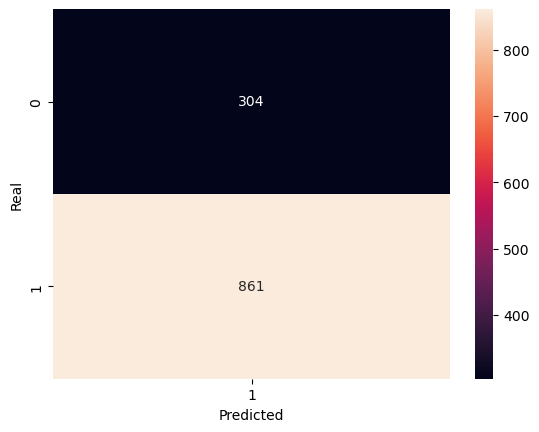

Time taken:  228.5272650718689
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs10_lr0.001_optimizerAdam,228.527265,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 10, learning rate: 0.01, optimizer: SGD
Current: 5/90
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [70%]	Loss: 0.5840	Accuracy: 72.92%
Training [80%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5838	Accuracy: 72.92%
Training [100%]	Loss: 0.5840	Accuracy: 72.92%
Time taken:  198.85651850700378


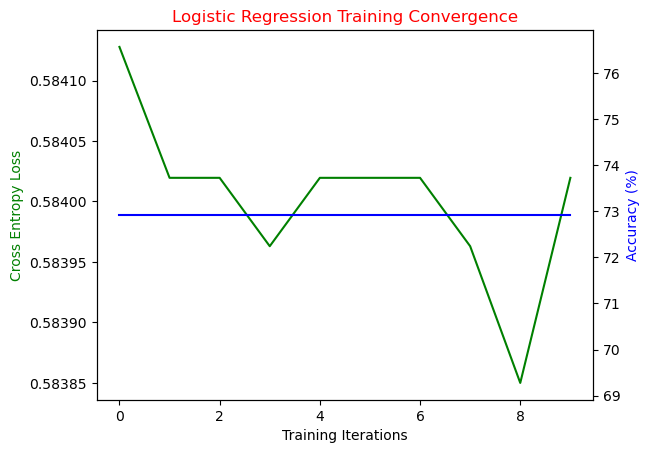

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


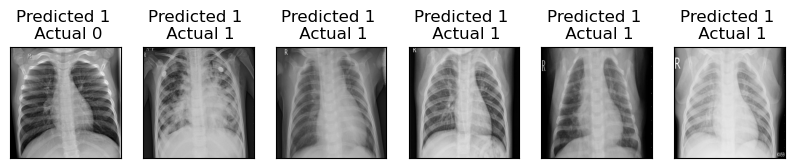

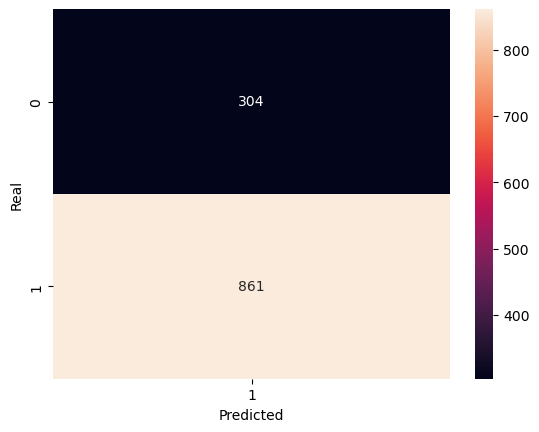

Time taken:  198.85651850700378
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs10_lr0.01_optimizerSGD,198.856519,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 10, learning rate: 0.01, optimizer: Adam
Current: 6/90
Training [10%]	Loss: 0.5854	Accuracy: 72.63%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5841	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [80%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5841	Accuracy: 72.92%
Training [100%]	Loss: 0.5839	Accuracy: 72.92%
Time taken:  228.9003622531891


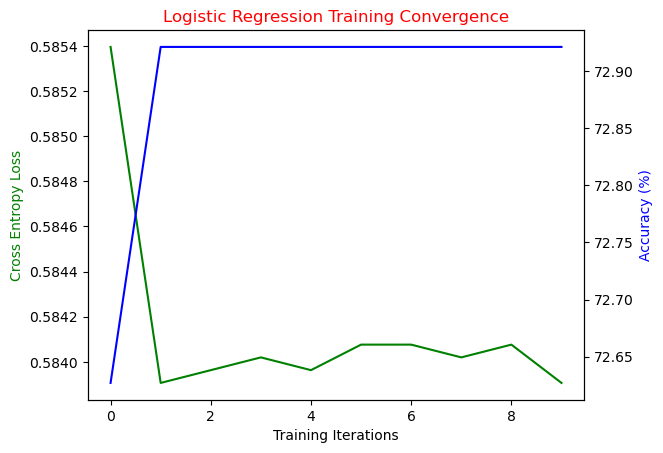

Performance on test data:
	Loss: 0.5759
	Accuracy: 73.91%


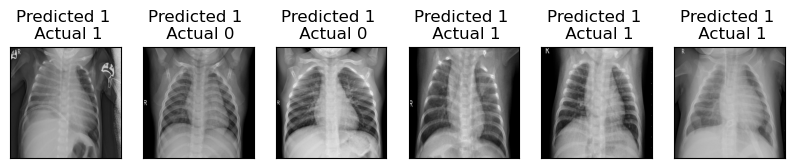

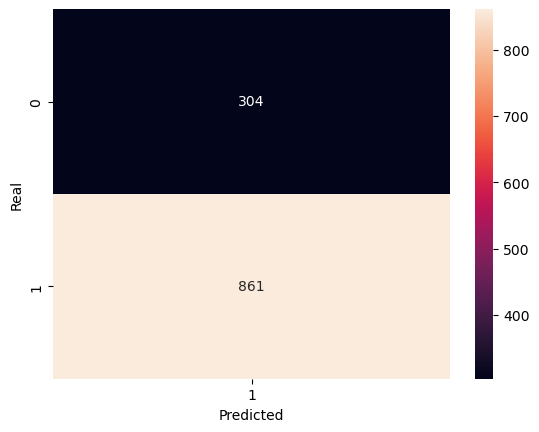

Time taken:  228.9003622531891
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs10_lr0.01_optimizerAdam,228.900362,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 10, learning rate: 0.1, optimizer: SGD
Current: 7/90
Training [10%]	Loss: 0.5846	Accuracy: 72.85%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5841	Accuracy: 72.92%
Training [100%]	Loss: 0.5840	Accuracy: 72.92%
Time taken:  192.21956396102905


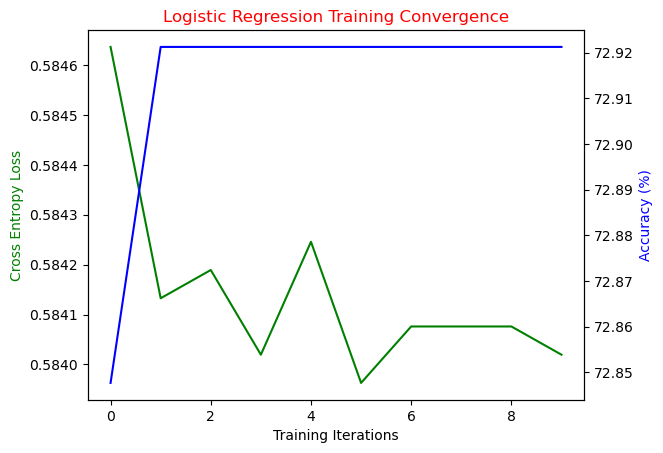

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


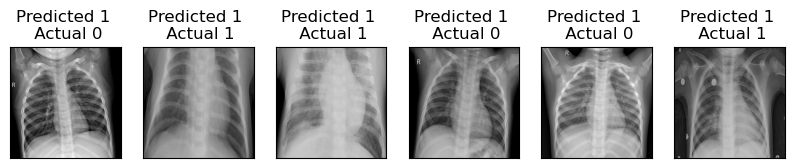

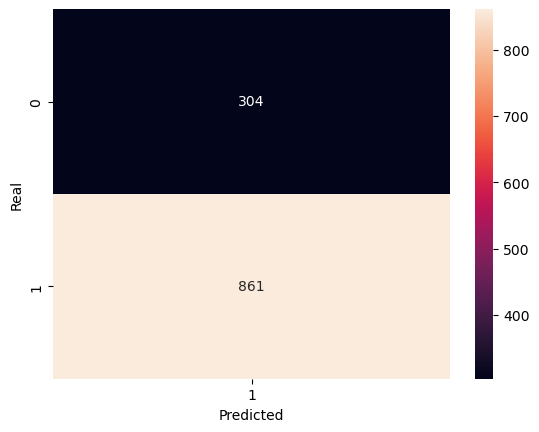

Time taken:  192.21956396102905
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs10_lr0.1_optimizerSGD,192.219564,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 10, learning rate: 0.1, optimizer: Adam
Current: 8/90
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [20%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5841	Accuracy: 72.92%
Training [70%]	Loss: 0.5840	Accuracy: 72.92%
Training [80%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5840	Accuracy: 72.92%
Training [100%]	Loss: 0.5840	Accuracy: 72.92%
Time taken:  229.27179980278015


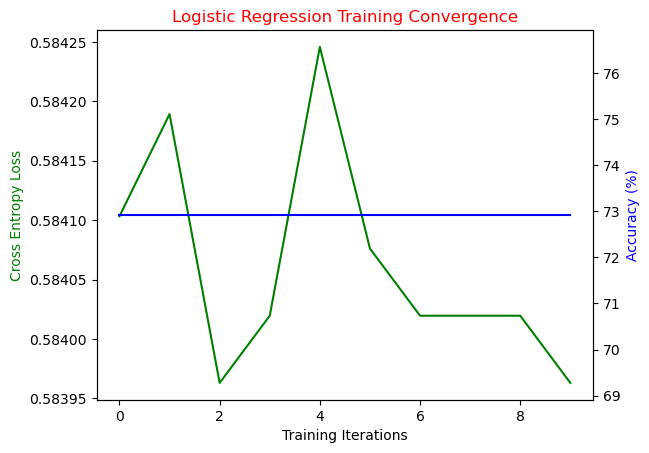

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


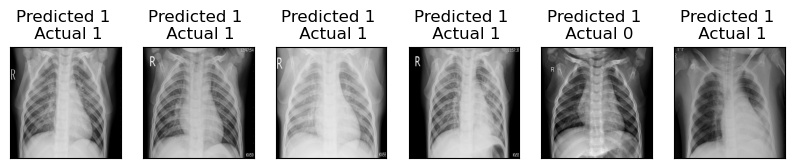

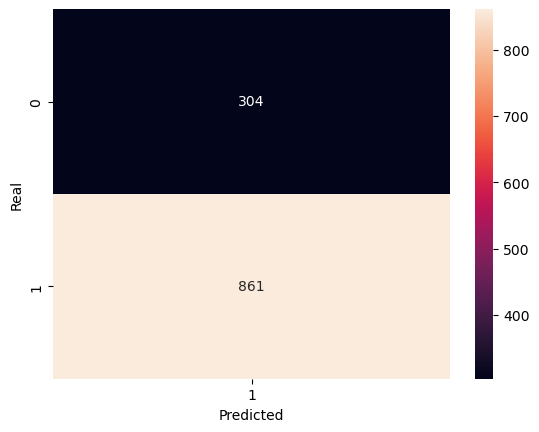

Time taken:  229.27179980278015
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs10_lr0.1_optimizerAdam,229.2718,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 10, learning rate: 1, optimizer: SGD
Current: 9/90
Training [10%]	Loss: 0.5847	Accuracy: 72.73%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5842	Accuracy: 72.92%
Training [100%]	Loss: 0.5840	Accuracy: 72.92%
Time taken:  193.82004833221436


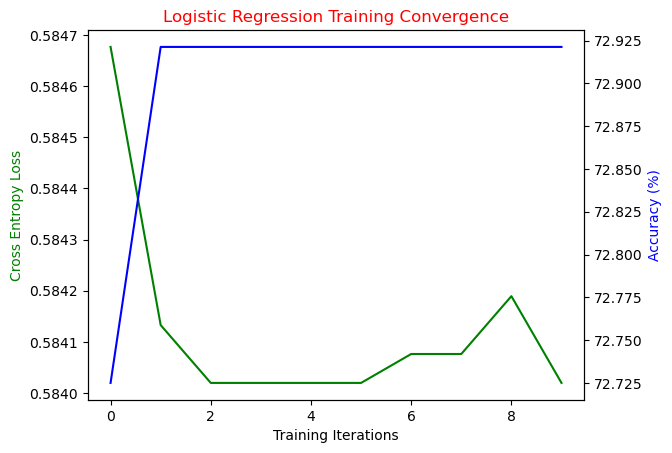

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


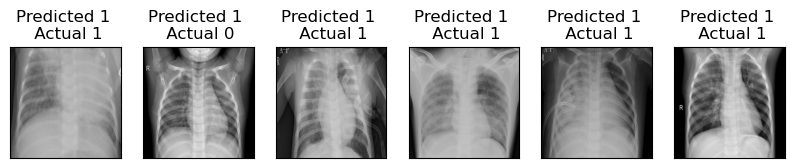

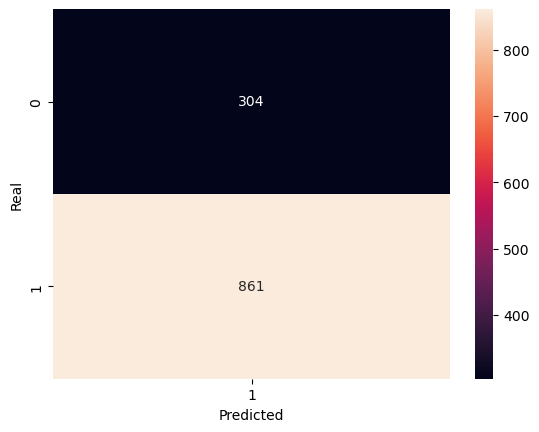

Time taken:  193.82004833221436
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs10_lr1_optimizerSGD,193.820048,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 10, learning rate: 1, optimizer: Adam
Current: 10/90
Training [10%]	Loss: 0.5851	Accuracy: 72.68%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5839	Accuracy: 72.92%
Training [100%]	Loss: 0.5840	Accuracy: 72.92%
Time taken:  235.94986009597778


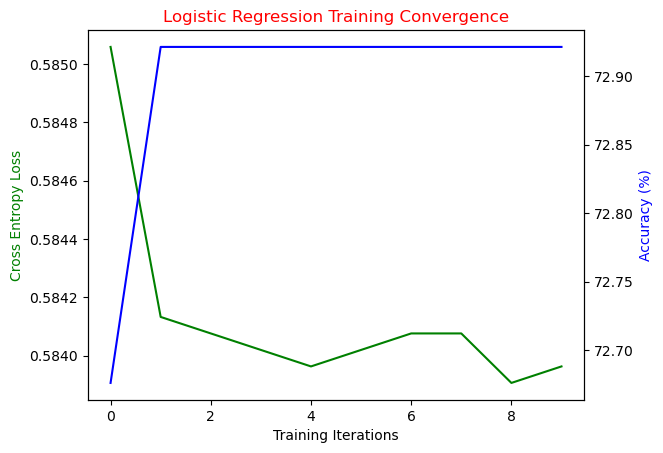

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


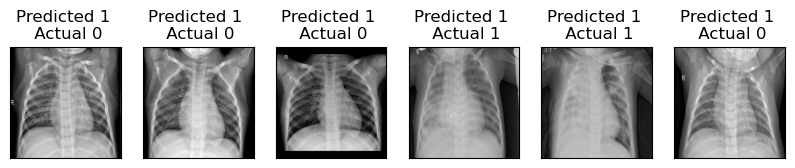

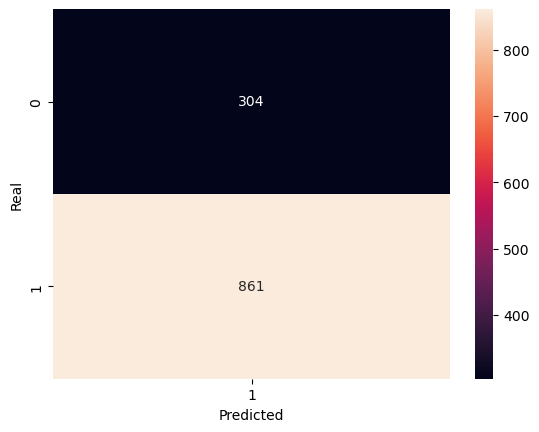

Time taken:  235.94986009597778
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs10_lr1_optimizerAdam,235.94986,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 20, learning rate: 0.0001, optimizer: SGD
Current: 11/90
Training [5%]	Loss: 0.5529	Accuracy: 72.63%
Training [10%]	Loss: 0.5013	Accuracy: 73.02%
Training [15%]	Loss: 0.4864	Accuracy: 73.29%
Training [20%]	Loss: 0.4792	Accuracy: 73.44%
Training [25%]	Loss: 0.4740	Accuracy: 73.53%
Training [30%]	Loss: 0.4715	Accuracy: 73.76%
Training [35%]	Loss: 0.4687	Accuracy: 73.76%
Training [40%]	Loss: 0.4666	Accuracy: 73.83%
Training [45%]	Loss: 0.4651	Accuracy: 74.03%
Training [50%]	Loss: 0.4641	Accuracy: 73.88%
Training [55%]	Loss: 0.4629	Accuracy: 74.20%
Training [60%]	Loss: 0.4620	Accuracy: 74.22%
Training [65%]	Loss: 0.4610	Accuracy: 74.27%
Training [70%]	Loss: 0.4600	Accuracy: 74.39%
Training [75%]	Loss: 0.4595	Accuracy: 74.32%
Training [80%]	Loss: 0.4588	Accuracy: 74.54%
Training [85%]	Loss: 0.4585	Accuracy: 74.54%
Training [90%]	Loss: 0.4582	Accuracy: 74.54%
Training [95%]	Loss: 0.4577	Accuracy: 74.66%
Training [100%]	Loss: 0.45

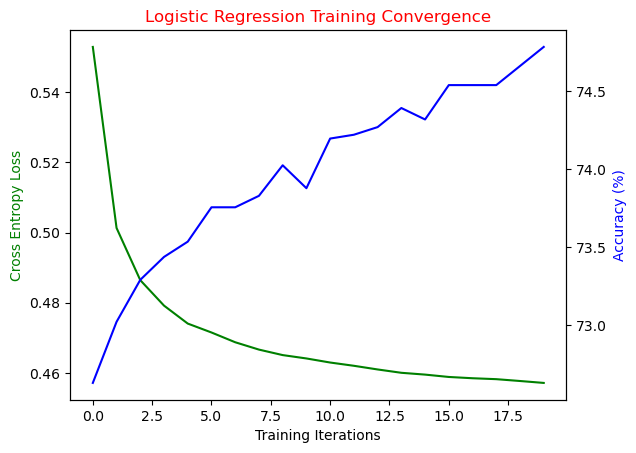

Performance on test data:
	Loss: 0.4499
	Accuracy: 75.79%


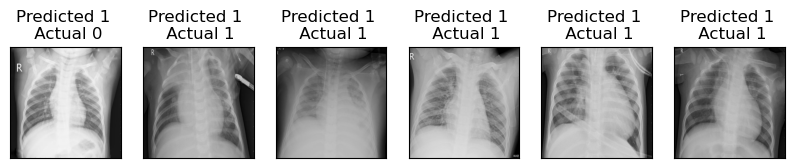

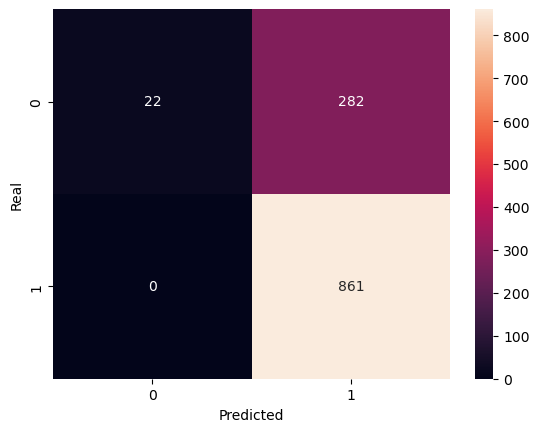

Time taken:  389.0391774177551
Test size: 1165
Total Accuracy:  0.7579399141630901
Total Precision:  0.7532808398950132
Total Recall:  1.0
Total F1 Score:  0.8592814371257484
Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.07      0.13       304
           1       0.75      1.00      0.86       861

    accuracy                           0.76      1165
   macro avg       0.88      0.54      0.50      1165
weighted avg       0.82      0.76      0.67      1165



,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs20_lr0.0001_optimizerSGD,389.039177,0.75794,0.753281,1.0,0.859281


Data Stored Successfully
Training with batch size: 16, epochs: 20, learning rate: 0.0001, optimizer: Adam
Current: 12/90
Training [5%]	Loss: 0.5843	Accuracy: 72.92%
Training [10%]	Loss: 0.5840	Accuracy: 72.92%
Training [15%]	Loss: 0.5840	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [25%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [35%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [45%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [55%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [65%]	Loss: 0.5841	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [75%]	Loss: 0.5841	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [85%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5841	Accuracy: 72.92%
Training [95%]	Loss: 0.5838	Accuracy: 72.92%
Training [100%]	Loss: 0.5

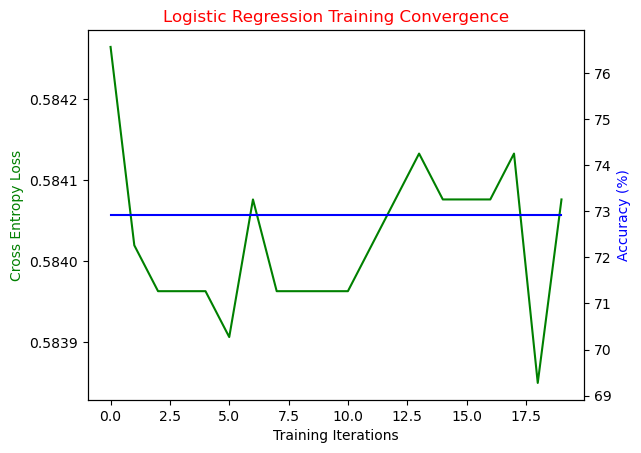

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


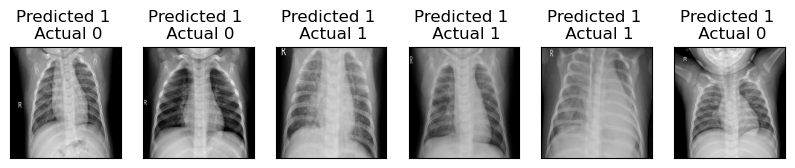

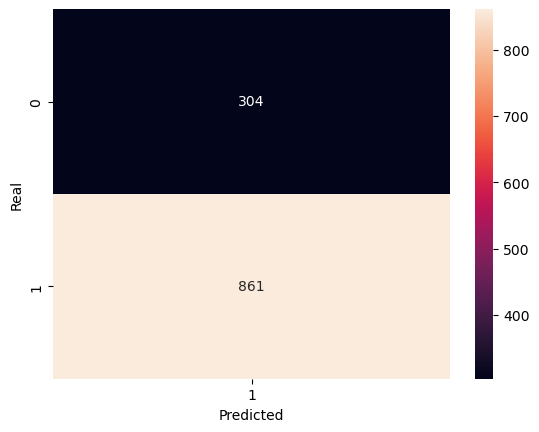

Time taken:  470.34647822380066
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs20_lr0.0001_optimizerAdam,470.346478,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 20, learning rate: 0.001, optimizer: SGD
Current: 13/90
Training [5%]	Loss: 0.5852	Accuracy: 72.70%
Training [10%]	Loss: 0.5838	Accuracy: 72.92%
Training [15%]	Loss: 0.5842	Accuracy: 72.92%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [25%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [35%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [45%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [55%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [65%]	Loss: 0.5841	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [75%]	Loss: 0.5840	Accuracy: 72.92%
Training [80%]	Loss: 0.5840	Accuracy: 72.92%
Training [85%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5841	Accuracy: 72.92%
Training [95%]	Loss: 0.5843	Accuracy: 72.92%
Training [100%]	Loss: 0.583

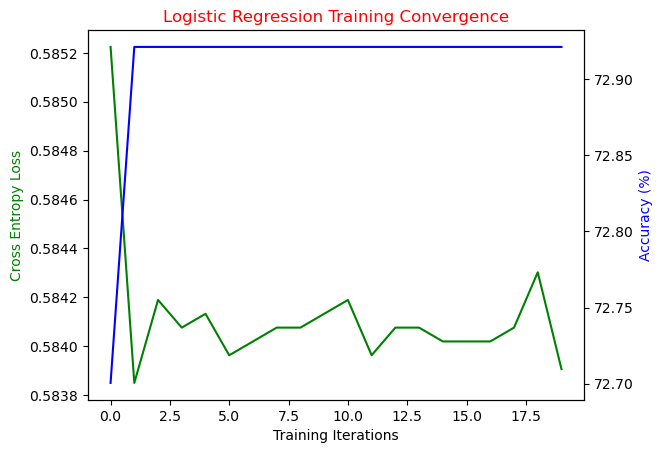

Performance on test data:
	Loss: 0.5759
	Accuracy: 73.91%


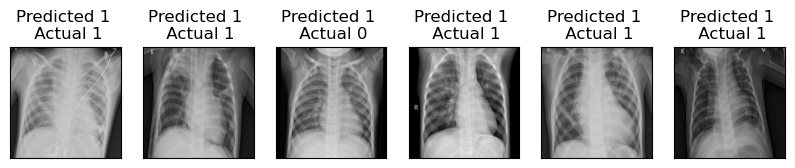

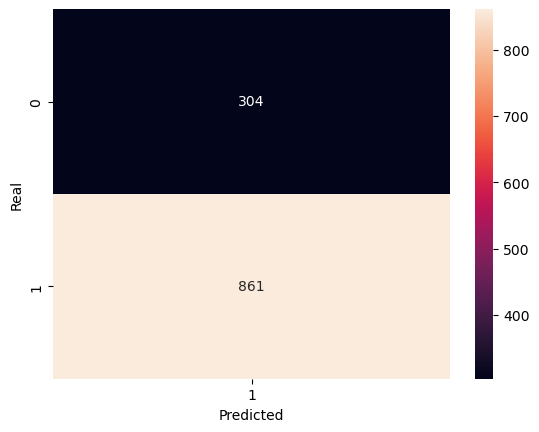

Time taken:  387.1545670032501
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs20_lr0.001_optimizerSGD,387.154567,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 20, learning rate: 0.001, optimizer: Adam
Current: 14/90
Training [5%]	Loss: 0.5845	Accuracy: 72.92%
Training [10%]	Loss: 0.5840	Accuracy: 72.92%
Training [15%]	Loss: 0.5841	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [25%]	Loss: 0.5838	Accuracy: 72.92%
Training [30%]	Loss: 0.5841	Accuracy: 72.92%
Training [35%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [45%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [55%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [65%]	Loss: 0.5843	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [75%]	Loss: 0.5841	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [85%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5841	Accuracy: 72.92%
Training [95%]	Loss: 0.5841	Accuracy: 72.92%
Training [100%]	Loss: 0.58

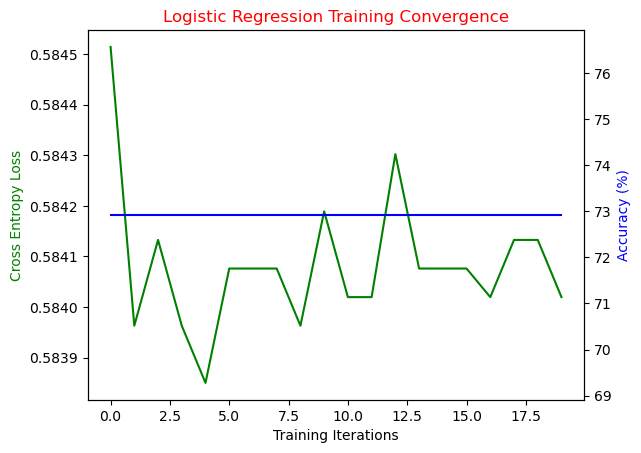

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


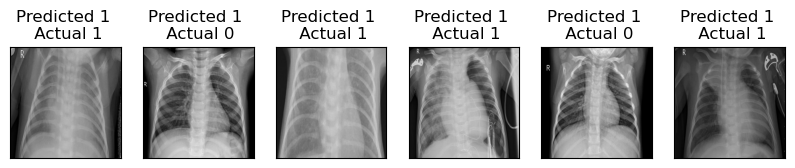

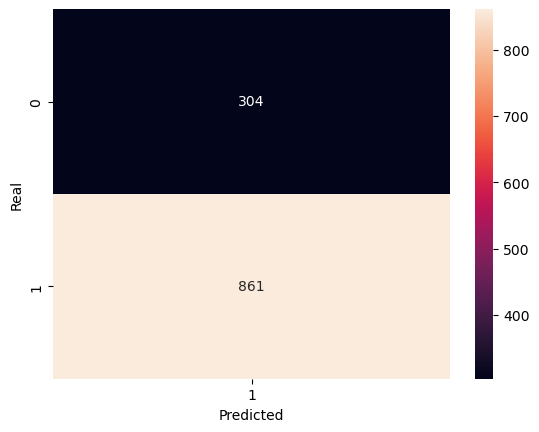

Time taken:  469.4729800224304
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs20_lr0.001_optimizerAdam,469.47298,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 20, learning rate: 0.01, optimizer: SGD
Current: 15/90
Training [5%]	Loss: 0.5848	Accuracy: 72.80%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [15%]	Loss: 0.5839	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [25%]	Loss: 0.5838	Accuracy: 72.92%
Training [30%]	Loss: 0.5841	Accuracy: 72.92%
Training [35%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [45%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [55%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [65%]	Loss: 0.5841	Accuracy: 72.92%
Training [70%]	Loss: 0.5840	Accuracy: 72.92%
Training [75%]	Loss: 0.5841	Accuracy: 72.92%
Training [80%]	Loss: 0.5842	Accuracy: 72.92%
Training [85%]	Loss: 0.5842	Accuracy: 72.92%
Training [90%]	Loss: 0.5840	Accuracy: 72.92%
Training [95%]	Loss: 0.5839	Accuracy: 72.92%
Training [100%]	Loss: 0.5840

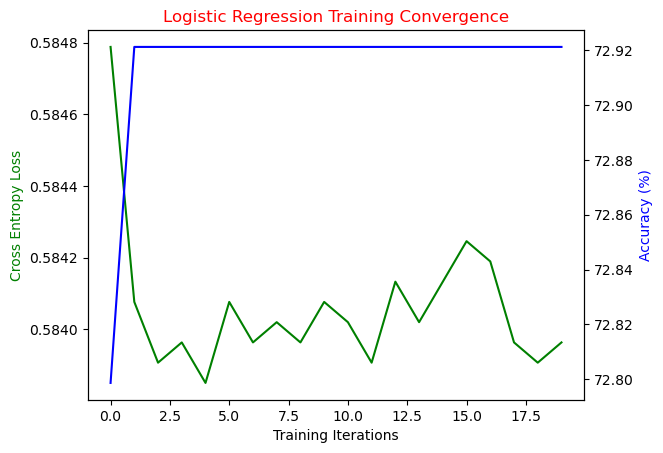

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


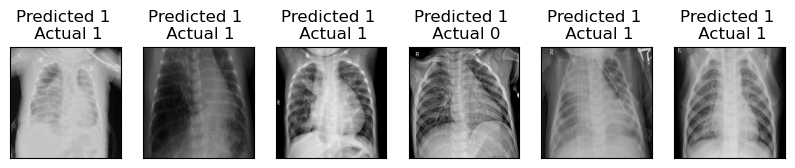

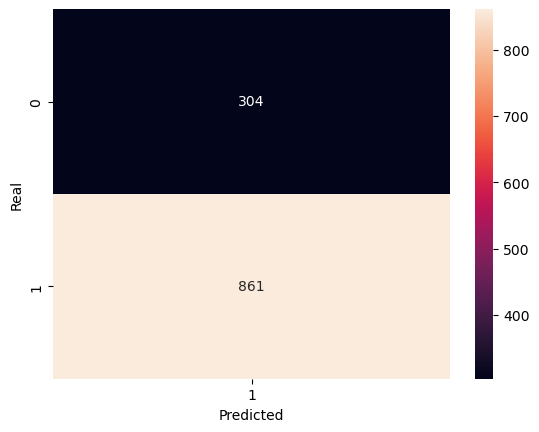

Time taken:  385.9541566371918
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs20_lr0.01_optimizerSGD,385.954157,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 20, learning rate: 0.01, optimizer: Adam
Current: 16/90
Training [5%]	Loss: 0.5849	Accuracy: 72.92%
Training [10%]	Loss: 0.5839	Accuracy: 72.92%
Training [15%]	Loss: 0.5839	Accuracy: 72.92%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [25%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [35%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [45%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [55%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [65%]	Loss: 0.5842	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [75%]	Loss: 0.5840	Accuracy: 72.92%
Training [80%]	Loss: 0.5839	Accuracy: 72.92%
Training [85%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5839	Accuracy: 72.92%
Training [95%]	Loss: 0.5841	Accuracy: 72.92%
Training [100%]	Loss: 0.584

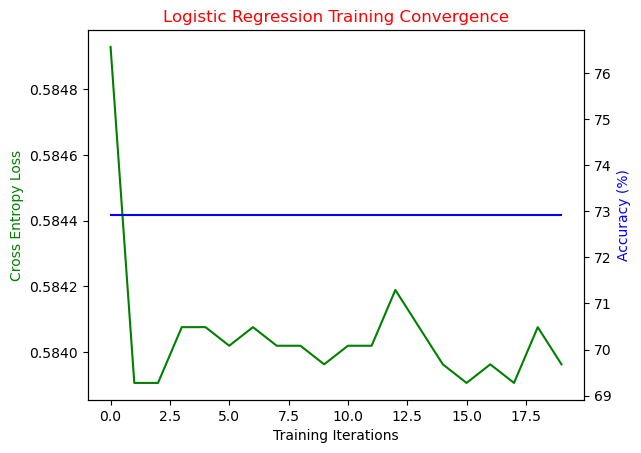

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


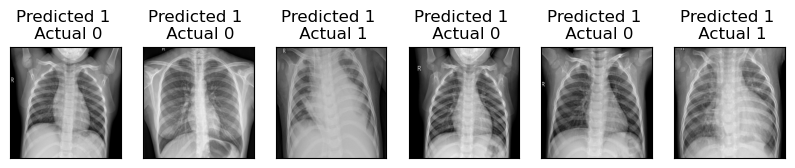

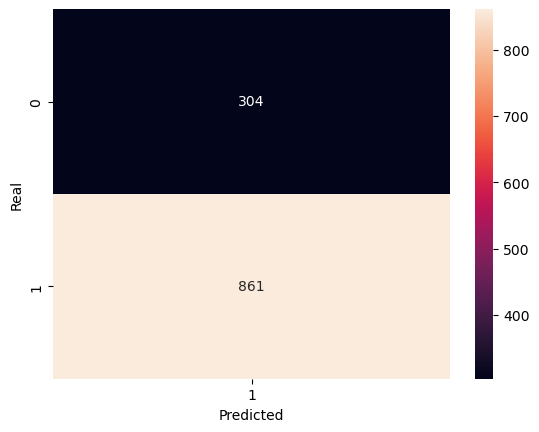

Time taken:  474.3691177368164
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs20_lr0.01_optimizerAdam,474.369118,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 20, learning rate: 0.1, optimizer: SGD
Current: 17/90
Training [5%]	Loss: 0.5844	Accuracy: 72.92%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [15%]	Loss: 0.5840	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [25%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [35%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [45%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [55%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5841	Accuracy: 72.92%
Training [65%]	Loss: 0.5839	Accuracy: 72.92%
Training [70%]	Loss: 0.5840	Accuracy: 72.92%
Training [75%]	Loss: 0.5841	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [85%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5839	Accuracy: 72.92%
Training [95%]	Loss: 0.5842	Accuracy: 72.92%
Training [100%]	Loss: 0.5839	

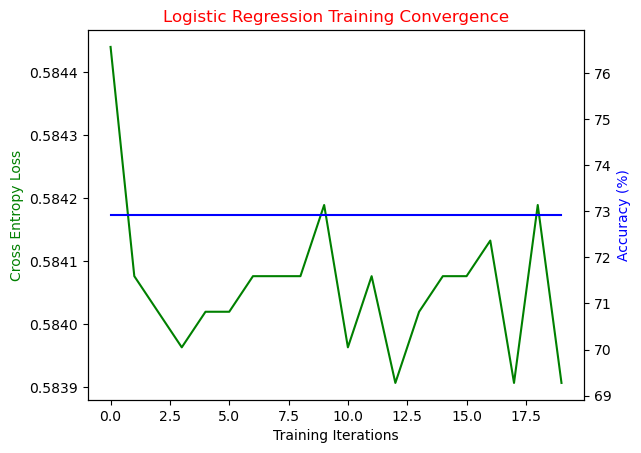

Performance on test data:
	Loss: 0.5759
	Accuracy: 73.91%


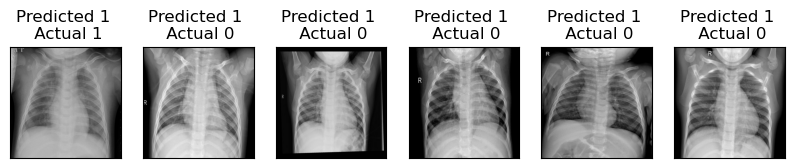

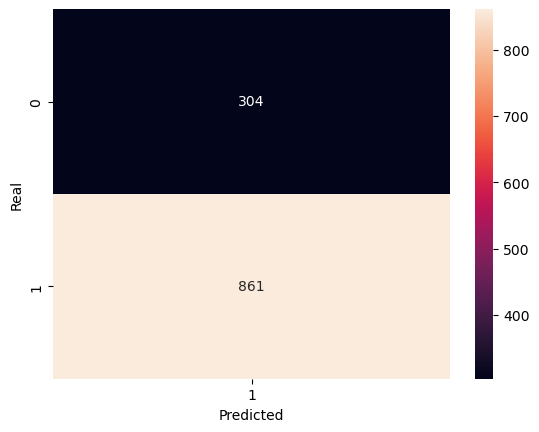

Time taken:  393.33760929107666
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs20_lr0.1_optimizerSGD,393.337609,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 20, learning rate: 0.1, optimizer: Adam
Current: 18/90
Training [5%]	Loss: 0.5843	Accuracy: 72.77%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [15%]	Loss: 0.5841	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [25%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5841	Accuracy: 72.92%
Training [35%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [45%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [55%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [65%]	Loss: 0.5840	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [75%]	Loss: 0.5841	Accuracy: 72.92%
Training [80%]	Loss: 0.5839	Accuracy: 72.92%
Training [85%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5841	Accuracy: 72.92%
Training [95%]	Loss: 0.5840	Accuracy: 72.92%
Training [100%]	Loss: 0.5840

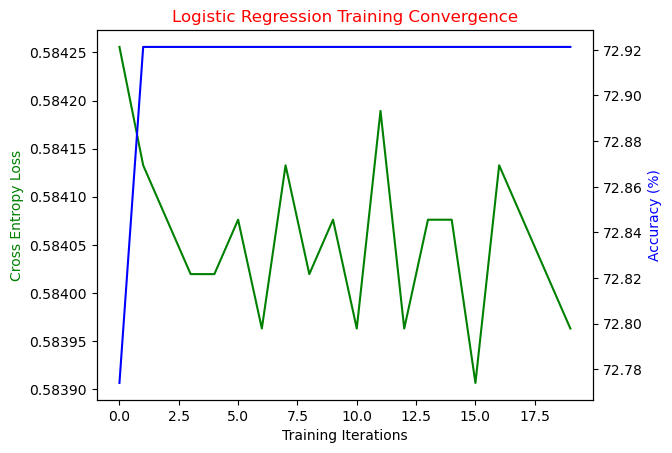

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


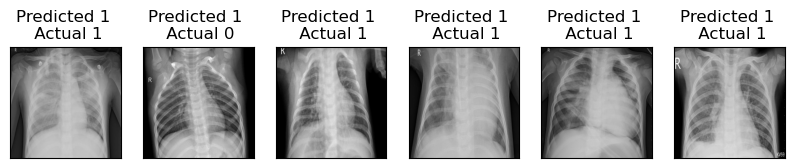

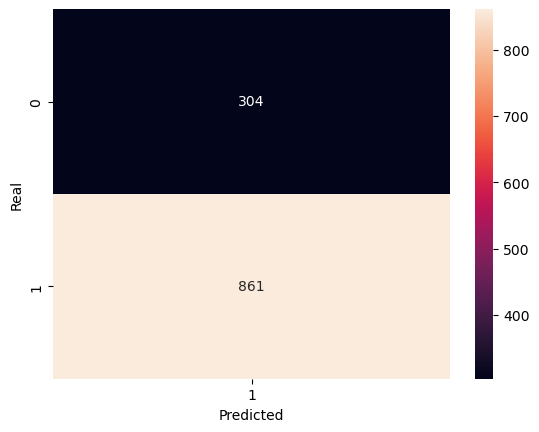

Time taken:  471.4960799217224
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs20_lr0.1_optimizerAdam,471.49608,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 20, learning rate: 1, optimizer: SGD
Current: 19/90
Training [5%]	Loss: 0.5848	Accuracy: 72.70%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [15%]	Loss: 0.5841	Accuracy: 72.92%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [25%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5841	Accuracy: 72.92%
Training [35%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [45%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [55%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5841	Accuracy: 72.92%
Training [65%]	Loss: 0.5841	Accuracy: 72.92%
Training [70%]	Loss: 0.5840	Accuracy: 72.92%
Training [75%]	Loss: 0.5840	Accuracy: 72.92%
Training [80%]	Loss: 0.5840	Accuracy: 72.92%
Training [85%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5842	Accuracy: 72.92%
Training [95%]	Loss: 0.5841	Accuracy: 72.92%
Training [100%]	Loss: 0.5841	Ac

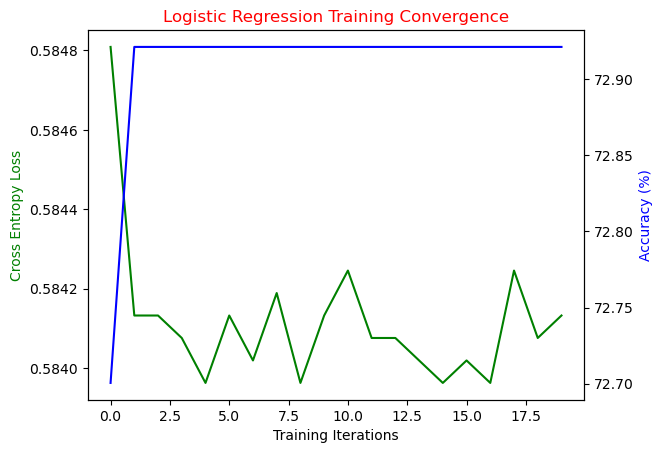

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


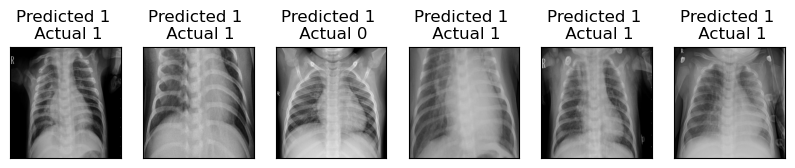

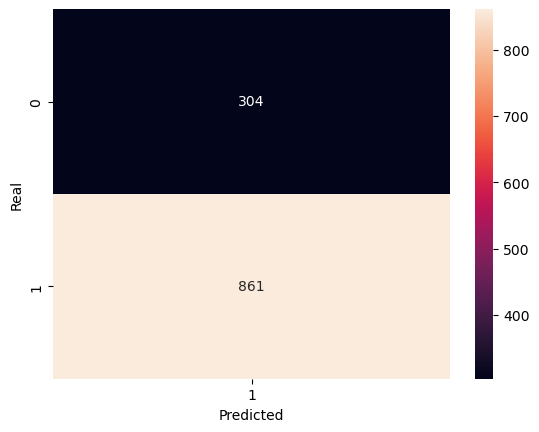

Time taken:  385.3488972187042
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs20_lr1_optimizerSGD,385.348897,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 20, learning rate: 1, optimizer: Adam
Current: 20/90
Training [5%]	Loss: 1.0418	Accuracy: 27.13%
Training [10%]	Loss: 1.0425	Accuracy: 27.08%
Training [15%]	Loss: 1.0422	Accuracy: 27.08%
Training [20%]	Loss: 1.0422	Accuracy: 27.08%
Training [25%]	Loss: 1.0424	Accuracy: 27.08%
Training [30%]	Loss: 1.0424	Accuracy: 27.08%
Training [35%]	Loss: 1.0424	Accuracy: 27.08%
Training [40%]	Loss: 1.0423	Accuracy: 27.08%
Training [45%]	Loss: 1.0424	Accuracy: 27.08%
Training [50%]	Loss: 1.0422	Accuracy: 27.08%
Training [55%]	Loss: 1.0423	Accuracy: 27.08%
Training [60%]	Loss: 1.0424	Accuracy: 27.08%
Training [65%]	Loss: 1.0425	Accuracy: 27.08%
Training [70%]	Loss: 1.0424	Accuracy: 27.08%
Training [75%]	Loss: 1.0425	Accuracy: 27.08%
Training [80%]	Loss: 1.0422	Accuracy: 27.08%
Training [85%]	Loss: 1.0423	Accuracy: 27.08%
Training [90%]	Loss: 1.0422	Accuracy: 27.08%
Training [95%]	Loss: 1.0422	Accuracy: 27.08%
Training [100%]	Loss: 1.0425	A

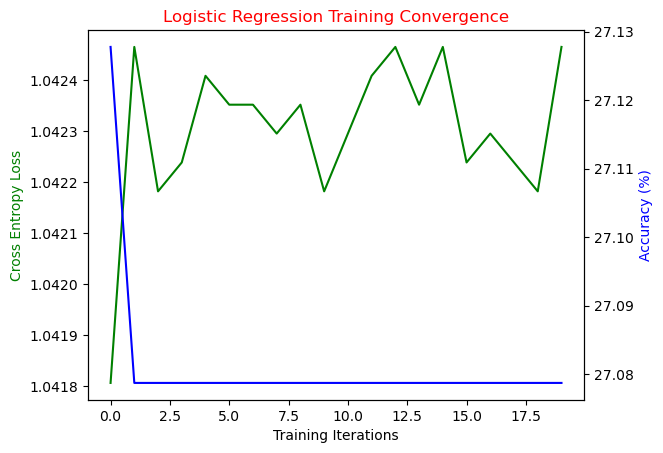

Performance on test data:
	Loss: 1.0505
	Accuracy: 26.09%


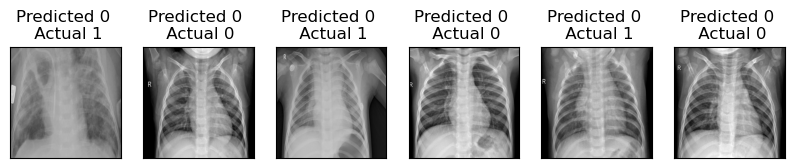

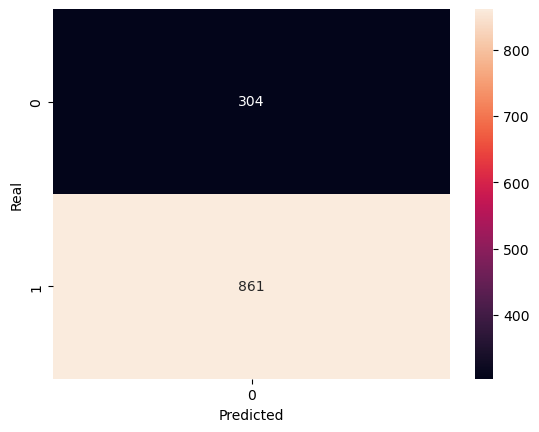

Time taken:  485.68366956710815
Test size: 1165
Total Accuracy:  0.2609442060085837
Total Precision:  0.0
Total Recall:  0.0
Total F1 Score:  0.0
Classification Report:

              precision    recall  f1-score   support

           0       0.26      1.00      0.41       304
           1       0.00      0.00      0.00       861

    accuracy                           0.26      1165
   macro avg       0.13      0.50      0.21      1165
weighted avg       0.07      0.26      0.11      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.p

,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs20_lr1_optimizerAdam,485.68367,0.260944,0.0,0.0,0.0


Data Stored Successfully
Training with batch size: 16, epochs: 30, learning rate: 0.0001, optimizer: SGD
Current: 21/90
Training [3%]	Loss: 0.5548	Accuracy: 74.81%
Training [7%]	Loss: 0.4780	Accuracy: 86.02%
Training [10%]	Loss: 0.4437	Accuracy: 89.21%
Training [13%]	Loss: 0.4287	Accuracy: 90.56%
Training [17%]	Loss: 0.4198	Accuracy: 91.32%
Training [20%]	Loss: 0.4135	Accuracy: 91.69%
Training [23%]	Loss: 0.4094	Accuracy: 92.03%
Training [27%]	Loss: 0.4052	Accuracy: 92.13%
Training [30%]	Loss: 0.4032	Accuracy: 92.42%
Training [33%]	Loss: 0.3998	Accuracy: 92.54%
Training [37%]	Loss: 0.3981	Accuracy: 92.74%
Training [40%]	Loss: 0.3963	Accuracy: 93.03%
Training [43%]	Loss: 0.3950	Accuracy: 93.06%
Training [47%]	Loss: 0.3926	Accuracy: 93.33%
Training [50%]	Loss: 0.3921	Accuracy: 93.11%
Training [53%]	Loss: 0.3901	Accuracy: 93.35%
Training [57%]	Loss: 0.3895	Accuracy: 93.11%
Training [60%]	Loss: 0.3881	Accuracy: 93.40%
Training [63%]	Loss: 0.3885	Accuracy: 93.28%
Training [67%]	Loss: 0.3862

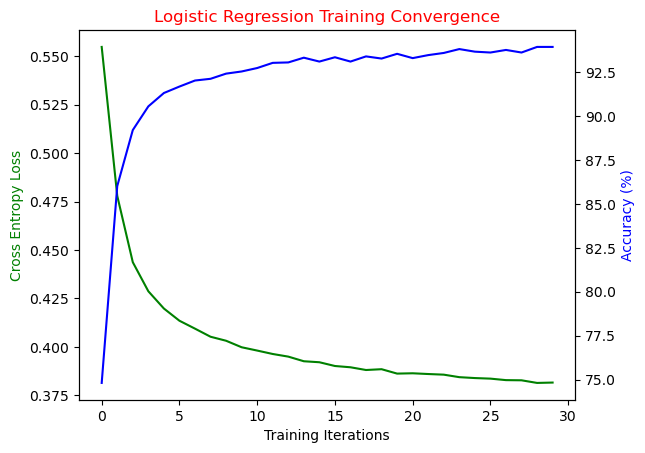

Performance on test data:
	Loss: 0.3755
	Accuracy: 94.51%


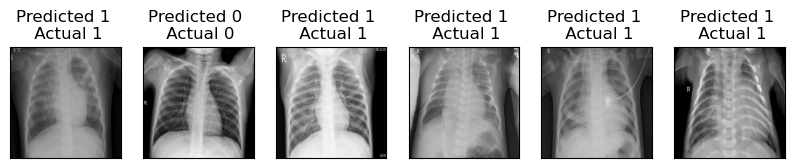

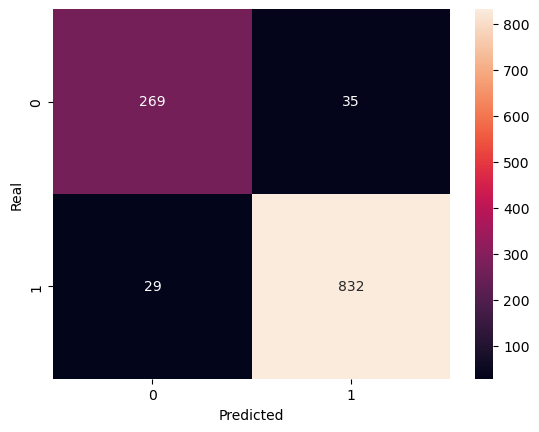

Time taken:  582.5460975170135
Test size: 1165
Total Accuracy:  0.9450643776824035
Total Precision:  0.9596309111880046
Total Recall:  0.9663182346109176
Total F1 Score:  0.962962962962963
Classification Report:

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       304
           1       0.96      0.97      0.96       861

    accuracy                           0.95      1165
   macro avg       0.93      0.93      0.93      1165
weighted avg       0.94      0.95      0.94      1165



,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs30_lr0.0001_optimizerSGD,582.546098,0.945064,0.959631,0.966318,0.962963


Data Stored Successfully
Training with batch size: 16, epochs: 30, learning rate: 0.0001, optimizer: Adam
Current: 22/90
Training [3%]	Loss: 0.5842	Accuracy: 72.82%
Training [7%]	Loss: 0.5841	Accuracy: 72.92%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [13%]	Loss: 0.5840	Accuracy: 72.92%
Training [17%]	Loss: 0.5842	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [23%]	Loss: 0.5841	Accuracy: 72.92%
Training [27%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [33%]	Loss: 0.5841	Accuracy: 72.92%
Training [37%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [43%]	Loss: 0.5840	Accuracy: 72.92%
Training [47%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5843	Accuracy: 72.92%
Training [53%]	Loss: 0.5841	Accuracy: 72.92%
Training [57%]	Loss: 0.5841	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [63%]	Loss: 0.5840	Accuracy: 72.92%
Training [67%]	Loss: 0.584

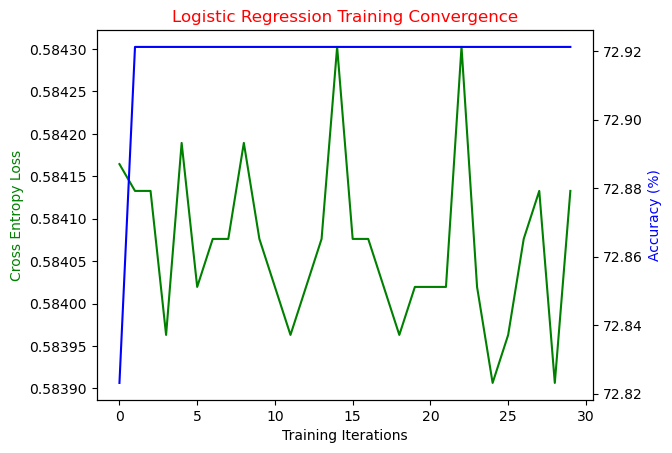

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


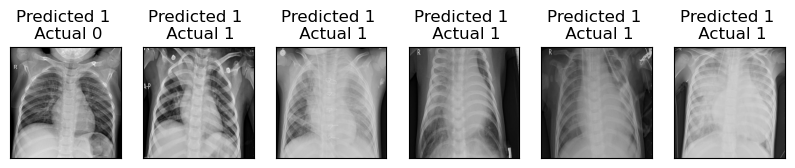

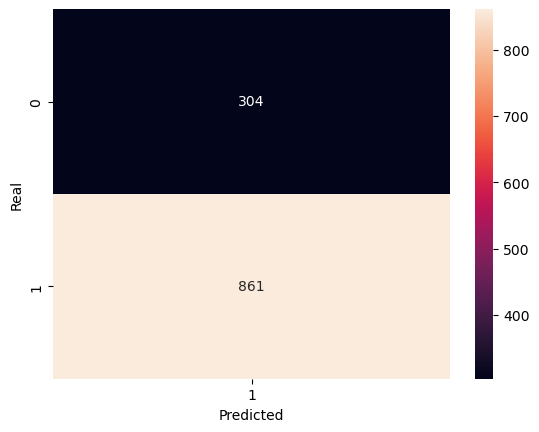

Time taken:  703.2330949306488
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs30_lr0.0001_optimizerAdam,703.233095,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 30, learning rate: 0.001, optimizer: SGD
Current: 23/90
Training [3%]	Loss: 0.5842	Accuracy: 72.92%
Training [7%]	Loss: 0.5840	Accuracy: 72.92%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [13%]	Loss: 0.5841	Accuracy: 72.92%
Training [17%]	Loss: 0.5841	Accuracy: 72.92%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [23%]	Loss: 0.5841	Accuracy: 72.92%
Training [27%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5841	Accuracy: 72.92%
Training [33%]	Loss: 0.5841	Accuracy: 72.92%
Training [37%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [43%]	Loss: 0.5839	Accuracy: 72.92%
Training [47%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [53%]	Loss: 0.5840	Accuracy: 72.92%
Training [57%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5841	Accuracy: 72.92%
Training [63%]	Loss: 0.5841	Accuracy: 72.92%
Training [67%]	Loss: 0.5841	

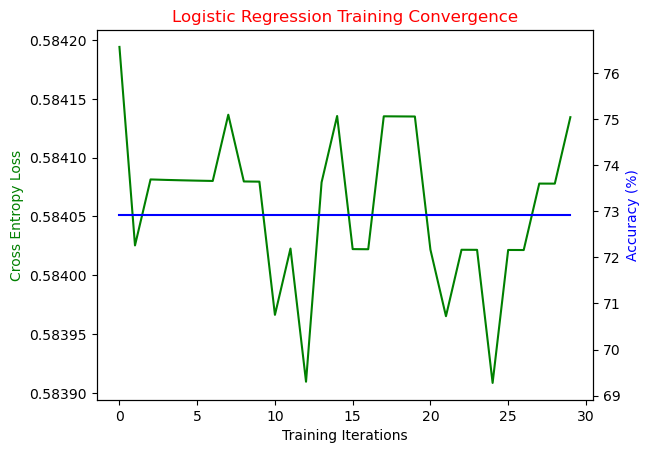

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


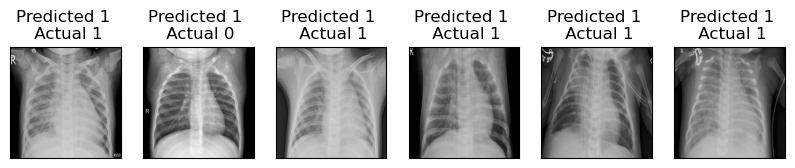

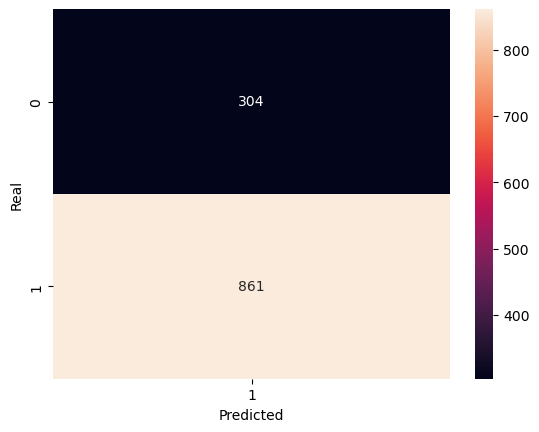

Time taken:  581.423731803894
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs30_lr0.001_optimizerSGD,581.423732,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 30, learning rate: 0.001, optimizer: Adam
Current: 24/90
Training [3%]	Loss: 0.5846	Accuracy: 72.87%
Training [7%]	Loss: 0.5840	Accuracy: 72.92%
Training [10%]	Loss: 0.5840	Accuracy: 72.92%
Training [13%]	Loss: 0.5841	Accuracy: 72.92%
Training [17%]	Loss: 0.5840	Accuracy: 72.92%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [23%]	Loss: 0.5839	Accuracy: 72.92%
Training [27%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [33%]	Loss: 0.5839	Accuracy: 72.92%
Training [37%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [43%]	Loss: 0.5840	Accuracy: 72.92%
Training [47%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [53%]	Loss: 0.5840	Accuracy: 72.92%
Training [57%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [63%]	Loss: 0.5841	Accuracy: 72.92%
Training [67%]	Loss: 0.5840

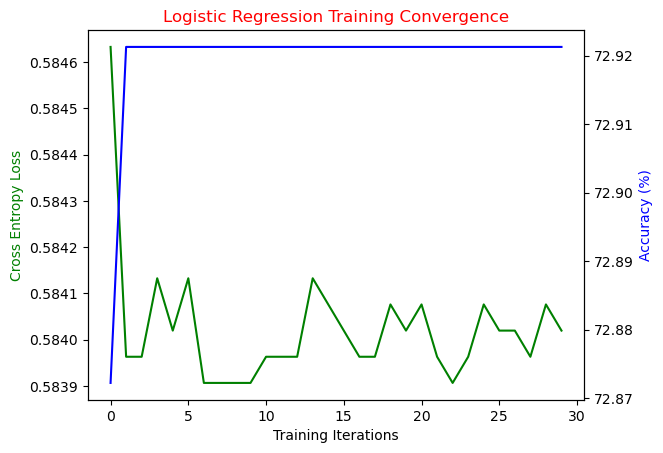

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


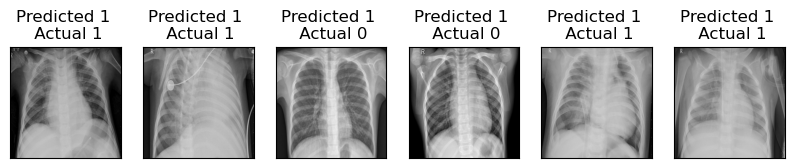

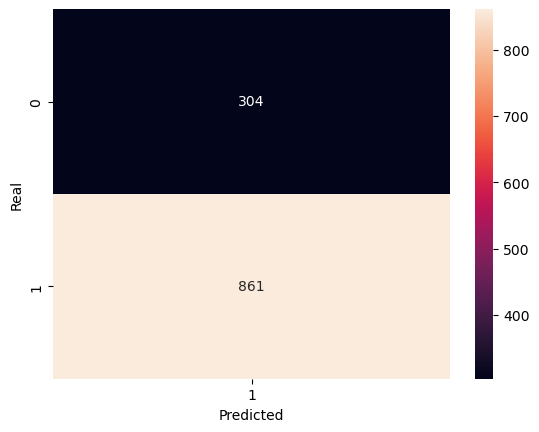

Time taken:  707.0185761451721
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs30_lr0.001_optimizerAdam,707.018576,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 30, learning rate: 0.01, optimizer: SGD
Current: 25/90
Training [3%]	Loss: 0.5876	Accuracy: 72.53%
Training [7%]	Loss: 0.5840	Accuracy: 72.92%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [13%]	Loss: 0.5841	Accuracy: 72.92%
Training [17%]	Loss: 0.5841	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [23%]	Loss: 0.5842	Accuracy: 72.92%
Training [27%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [33%]	Loss: 0.5881	Accuracy: 71.28%
Training [37%]	Loss: 0.6931	Accuracy: 27.27%
Training [40%]	Loss: 0.6931	Accuracy: 27.27%
Training [43%]	Loss: 0.6931	Accuracy: 27.27%
Training [47%]	Loss: 0.6931	Accuracy: 27.27%
Training [50%]	Loss: 0.6931	Accuracy: 27.27%
Training [53%]	Loss: 0.6931	Accuracy: 27.27%
Training [57%]	Loss: 0.6931	Accuracy: 27.27%
Training [60%]	Loss: 0.6931	Accuracy: 27.27%
Training [63%]	Loss: 0.6931	Accuracy: 27.27%
Training [67%]	Loss: 0.6931	A

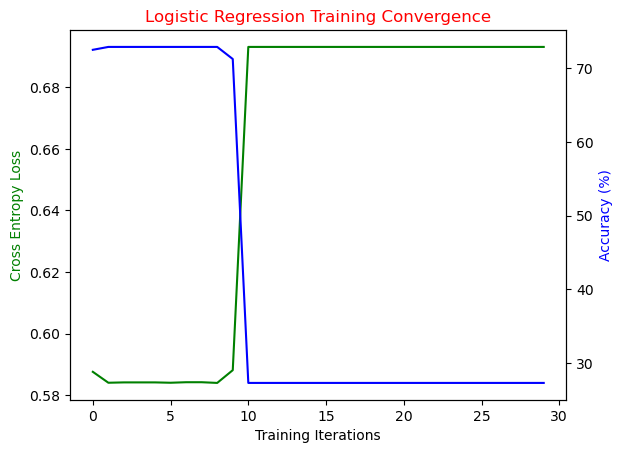

Performance on test data:
	Loss: 0.6931
	Accuracy: 26.18%


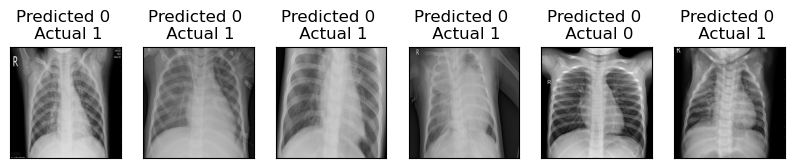

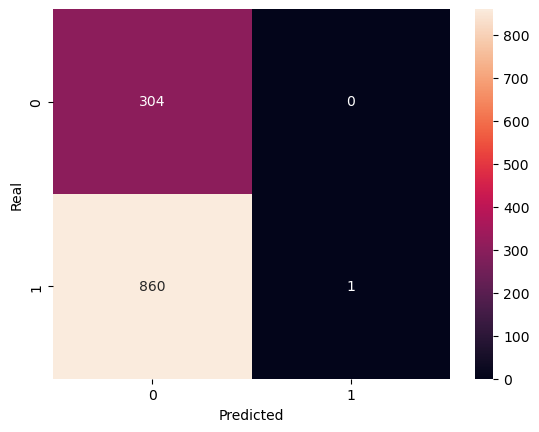

Time taken:  577.637809753418
Test size: 1165
Total Accuracy:  0.26180257510729615
Total Precision:  1.0
Total Recall:  0.0011614401858304297
Total F1 Score:  0.002320185614849188
Classification Report:

              precision    recall  f1-score   support

           0       0.26      1.00      0.41       304
           1       1.00      0.00      0.00       861

    accuracy                           0.26      1165
   macro avg       0.63      0.50      0.21      1165
weighted avg       0.81      0.26      0.11      1165



,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs30_lr0.01_optimizerSGD,577.63781,0.261803,1.0,0.001161,0.00232


Data Stored Successfully
Training with batch size: 16, epochs: 30, learning rate: 0.01, optimizer: Adam
Current: 26/90
Training [3%]	Loss: 0.5844	Accuracy: 72.77%
Training [7%]	Loss: 0.5840	Accuracy: 72.92%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [13%]	Loss: 0.5841	Accuracy: 72.92%
Training [17%]	Loss: 0.5840	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [23%]	Loss: 0.5841	Accuracy: 72.92%
Training [27%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [33%]	Loss: 0.5842	Accuracy: 72.92%
Training [37%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [43%]	Loss: 0.5840	Accuracy: 72.92%
Training [47%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [53%]	Loss: 0.5840	Accuracy: 72.92%
Training [57%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [63%]	Loss: 0.5841	Accuracy: 72.92%
Training [67%]	Loss: 0.5840	

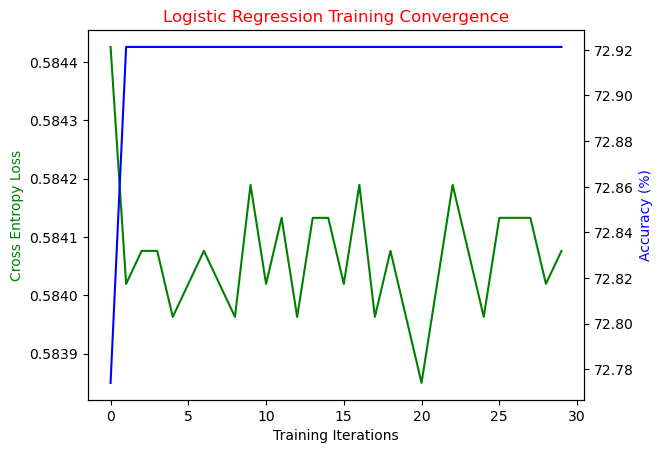

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


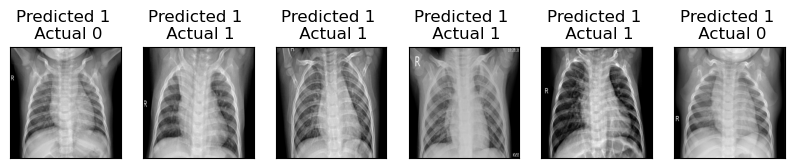

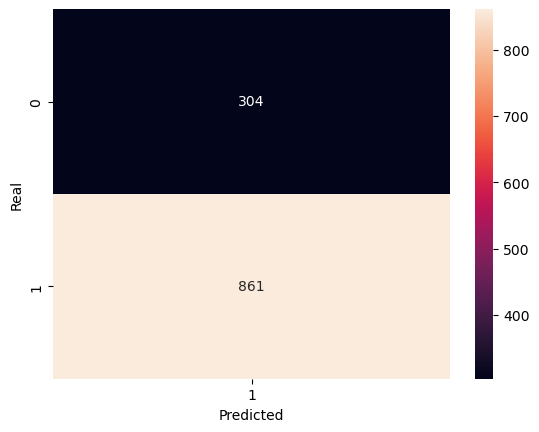

Time taken:  707.8796467781067
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs30_lr0.01_optimizerAdam,707.879647,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 30, learning rate: 0.1, optimizer: SGD
Current: 27/90
Training [3%]	Loss: 0.5849	Accuracy: 72.92%
Training [7%]	Loss: 0.5840	Accuracy: 72.92%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [13%]	Loss: 0.5841	Accuracy: 72.92%
Training [17%]	Loss: 0.5841	Accuracy: 72.92%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [23%]	Loss: 0.5840	Accuracy: 72.92%
Training [27%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [33%]	Loss: 0.5840	Accuracy: 72.92%
Training [37%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [43%]	Loss: 0.5842	Accuracy: 72.92%
Training [47%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [53%]	Loss: 0.5841	Accuracy: 72.92%
Training [57%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [63%]	Loss: 0.5840	Accuracy: 72.92%
Training [67%]	Loss: 0.5839	Ac

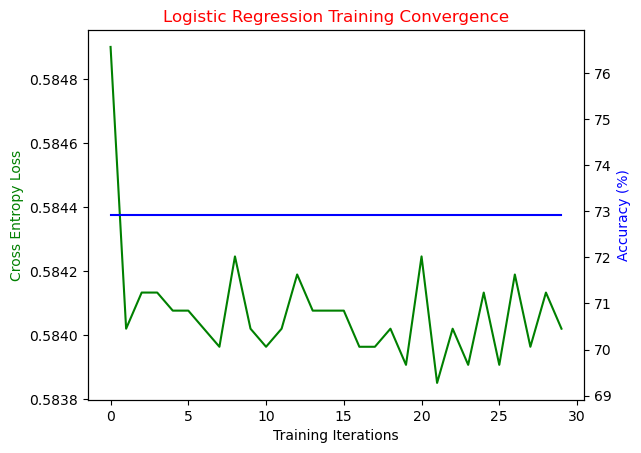

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


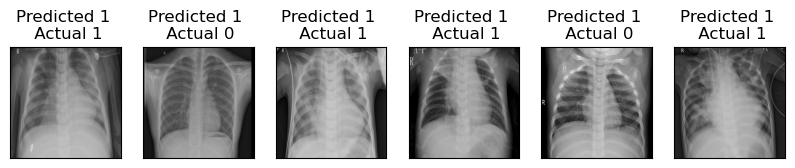

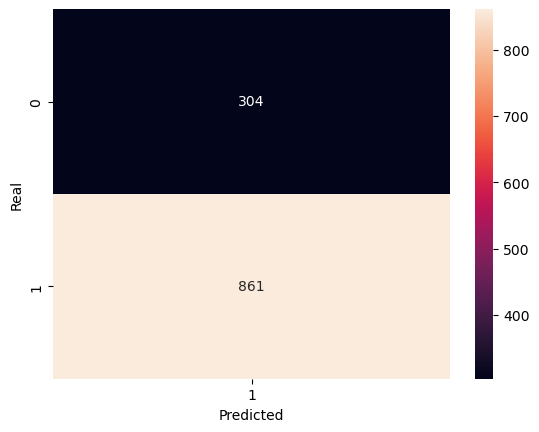

Time taken:  581.8221063613892
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs30_lr0.1_optimizerSGD,581.822106,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 30, learning rate: 0.1, optimizer: Adam
Current: 28/90
Training [3%]	Loss: 0.5853	Accuracy: 72.68%
Training [7%]	Loss: 0.5841	Accuracy: 72.92%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [13%]	Loss: 0.5840	Accuracy: 72.92%
Training [17%]	Loss: 0.5842	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [23%]	Loss: 0.5841	Accuracy: 72.92%
Training [27%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5841	Accuracy: 72.92%
Training [33%]	Loss: 0.5841	Accuracy: 72.92%
Training [37%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [43%]	Loss: 0.5842	Accuracy: 72.92%
Training [47%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [53%]	Loss: 0.5840	Accuracy: 72.92%
Training [57%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [63%]	Loss: 0.5841	Accuracy: 72.92%
Training [67%]	Loss: 0.5842	A

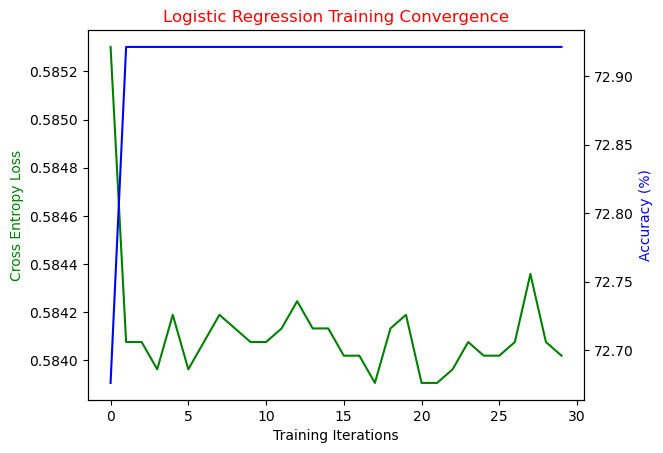

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


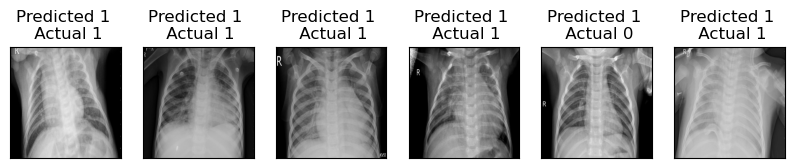

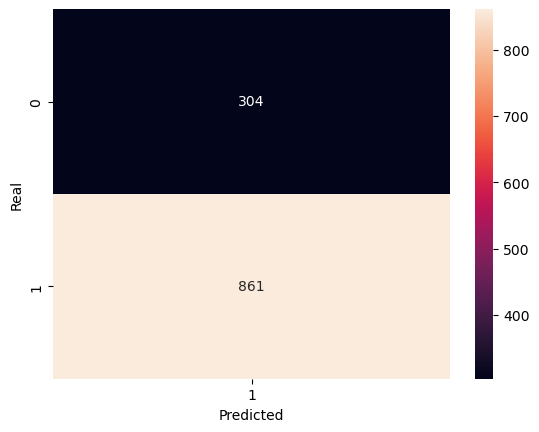

Time taken:  711.5526232719421
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs30_lr0.1_optimizerAdam,711.552623,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 30, learning rate: 1, optimizer: SGD
Current: 29/90
Training [3%]	Loss: 0.5842	Accuracy: 72.85%
Training [7%]	Loss: 0.5839	Accuracy: 72.92%
Training [10%]	Loss: 0.5840	Accuracy: 72.92%
Training [13%]	Loss: 0.5842	Accuracy: 72.92%
Training [17%]	Loss: 0.5841	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [23%]	Loss: 0.5841	Accuracy: 72.92%
Training [27%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [33%]	Loss: 0.5842	Accuracy: 72.92%
Training [37%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [43%]	Loss: 0.5840	Accuracy: 72.92%
Training [47%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [53%]	Loss: 0.5841	Accuracy: 72.92%
Training [57%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5841	Accuracy: 72.92%
Training [63%]	Loss: 0.5841	Accuracy: 72.92%
Training [67%]	Loss: 0.5841	Accu

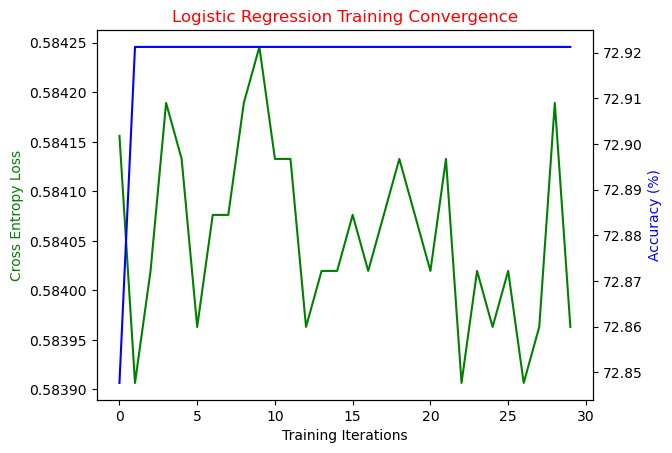

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


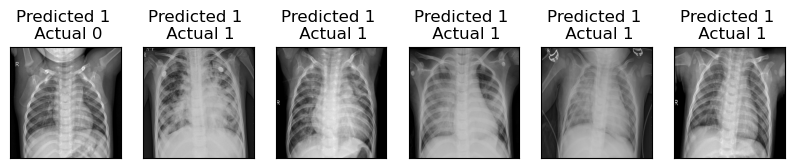

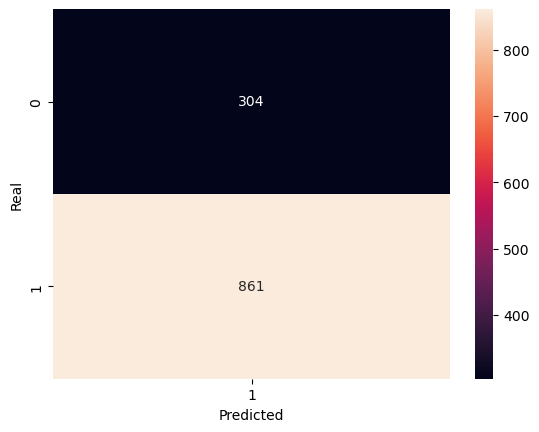

Time taken:  580.5647571086884
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs30_lr1_optimizerSGD,580.564757,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 16, epochs: 30, learning rate: 1, optimizer: Adam
Current: 30/90
Training [3%]	Loss: 0.5846	Accuracy: 72.92%
Training [7%]	Loss: 0.5841	Accuracy: 72.92%
Training [10%]	Loss: 0.5841	Accuracy: 72.92%
Training [13%]	Loss: 0.5840	Accuracy: 72.92%
Training [17%]	Loss: 0.5842	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [23%]	Loss: 0.5839	Accuracy: 72.92%
Training [27%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [33%]	Loss: 0.5841	Accuracy: 72.92%
Training [37%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [43%]	Loss: 0.5841	Accuracy: 72.92%
Training [47%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [53%]	Loss: 0.5840	Accuracy: 72.92%
Training [57%]	Loss: 0.5841	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [63%]	Loss: 0.5841	Accuracy: 72.92%
Training [67%]	Loss: 0.5840	Acc

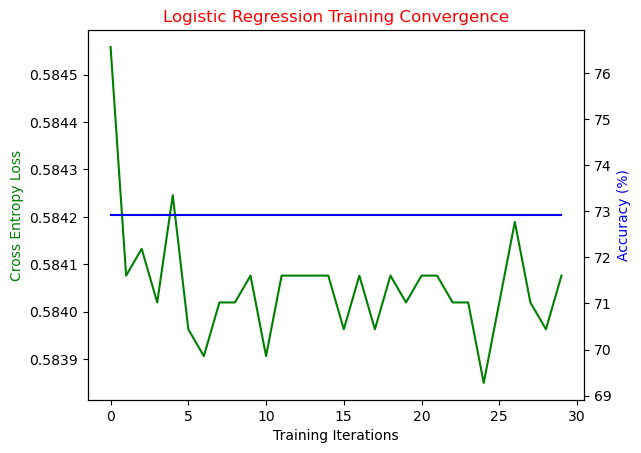

Performance on test data:
	Loss: 0.5760
	Accuracy: 73.91%


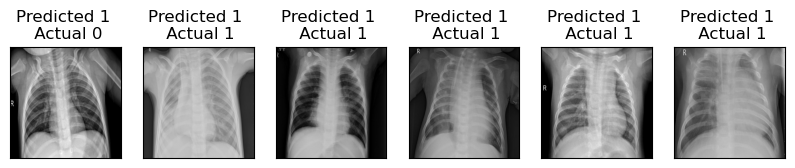

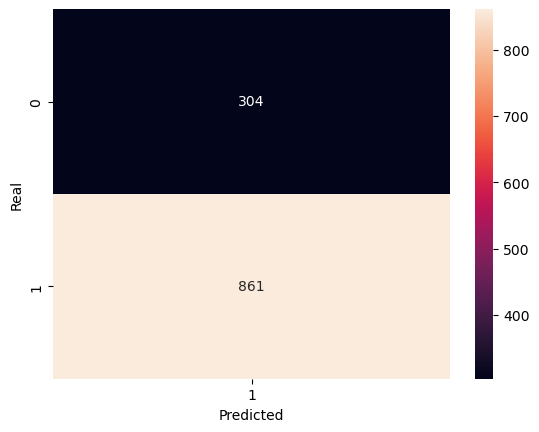

Time taken:  739.7941327095032
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch16_epochs30_lr1_optimizerAdam,739.794133,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 10, learning rate: 0.0001, optimizer: SGD
Current: 31/90
Training [10%]	Loss: 0.5713	Accuracy: 72.92%
Training [20%]	Loss: 0.5247	Accuracy: 72.92%
Training [30%]	Loss: 0.5033	Accuracy: 73.02%
Training [40%]	Loss: 0.4936	Accuracy: 73.14%
Training [50%]	Loss: 0.4872	Accuracy: 73.39%
Training [60%]	Loss: 0.4830	Accuracy: 73.68%
Training [70%]	Loss: 0.4798	Accuracy: 73.93%
Training [80%]	Loss: 0.4769	Accuracy: 74.07%
Training [90%]	Loss: 0.4737	Accuracy: 74.34%
Training [100%]	Loss: 0.4722	Accuracy: 74.91%
Time taken:  191.06178379058838


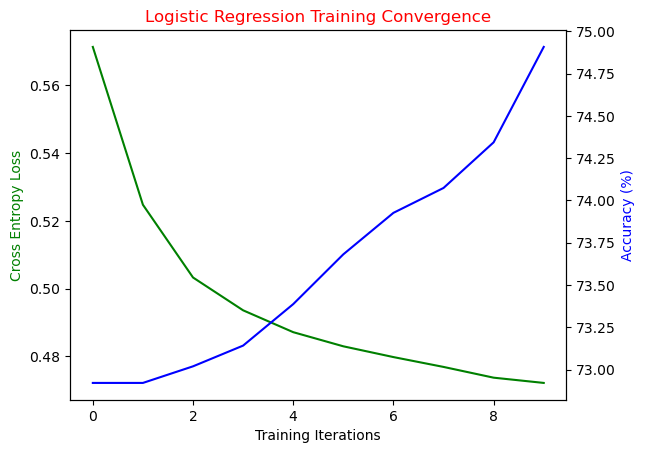

Performance on test data:
	Loss: 0.4649
	Accuracy: 74.76%


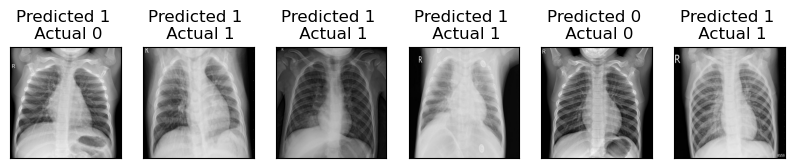

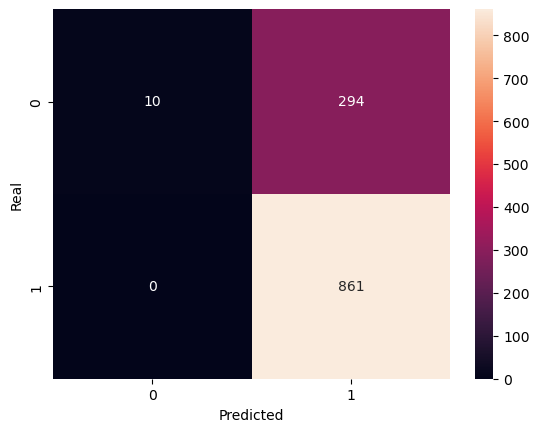

Time taken:  191.06178379058838
Test size: 1165
Total Accuracy:  0.7476394849785408
Total Precision:  0.7454545454545455
Total Recall:  1.0
Total F1 Score:  0.8541666666666666
Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.03      0.06       304
           1       0.75      1.00      0.85       861

    accuracy                           0.75      1165
   macro avg       0.87      0.52      0.46      1165
weighted avg       0.81      0.75      0.65      1165



,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs10_lr0.0001_optimizerSGD,191.061784,0.747639,0.745455,1.0,0.854167


Data Stored Successfully
Training with batch size: 32, epochs: 10, learning rate: 0.0001, optimizer: Adam
Current: 32/90
Training [10%]	Loss: 0.5854	Accuracy: 72.92%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5835	Accuracy: 72.92%
Training [40%]	Loss: 0.5846	Accuracy: 72.92%
Training [50%]	Loss: 0.5839	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [70%]	Loss: 0.5842	Accuracy: 72.92%
Training [80%]	Loss: 0.5839	Accuracy: 72.92%
Training [90%]	Loss: 0.5846	Accuracy: 72.92%
Training [100%]	Loss: 0.5839	Accuracy: 72.92%
Time taken:  202.72056889533997


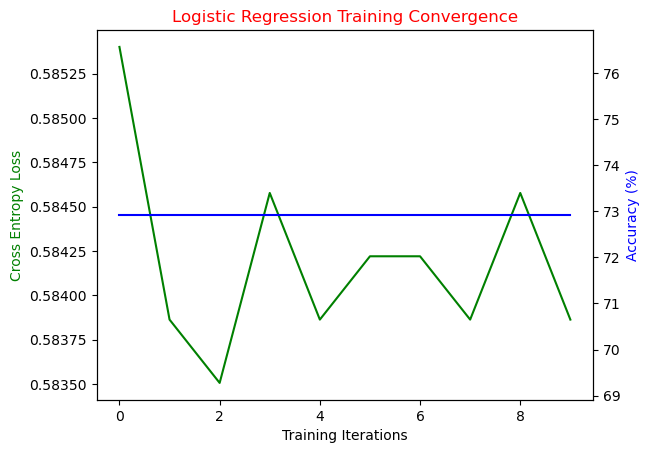

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


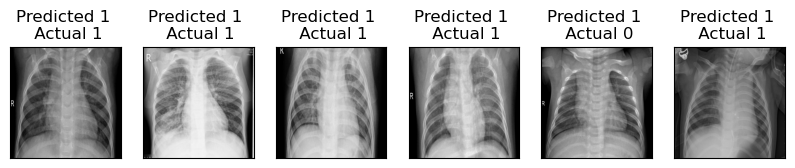

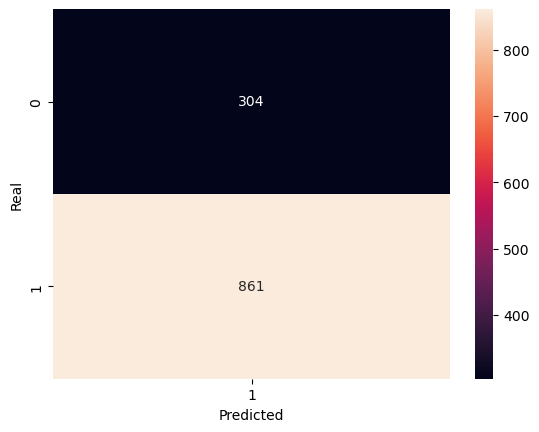

Time taken:  202.72056889533997
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs10_lr0.0001_optimizerAdam,202.720569,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 10, learning rate: 0.001, optimizer: SGD
Current: 33/90
Training [10%]	Loss: 0.5839	Accuracy: 72.75%
Training [20%]	Loss: 0.5846	Accuracy: 72.92%
Training [30%]	Loss: 0.5835	Accuracy: 72.92%
Training [40%]	Loss: 0.5850	Accuracy: 72.92%
Training [50%]	Loss: 0.5839	Accuracy: 72.92%
Training [60%]	Loss: 0.5835	Accuracy: 72.92%
Training [70%]	Loss: 0.5846	Accuracy: 72.92%
Training [80%]	Loss: 0.5842	Accuracy: 72.92%
Training [90%]	Loss: 0.5842	Accuracy: 72.92%
Training [100%]	Loss: 0.5835	Accuracy: 72.92%
Time taken:  189.32573461532593


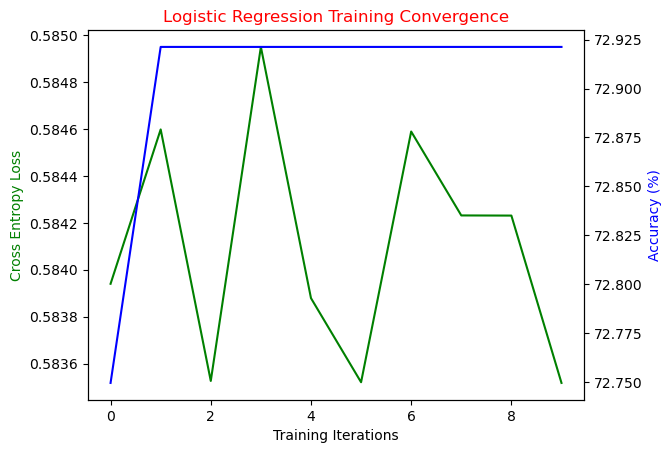

Performance on test data:
	Loss: 0.5751
	Accuracy: 73.91%


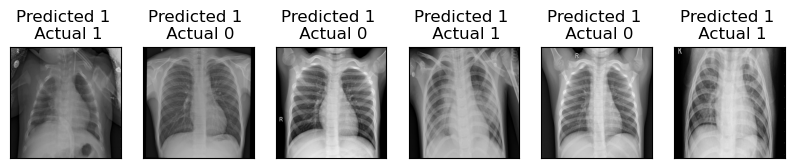

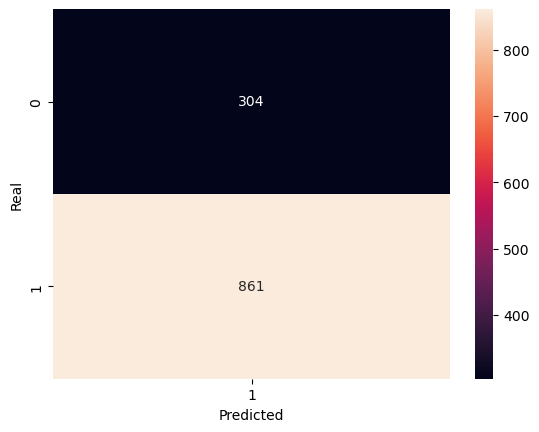

Time taken:  189.32573461532593
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs10_lr0.001_optimizerSGD,189.325735,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 10, learning rate: 0.001, optimizer: Adam
Current: 34/90
Training [10%]	Loss: 1.0418	Accuracy: 27.03%
Training [20%]	Loss: 1.0430	Accuracy: 27.08%
Training [30%]	Loss: 1.0423	Accuracy: 27.08%
Training [40%]	Loss: 1.0419	Accuracy: 27.08%
Training [50%]	Loss: 1.0430	Accuracy: 27.08%
Training [60%]	Loss: 1.0423	Accuracy: 27.08%
Training [70%]	Loss: 1.0427	Accuracy: 27.08%
Training [80%]	Loss: 1.0427	Accuracy: 27.08%
Training [90%]	Loss: 1.0419	Accuracy: 27.08%
Training [100%]	Loss: 1.0434	Accuracy: 27.08%
Time taken:  202.09978866577148


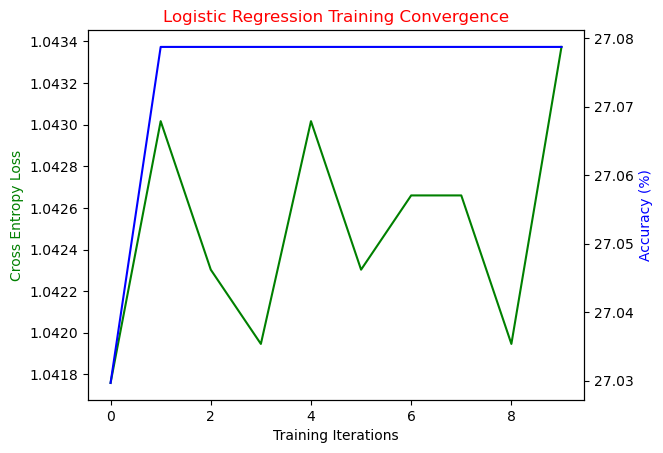

Performance on test data:
	Loss: 1.0514
	Accuracy: 26.09%


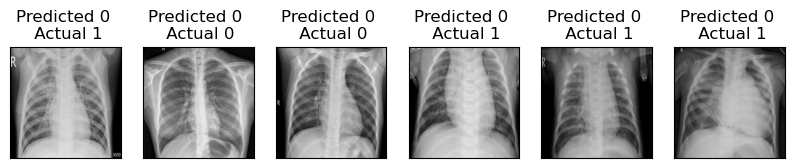

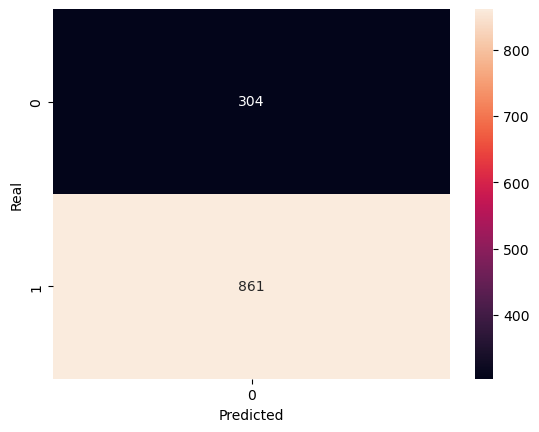

Time taken:  202.09978866577148
Test size: 1165
Total Accuracy:  0.2609442060085837
Total Precision:  0.0
Total Recall:  0.0
Total F1 Score:  0.0
Classification Report:

              precision    recall  f1-score   support

           0       0.26      1.00      0.41       304
           1       0.00      0.00      0.00       861

    accuracy                           0.26      1165
   macro avg       0.13      0.50      0.21      1165
weighted avg       0.07      0.26      0.11      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.p

,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs10_lr0.001_optimizerAdam,202.099789,0.260944,0.0,0.0,0.0


Data Stored Successfully
Training with batch size: 32, epochs: 10, learning rate: 0.01, optimizer: SGD
Current: 35/90
Training [10%]	Loss: 0.5855	Accuracy: 72.41%
Training [20%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5846	Accuracy: 72.92%
Training [40%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5835	Accuracy: 72.92%
Training [60%]	Loss: 0.5835	Accuracy: 72.92%
Training [70%]	Loss: 0.5831	Accuracy: 72.92%
Training [80%]	Loss: 0.5831	Accuracy: 72.92%
Training [90%]	Loss: 0.5846	Accuracy: 72.92%
Training [100%]	Loss: 0.5842	Accuracy: 72.92%
Time taken:  189.96638703346252


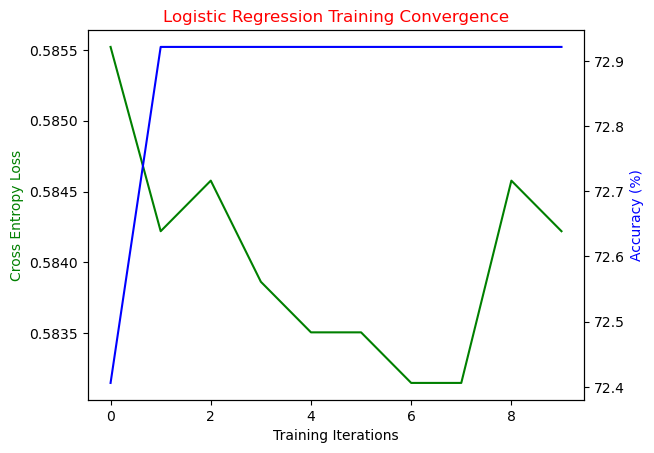

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


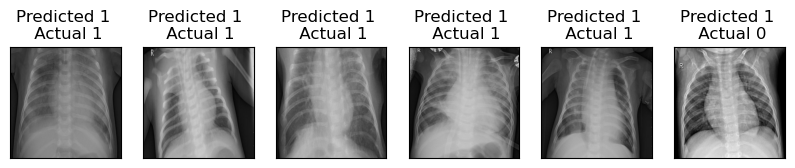

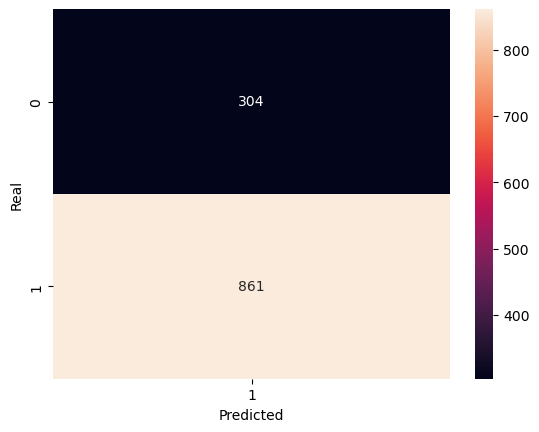

Time taken:  189.96638703346252
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs10_lr0.01_optimizerSGD,189.966387,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 10, learning rate: 0.01, optimizer: Adam
Current: 36/90
Training [10%]	Loss: 0.5842	Accuracy: 72.63%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5853	Accuracy: 72.92%
Training [50%]	Loss: 0.5846	Accuracy: 72.92%
Training [60%]	Loss: 0.5846	Accuracy: 72.92%
Training [70%]	Loss: 0.5839	Accuracy: 72.92%
Training [80%]	Loss: 0.5839	Accuracy: 72.92%
Training [90%]	Loss: 0.5835	Accuracy: 72.92%
Training [100%]	Loss: 0.5835	Accuracy: 72.92%
Time taken:  200.52976965904236


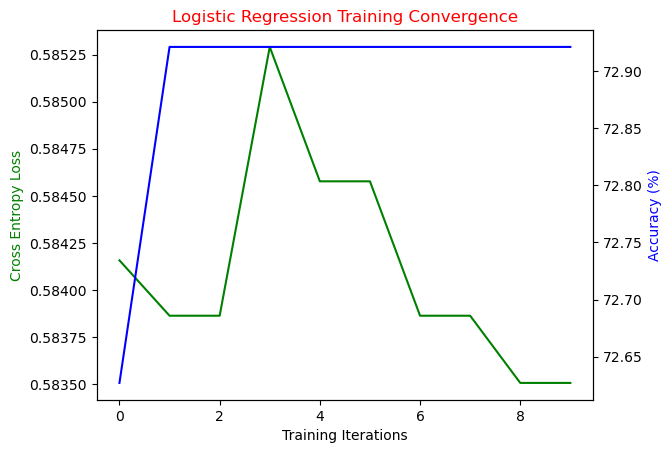

Performance on test data:
	Loss: 0.5751
	Accuracy: 73.91%


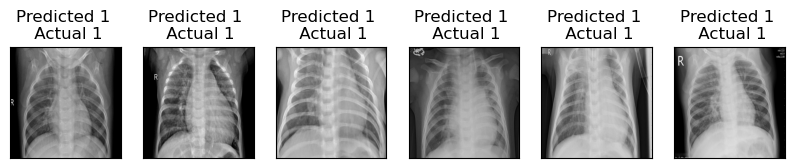

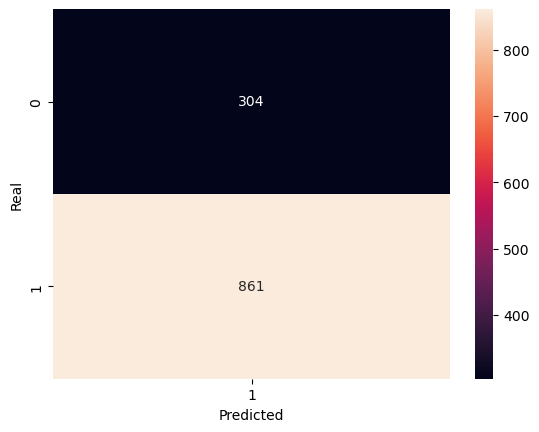

Time taken:  200.52976965904236
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs10_lr0.01_optimizerAdam,200.52977,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 10, learning rate: 0.1, optimizer: SGD
Current: 37/90
Training [10%]	Loss: 0.5860	Accuracy: 72.33%
Training [20%]	Loss: 0.5831	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5846	Accuracy: 72.92%
Training [50%]	Loss: 0.5831	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [70%]	Loss: 0.5835	Accuracy: 72.92%
Training [80%]	Loss: 0.5835	Accuracy: 72.92%
Training [90%]	Loss: 0.5839	Accuracy: 72.92%
Training [100%]	Loss: 0.5828	Accuracy: 72.92%
Time taken:  189.1295518875122


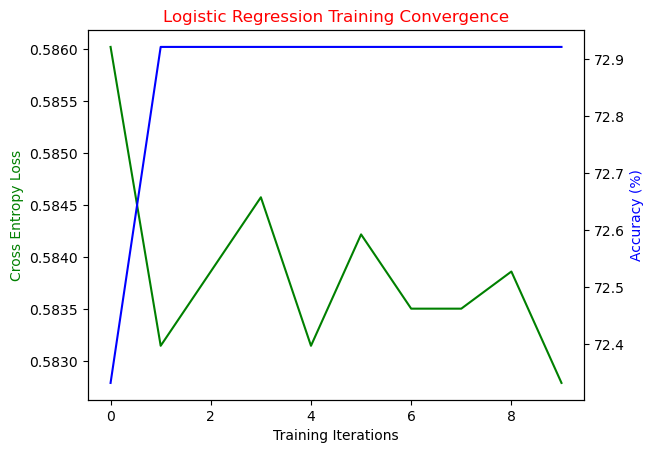

Performance on test data:
	Loss: 0.5751
	Accuracy: 73.91%


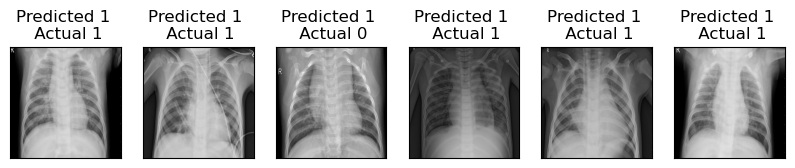

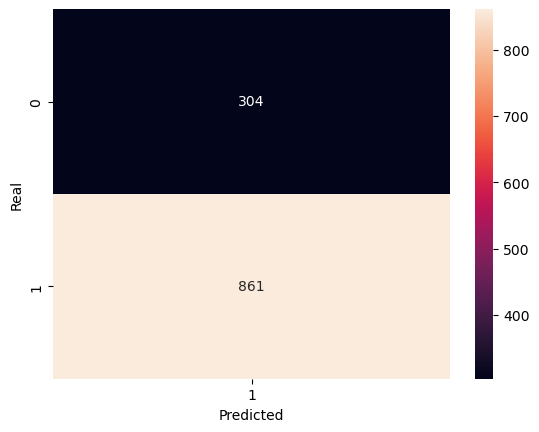

Time taken:  189.1295518875122
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs10_lr0.1_optimizerSGD,189.129552,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 10, learning rate: 0.1, optimizer: Adam
Current: 38/90
Training [10%]	Loss: 0.5853	Accuracy: 72.43%
Training [20%]	Loss: 0.5846	Accuracy: 72.92%
Training [30%]	Loss: 0.5849	Accuracy: 72.92%
Training [40%]	Loss: 0.5846	Accuracy: 72.92%
Training [50%]	Loss: 0.5846	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [70%]	Loss: 0.5839	Accuracy: 72.92%
Training [80%]	Loss: 0.5846	Accuracy: 72.92%
Training [90%]	Loss: 0.5835	Accuracy: 72.92%
Training [100%]	Loss: 0.5849	Accuracy: 72.92%
Time taken:  201.74094033241272


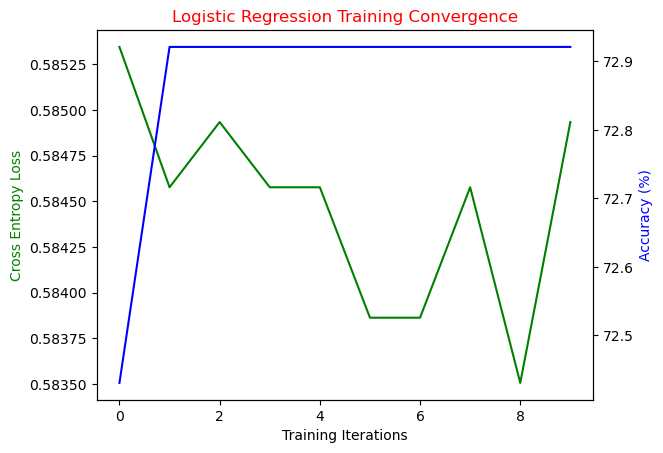

Performance on test data:
	Loss: 0.5753
	Accuracy: 73.91%


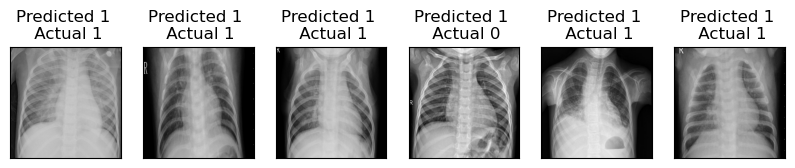

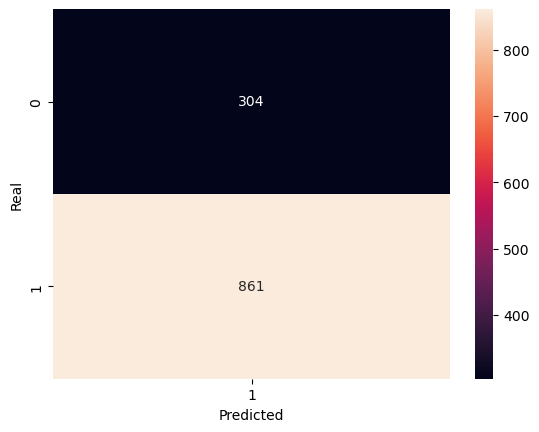

Time taken:  201.74094033241272
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs10_lr0.1_optimizerAdam,201.74094,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 10, learning rate: 1, optimizer: SGD
Current: 39/90
Training [10%]	Loss: 0.5852	Accuracy: 72.90%
Training [20%]	Loss: 0.5835	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [50%]	Loss: 0.5846	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [70%]	Loss: 0.5842	Accuracy: 72.92%
Training [80%]	Loss: 0.5835	Accuracy: 72.92%
Training [90%]	Loss: 0.5842	Accuracy: 72.92%
Training [100%]	Loss: 0.5849	Accuracy: 72.92%
Time taken:  190.5561785697937


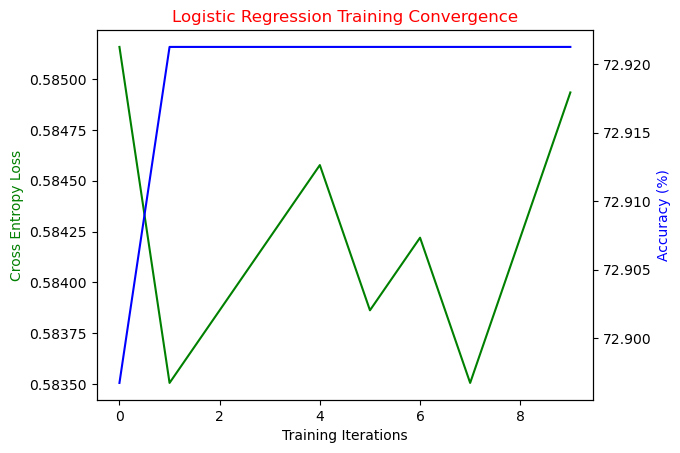

Performance on test data:
	Loss: 0.5753
	Accuracy: 73.91%


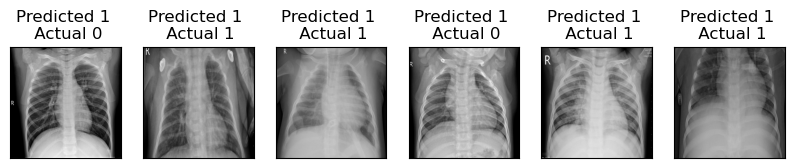

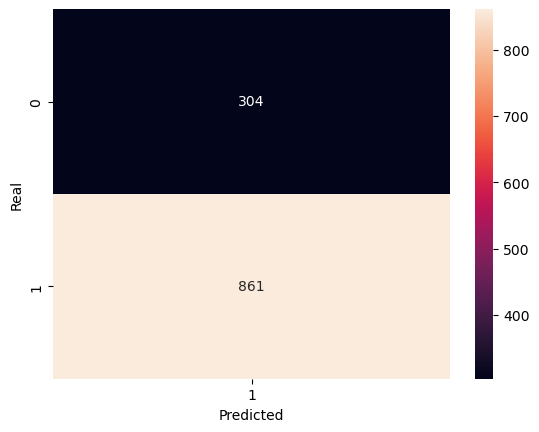

Time taken:  190.5561785697937
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs10_lr1_optimizerSGD,190.556179,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 10, learning rate: 1, optimizer: Adam
Current: 40/90
Training [10%]	Loss: 0.5831	Accuracy: 73.02%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5849	Accuracy: 72.92%
Training [40%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5835	Accuracy: 72.92%
Training [60%]	Loss: 0.5835	Accuracy: 72.92%
Training [70%]	Loss: 0.5828	Accuracy: 72.92%
Training [80%]	Loss: 0.5839	Accuracy: 72.92%
Training [90%]	Loss: 0.5835	Accuracy: 72.92%
Training [100%]	Loss: 0.5835	Accuracy: 72.92%
Time taken:  201.5389883518219


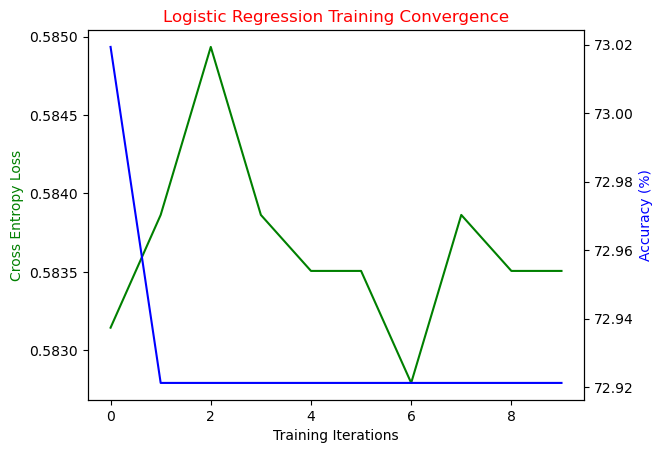

Performance on test data:
	Loss: 0.5751
	Accuracy: 73.91%


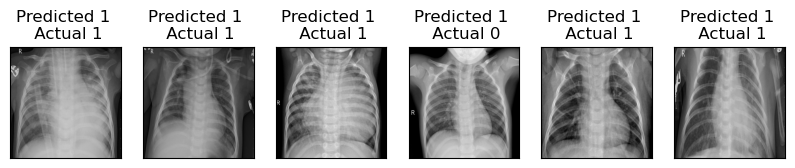

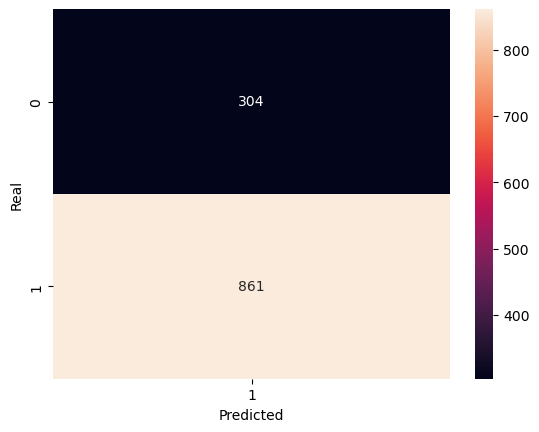

Time taken:  201.5389883518219
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs10_lr1_optimizerAdam,201.538988,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 20, learning rate: 0.0001, optimizer: SGD
Current: 41/90
Training [5%]	Loss: 0.5756	Accuracy: 72.53%
Training [10%]	Loss: 0.5113	Accuracy: 81.09%
Training [15%]	Loss: 0.4733	Accuracy: 86.68%
Training [20%]	Loss: 0.4537	Accuracy: 88.62%
Training [25%]	Loss: 0.4412	Accuracy: 89.82%
Training [30%]	Loss: 0.4330	Accuracy: 90.58%
Training [35%]	Loss: 0.4265	Accuracy: 91.24%
Training [40%]	Loss: 0.4219	Accuracy: 91.46%
Training [45%]	Loss: 0.4180	Accuracy: 91.54%
Training [50%]	Loss: 0.4153	Accuracy: 91.76%
Training [55%]	Loss: 0.4127	Accuracy: 92.08%
Training [60%]	Loss: 0.4096	Accuracy: 92.15%
Training [65%]	Loss: 0.4075	Accuracy: 92.37%
Training [70%]	Loss: 0.4061	Accuracy: 92.47%
Training [75%]	Loss: 0.4033	Accuracy: 92.84%
Training [80%]	Loss: 0.4024	Accuracy: 92.81%
Training [85%]	Loss: 0.4017	Accuracy: 92.52%
Training [90%]	Loss: 0.4003	Accuracy: 92.69%
Training [95%]	Loss: 0.3985	Accuracy: 93.16%
Training [100%]	Loss: 0.39

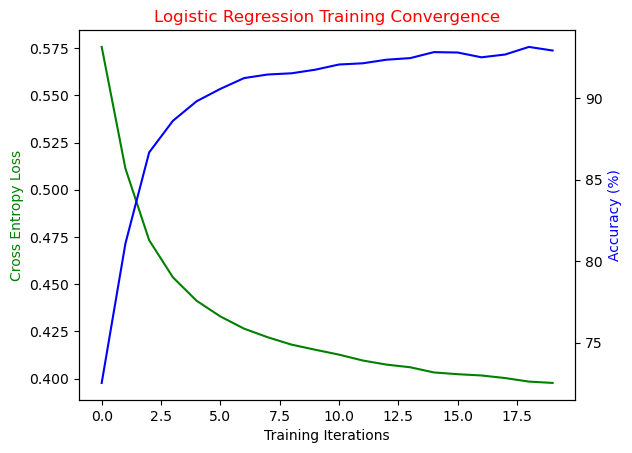

Performance on test data:
	Loss: 0.3935
	Accuracy: 93.73%


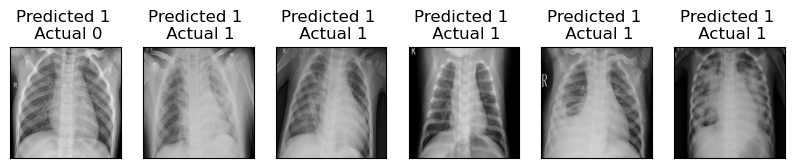

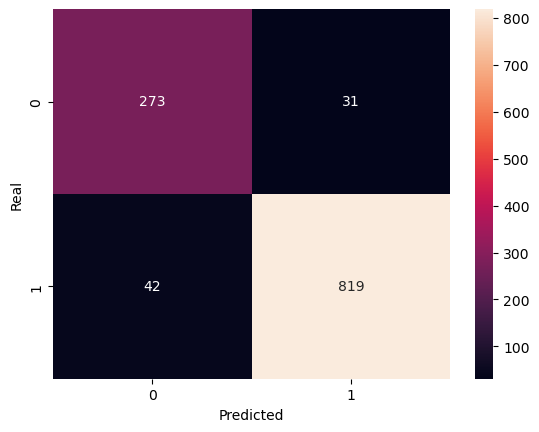

Time taken:  378.21263670921326
Test size: 1165
Total Accuracy:  0.9373390557939915
Total Precision:  0.9635294117647059
Total Recall:  0.9512195121951219
Total F1 Score:  0.9573348918760959
Classification Report:

              precision    recall  f1-score   support

           0       0.87      0.90      0.88       304
           1       0.96      0.95      0.96       861

    accuracy                           0.94      1165
   macro avg       0.92      0.92      0.92      1165
weighted avg       0.94      0.94      0.94      1165



,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs20_lr0.0001_optimizerSGD,378.212637,0.937339,0.963529,0.95122,0.957335


Data Stored Successfully
Training with batch size: 32, epochs: 20, learning rate: 0.0001, optimizer: Adam
Current: 42/90
Training [5%]	Loss: 0.5851	Accuracy: 72.92%
Training [10%]	Loss: 0.5846	Accuracy: 72.92%
Training [15%]	Loss: 0.5842	Accuracy: 72.92%
Training [20%]	Loss: 0.5842	Accuracy: 72.92%
Training [25%]	Loss: 0.5846	Accuracy: 72.92%
Training [30%]	Loss: 0.5849	Accuracy: 72.92%
Training [35%]	Loss: 0.5846	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [45%]	Loss: 0.5842	Accuracy: 72.92%
Training [50%]	Loss: 0.5839	Accuracy: 72.92%
Training [55%]	Loss: 0.5839	Accuracy: 72.92%
Training [60%]	Loss: 0.5831	Accuracy: 72.92%
Training [65%]	Loss: 0.5839	Accuracy: 72.92%
Training [70%]	Loss: 0.5849	Accuracy: 72.92%
Training [75%]	Loss: 0.5842	Accuracy: 72.92%
Training [80%]	Loss: 0.5842	Accuracy: 72.92%
Training [85%]	Loss: 0.5846	Accuracy: 72.92%
Training [90%]	Loss: 0.5842	Accuracy: 72.92%
Training [95%]	Loss: 0.5831	Accuracy: 72.92%
Training [100%]	Loss: 0.5

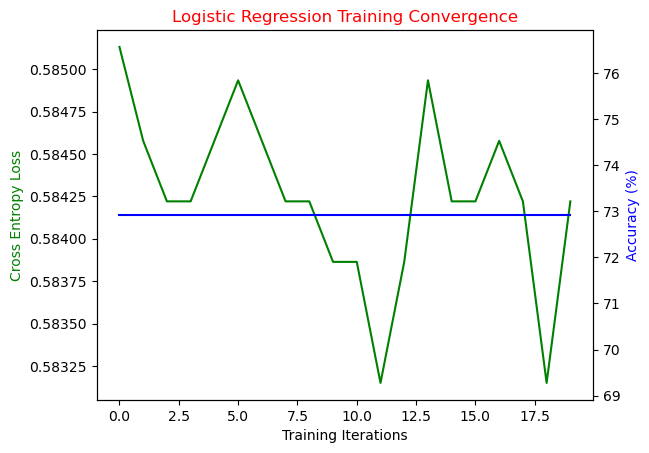

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


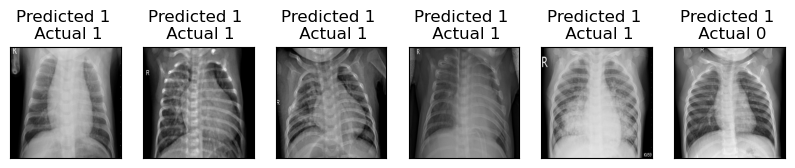

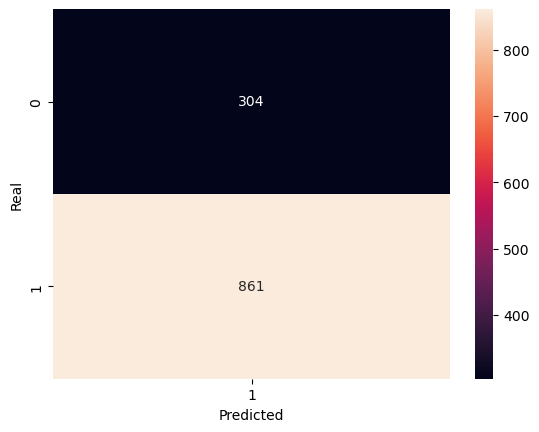

Time taken:  412.4959604740143
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs20_lr0.0001_optimizerAdam,412.49596,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 20, learning rate: 0.001, optimizer: SGD
Current: 43/90
Training [5%]	Loss: 0.5859	Accuracy: 72.92%
Training [10%]	Loss: 0.5831	Accuracy: 72.92%
Training [15%]	Loss: 0.5846	Accuracy: 72.92%
Training [20%]	Loss: 0.5853	Accuracy: 72.92%
Training [25%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [35%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [45%]	Loss: 0.5831	Accuracy: 72.92%
Training [50%]	Loss: 0.5839	Accuracy: 72.92%
Training [55%]	Loss: 0.5839	Accuracy: 72.92%
Training [60%]	Loss: 0.5846	Accuracy: 72.92%
Training [65%]	Loss: 0.5839	Accuracy: 72.92%
Training [70%]	Loss: 0.5835	Accuracy: 72.92%
Training [75%]	Loss: 0.5835	Accuracy: 72.92%
Training [80%]	Loss: 0.5849	Accuracy: 72.92%
Training [85%]	Loss: 0.5846	Accuracy: 72.92%
Training [90%]	Loss: 0.5839	Accuracy: 72.92%
Training [95%]	Loss: 0.5835	Accuracy: 72.92%
Training [100%]	Loss: 0.583

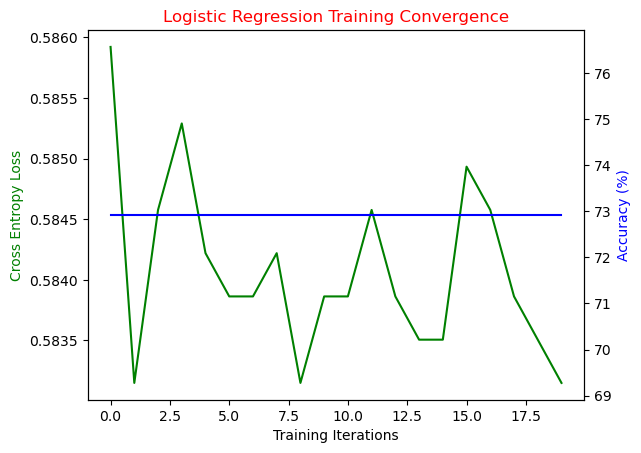

Performance on test data:
	Loss: 0.5751
	Accuracy: 73.91%


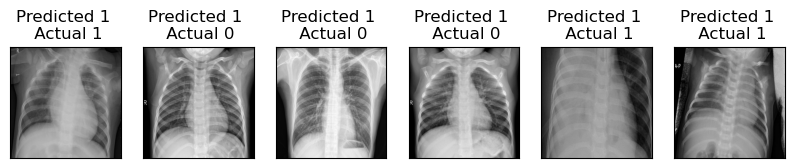

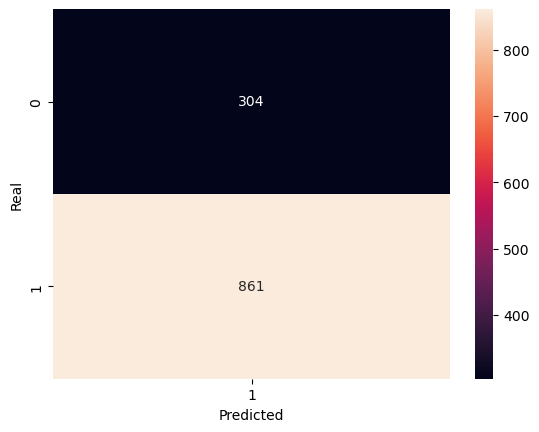

Time taken:  379.46731305122375
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs20_lr0.001_optimizerSGD,379.467313,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 20, learning rate: 0.001, optimizer: Adam
Current: 44/90
Training [5%]	Loss: 0.5852	Accuracy: 72.92%
Training [10%]	Loss: 0.5846	Accuracy: 72.92%
Training [15%]	Loss: 0.5839	Accuracy: 72.92%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [25%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5849	Accuracy: 72.92%
Training [35%]	Loss: 0.5835	Accuracy: 72.92%
Training [40%]	Loss: 0.5846	Accuracy: 72.92%
Training [45%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5849	Accuracy: 72.92%
Training [55%]	Loss: 0.5839	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [65%]	Loss: 0.5831	Accuracy: 72.92%
Training [70%]	Loss: 0.5835	Accuracy: 72.92%
Training [75%]	Loss: 0.5842	Accuracy: 72.92%
Training [80%]	Loss: 0.5839	Accuracy: 72.92%
Training [85%]	Loss: 0.5835	Accuracy: 72.92%
Training [90%]	Loss: 0.5839	Accuracy: 72.92%
Training [95%]	Loss: 0.5846	Accuracy: 72.92%
Training [100%]	Loss: 0.58

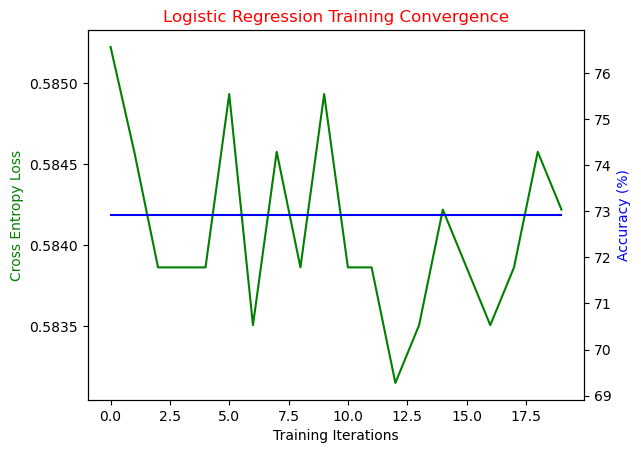

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


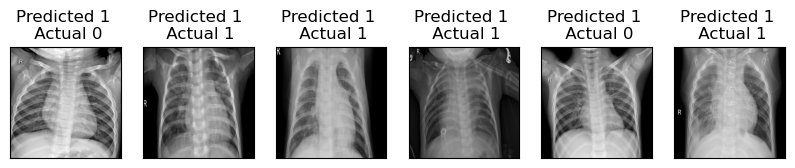

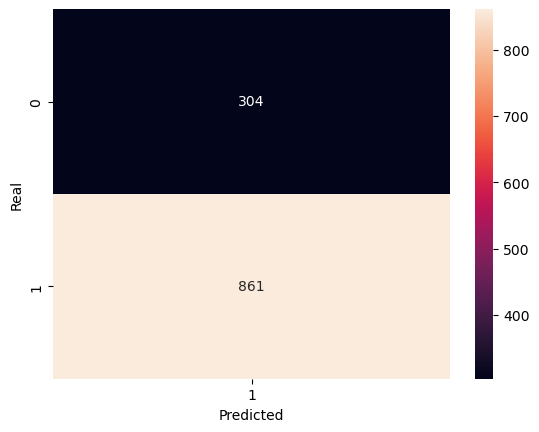

Time taken:  413.17325258255005
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs20_lr0.001_optimizerAdam,413.173253,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 20, learning rate: 0.01, optimizer: SGD
Current: 45/90
Training [5%]	Loss: 0.5843	Accuracy: 72.75%
Training [10%]	Loss: 0.5835	Accuracy: 72.92%
Training [15%]	Loss: 0.5831	Accuracy: 72.92%
Training [20%]	Loss: 0.5849	Accuracy: 72.92%
Training [25%]	Loss: 0.5846	Accuracy: 72.92%
Training [30%]	Loss: 0.5846	Accuracy: 72.92%
Training [35%]	Loss: 0.5856	Accuracy: 72.92%
Training [40%]	Loss: 0.5846	Accuracy: 72.92%
Training [45%]	Loss: 0.5835	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [55%]	Loss: 0.5839	Accuracy: 72.92%
Training [60%]	Loss: 0.5849	Accuracy: 72.92%
Training [65%]	Loss: 0.5835	Accuracy: 72.92%
Training [70%]	Loss: 0.5853	Accuracy: 72.92%
Training [75%]	Loss: 0.5839	Accuracy: 72.92%
Training [80%]	Loss: 0.5835	Accuracy: 72.92%
Training [85%]	Loss: 0.5842	Accuracy: 72.92%
Training [90%]	Loss: 0.5835	Accuracy: 72.92%
Training [95%]	Loss: 0.5835	Accuracy: 72.92%
Training [100%]	Loss: 0.5835

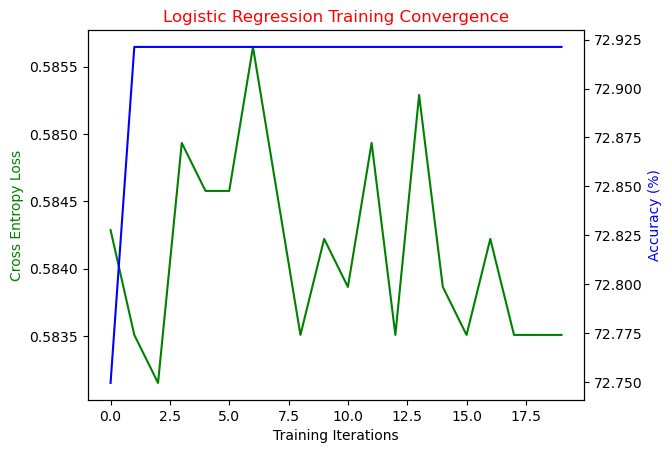

Performance on test data:
	Loss: 0.5751
	Accuracy: 73.91%


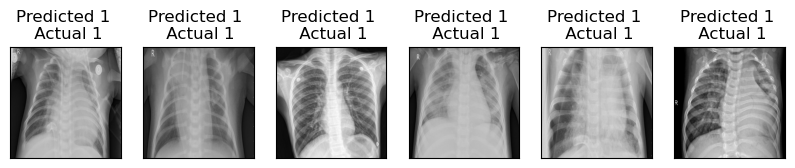

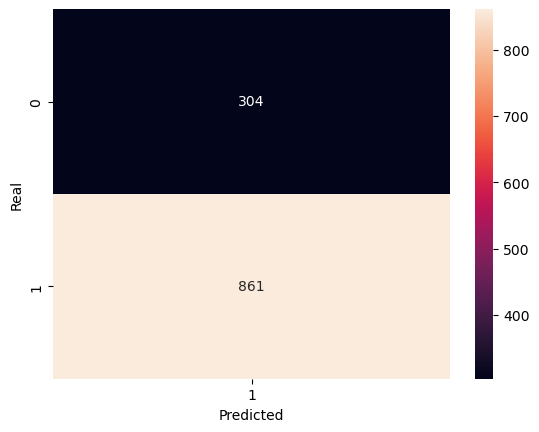

Time taken:  392.598112821579
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs20_lr0.01_optimizerSGD,392.598113,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 20, learning rate: 0.01, optimizer: Adam
Current: 46/90
Training [5%]	Loss: 0.5853	Accuracy: 72.73%
Training [10%]	Loss: 0.5842	Accuracy: 72.92%
Training [15%]	Loss: 0.5839	Accuracy: 72.92%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [25%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [35%]	Loss: 0.5842	Accuracy: 72.92%
Training [40%]	Loss: 0.5831	Accuracy: 72.92%
Training [45%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5831	Accuracy: 72.92%
Training [55%]	Loss: 0.5835	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [65%]	Loss: 0.5849	Accuracy: 72.92%
Training [70%]	Loss: 0.5839	Accuracy: 72.92%
Training [75%]	Loss: 0.5835	Accuracy: 72.92%
Training [80%]	Loss: 0.5835	Accuracy: 72.92%
Training [85%]	Loss: 0.5831	Accuracy: 72.92%
Training [90%]	Loss: 0.5831	Accuracy: 72.92%
Training [95%]	Loss: 0.5839	Accuracy: 72.92%
Training [100%]	Loss: 0.584

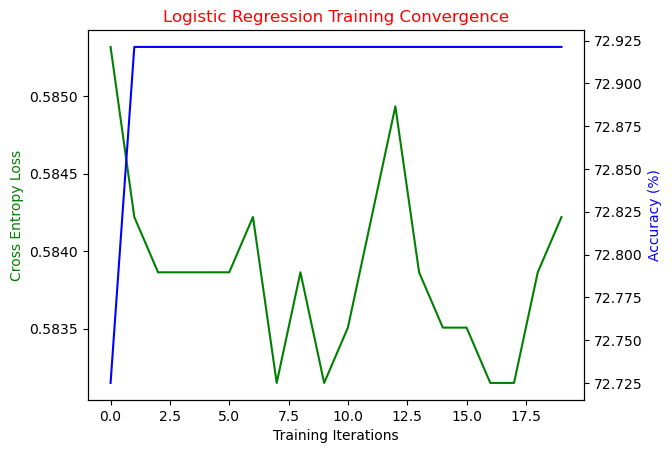

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


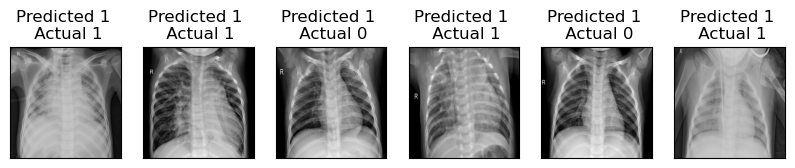

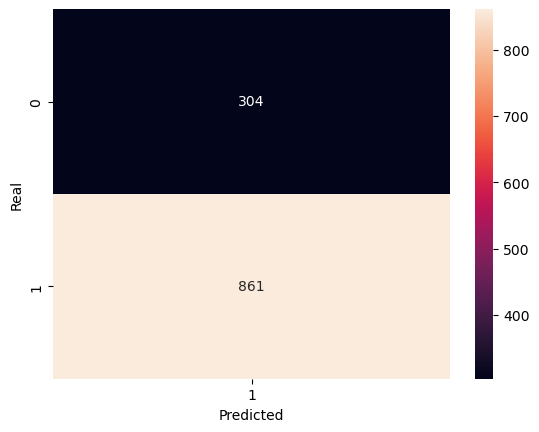

Time taken:  414.4078679084778
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs20_lr0.01_optimizerAdam,414.407868,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 20, learning rate: 0.1, optimizer: SGD
Current: 47/90
Training [5%]	Loss: 0.5836	Accuracy: 72.95%
Training [10%]	Loss: 0.5828	Accuracy: 72.92%
Training [15%]	Loss: 0.5839	Accuracy: 72.92%
Training [20%]	Loss: 0.5831	Accuracy: 72.92%
Training [25%]	Loss: 0.5831	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [35%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [45%]	Loss: 0.5849	Accuracy: 72.92%
Training [50%]	Loss: 0.5846	Accuracy: 72.92%
Training [55%]	Loss: 0.5835	Accuracy: 72.92%
Training [60%]	Loss: 0.5846	Accuracy: 72.92%
Training [65%]	Loss: 0.5849	Accuracy: 72.92%
Training [70%]	Loss: 0.5835	Accuracy: 72.92%
Training [75%]	Loss: 0.5842	Accuracy: 72.92%
Training [80%]	Loss: 0.5853	Accuracy: 72.92%
Training [85%]	Loss: 0.5842	Accuracy: 72.92%
Training [90%]	Loss: 0.5839	Accuracy: 72.92%
Training [95%]	Loss: 0.5835	Accuracy: 72.92%
Training [100%]	Loss: 0.5849	

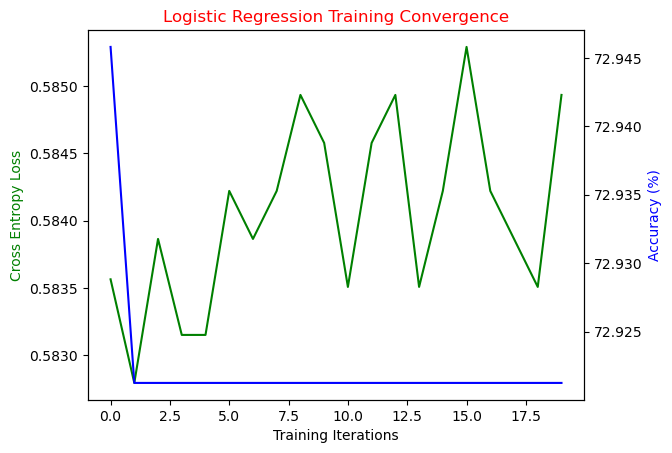

Performance on test data:
	Loss: 0.5753
	Accuracy: 73.91%


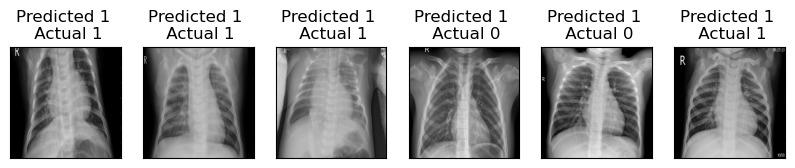

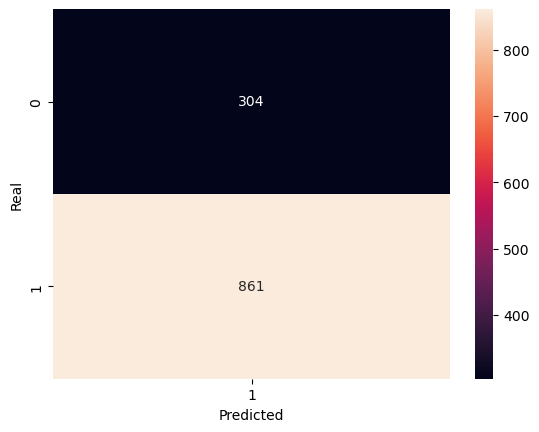

Time taken:  380.2517418861389
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs20_lr0.1_optimizerSGD,380.251742,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 20, learning rate: 0.1, optimizer: Adam
Current: 48/90
Training [5%]	Loss: 0.5847	Accuracy: 72.68%
Training [10%]	Loss: 0.5835	Accuracy: 72.92%
Training [15%]	Loss: 0.5839	Accuracy: 72.92%
Training [20%]	Loss: 0.5853	Accuracy: 72.92%
Training [25%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [35%]	Loss: 0.5835	Accuracy: 72.92%
Training [40%]	Loss: 0.5846	Accuracy: 72.92%
Training [45%]	Loss: 0.5842	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [55%]	Loss: 0.5831	Accuracy: 72.92%
Training [60%]	Loss: 0.5835	Accuracy: 72.92%
Training [65%]	Loss: 0.5842	Accuracy: 72.92%
Training [70%]	Loss: 0.5853	Accuracy: 72.92%
Training [75%]	Loss: 0.5831	Accuracy: 72.92%
Training [80%]	Loss: 0.5839	Accuracy: 72.92%
Training [85%]	Loss: 0.5846	Accuracy: 72.92%
Training [90%]	Loss: 0.5831	Accuracy: 72.92%
Training [95%]	Loss: 0.5839	Accuracy: 72.92%
Training [100%]	Loss: 0.5846

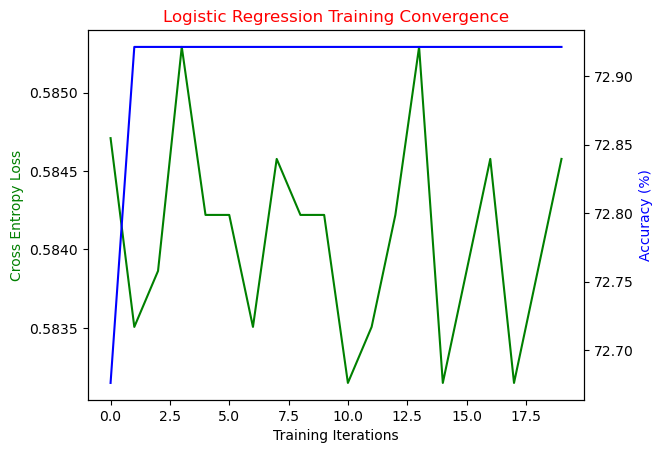

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


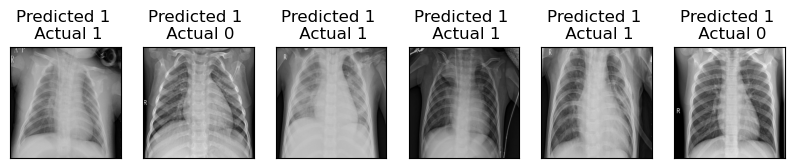

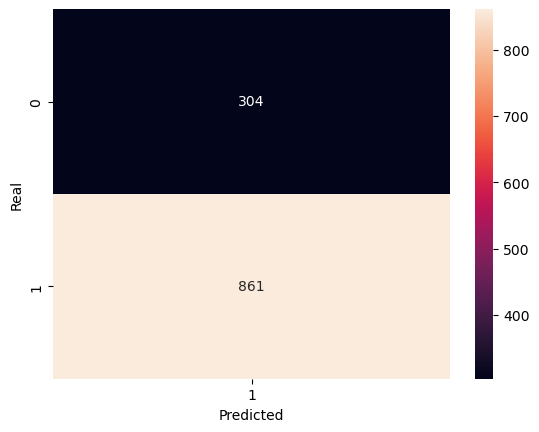

Time taken:  411.387987613678
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs20_lr0.1_optimizerAdam,411.387988,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 20, learning rate: 1, optimizer: SGD
Current: 49/90
Training [5%]	Loss: 0.5861	Accuracy: 72.92%
Training [10%]	Loss: 0.5842	Accuracy: 72.92%
Training [15%]	Loss: 0.5839	Accuracy: 72.92%
Training [20%]	Loss: 0.5831	Accuracy: 72.92%
Training [25%]	Loss: 0.5846	Accuracy: 72.92%
Training [30%]	Loss: 0.5835	Accuracy: 72.92%
Training [35%]	Loss: 0.5831	Accuracy: 72.92%
Training [40%]	Loss: 0.5831	Accuracy: 72.92%
Training [45%]	Loss: 0.5835	Accuracy: 72.92%
Training [50%]	Loss: 0.5853	Accuracy: 72.92%
Training [55%]	Loss: 0.5849	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [65%]	Loss: 0.5842	Accuracy: 72.92%
Training [70%]	Loss: 0.5831	Accuracy: 72.92%
Training [75%]	Loss: 0.5842	Accuracy: 72.92%
Training [80%]	Loss: 0.5831	Accuracy: 72.92%
Training [85%]	Loss: 0.5839	Accuracy: 72.92%
Training [90%]	Loss: 0.5846	Accuracy: 72.92%
Training [95%]	Loss: 0.5835	Accuracy: 72.92%
Training [100%]	Loss: 0.5849	Ac

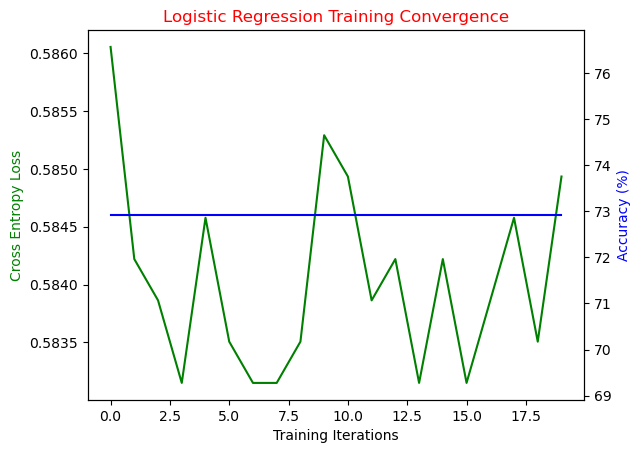

Performance on test data:
	Loss: 0.5753
	Accuracy: 73.91%


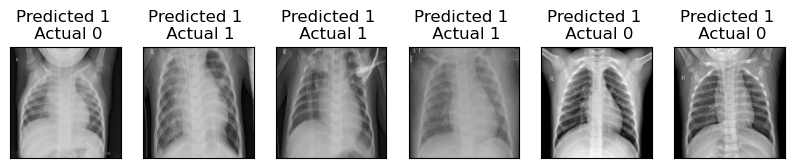

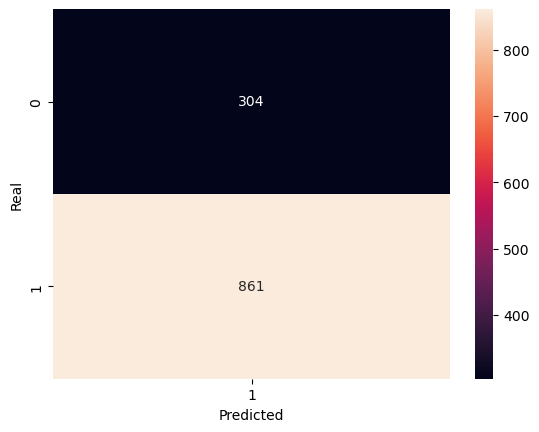

Time taken:  378.5418047904968
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs20_lr1_optimizerSGD,378.541805,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 20, learning rate: 1, optimizer: Adam
Current: 50/90
Training [5%]	Loss: 0.5852	Accuracy: 72.60%
Training [10%]	Loss: 0.5842	Accuracy: 72.92%
Training [15%]	Loss: 0.5846	Accuracy: 72.92%
Training [20%]	Loss: 0.5846	Accuracy: 72.92%
Training [25%]	Loss: 0.5853	Accuracy: 72.92%
Training [30%]	Loss: 0.5846	Accuracy: 72.92%
Training [35%]	Loss: 0.5835	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [45%]	Loss: 0.5831	Accuracy: 72.92%
Training [50%]	Loss: 0.5839	Accuracy: 72.92%
Training [55%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [65%]	Loss: 0.5831	Accuracy: 72.92%
Training [70%]	Loss: 0.5839	Accuracy: 72.92%
Training [75%]	Loss: 0.5849	Accuracy: 72.92%
Training [80%]	Loss: 0.5842	Accuracy: 72.92%
Training [85%]	Loss: 0.5846	Accuracy: 72.92%
Training [90%]	Loss: 0.5831	Accuracy: 72.92%
Training [95%]	Loss: 0.5835	Accuracy: 72.92%
Training [100%]	Loss: 0.5839	A

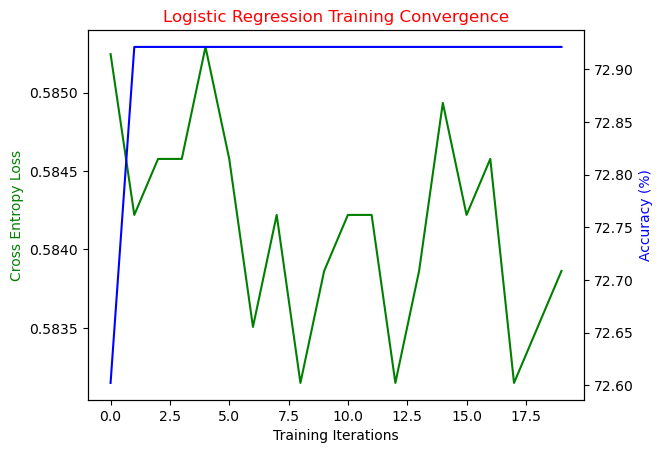

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


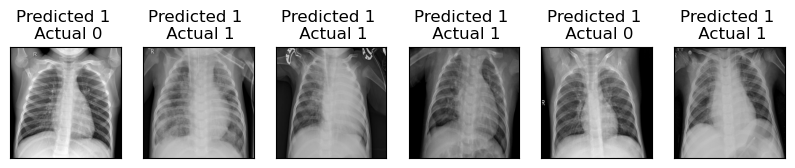

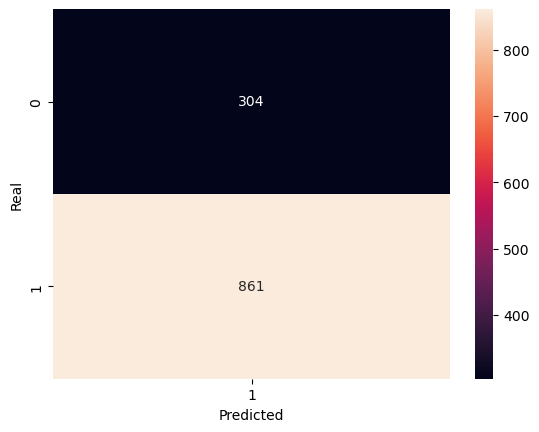

Time taken:  419.5491225719452
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs20_lr1_optimizerAdam,419.549123,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 30, learning rate: 0.0001, optimizer: SGD
Current: 51/90
Training [3%]	Loss: 0.5755	Accuracy: 72.99%
Training [7%]	Loss: 0.5182	Accuracy: 79.86%
Training [10%]	Loss: 0.4720	Accuracy: 87.07%
Training [13%]	Loss: 0.4549	Accuracy: 88.47%
Training [17%]	Loss: 0.4412	Accuracy: 89.89%
Training [20%]	Loss: 0.4332	Accuracy: 90.43%
Training [23%]	Loss: 0.4270	Accuracy: 91.10%
Training [27%]	Loss: 0.4230	Accuracy: 91.17%
Training [30%]	Loss: 0.4194	Accuracy: 91.44%
Training [33%]	Loss: 0.4154	Accuracy: 91.93%
Training [37%]	Loss: 0.4125	Accuracy: 92.03%
Training [40%]	Loss: 0.4092	Accuracy: 92.37%
Training [43%]	Loss: 0.4077	Accuracy: 92.22%
Training [47%]	Loss: 0.4052	Accuracy: 92.57%
Training [50%]	Loss: 0.4041	Accuracy: 92.67%
Training [53%]	Loss: 0.4035	Accuracy: 92.64%
Training [57%]	Loss: 0.4013	Accuracy: 92.76%
Training [60%]	Loss: 0.3996	Accuracy: 92.96%
Training [63%]	Loss: 0.3994	Accuracy: 92.81%
Training [67%]	Loss: 0.3984

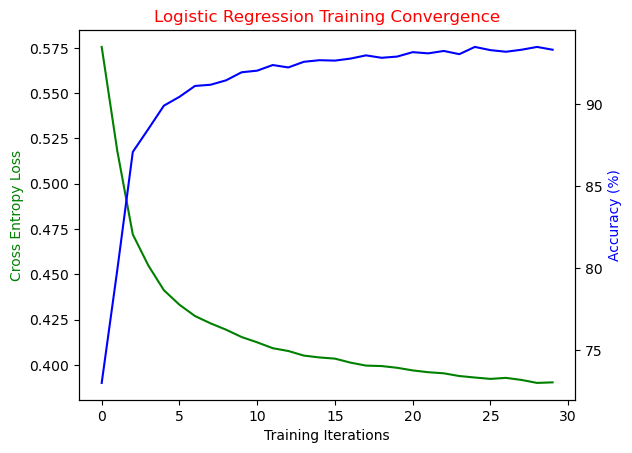

Performance on test data:
	Loss: 0.3829
	Accuracy: 94.33%


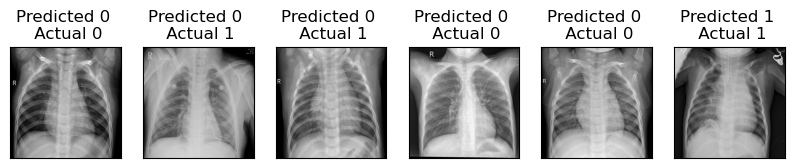

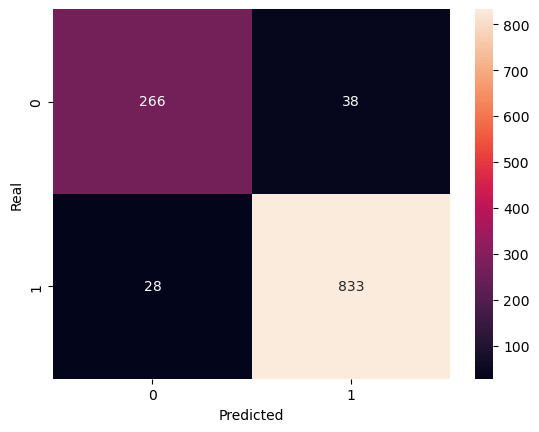

Time taken:  569.9762291908264
Test size: 1165
Total Accuracy:  0.9433476394849786
Total Precision:  0.9563719862227325
Total Recall:  0.967479674796748
Total F1 Score:  0.9618937644341802
Classification Report:

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       304
           1       0.96      0.97      0.96       861

    accuracy                           0.94      1165
   macro avg       0.93      0.92      0.93      1165
weighted avg       0.94      0.94      0.94      1165



,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs30_lr0.0001_optimizerSGD,569.976229,0.943348,0.956372,0.96748,0.961894


Data Stored Successfully
Training with batch size: 32, epochs: 30, learning rate: 0.0001, optimizer: Adam
Current: 52/90
Training [3%]	Loss: 0.5853	Accuracy: 72.80%
Training [7%]	Loss: 0.5835	Accuracy: 72.92%
Training [10%]	Loss: 0.5839	Accuracy: 72.92%
Training [13%]	Loss: 0.5842	Accuracy: 72.92%
Training [17%]	Loss: 0.5853	Accuracy: 72.92%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [23%]	Loss: 0.5846	Accuracy: 72.92%
Training [27%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5846	Accuracy: 72.92%
Training [33%]	Loss: 0.5839	Accuracy: 72.92%
Training [37%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [43%]	Loss: 0.5835	Accuracy: 72.92%
Training [47%]	Loss: 0.5835	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [53%]	Loss: 0.5828	Accuracy: 72.92%
Training [57%]	Loss: 0.5846	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [63%]	Loss: 0.5842	Accuracy: 72.92%
Training [67%]	Loss: 0.584

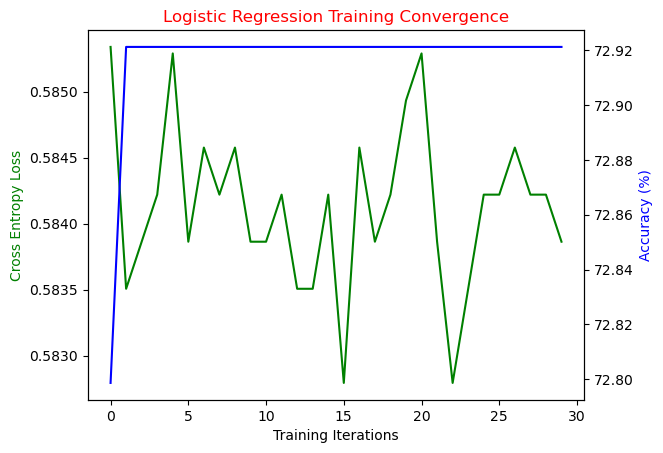

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


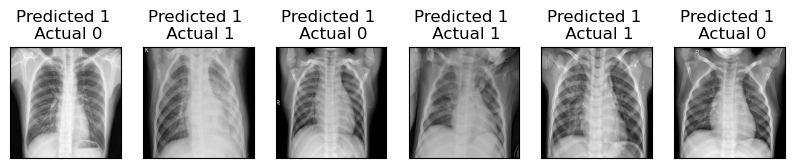

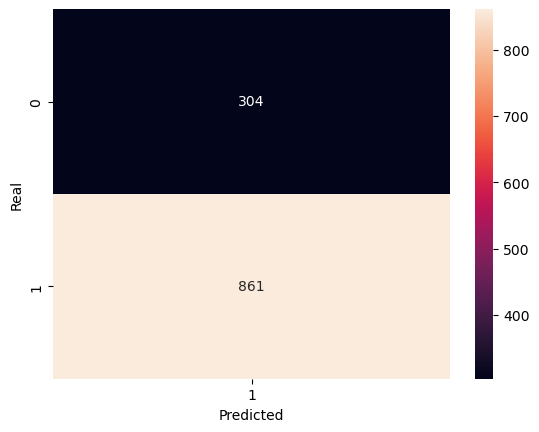

Time taken:  625.048401594162
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs30_lr0.0001_optimizerAdam,625.048402,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 30, learning rate: 0.001, optimizer: SGD
Current: 53/90
Training [3%]	Loss: 0.5846	Accuracy: 72.92%
Training [7%]	Loss: 0.5849	Accuracy: 72.92%
Training [10%]	Loss: 0.5842	Accuracy: 72.92%
Training [13%]	Loss: 0.5839	Accuracy: 72.92%
Training [17%]	Loss: 0.5846	Accuracy: 72.92%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [23%]	Loss: 0.5839	Accuracy: 72.92%
Training [27%]	Loss: 0.5835	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [33%]	Loss: 0.5846	Accuracy: 72.92%
Training [37%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5839	Accuracy: 72.92%
Training [43%]	Loss: 0.5842	Accuracy: 72.92%
Training [47%]	Loss: 0.5846	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [53%]	Loss: 0.5849	Accuracy: 72.92%
Training [57%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [63%]	Loss: 0.5849	Accuracy: 72.92%
Training [67%]	Loss: 0.5842	

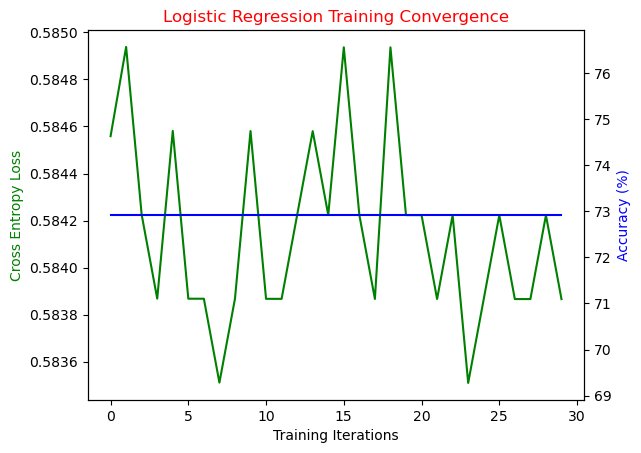

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


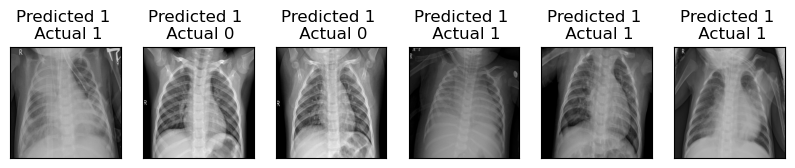

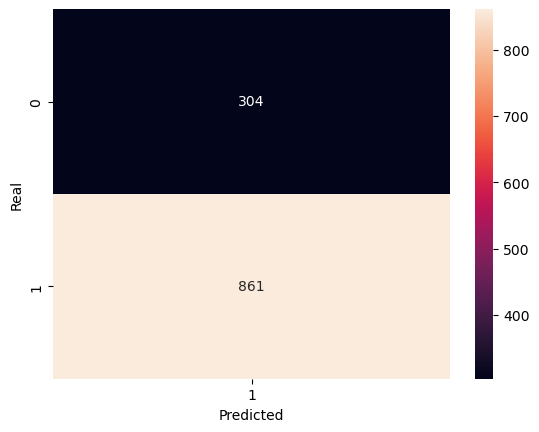

Time taken:  569.826878786087
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs30_lr0.001_optimizerSGD,569.826879,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 30, learning rate: 0.001, optimizer: Adam
Current: 54/90
Training [3%]	Loss: 0.5853	Accuracy: 72.48%
Training [7%]	Loss: 0.5828	Accuracy: 72.92%
Training [10%]	Loss: 0.5839	Accuracy: 72.92%
Training [13%]	Loss: 0.5842	Accuracy: 72.92%
Training [17%]	Loss: 0.5835	Accuracy: 72.92%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [23%]	Loss: 0.5831	Accuracy: 72.92%
Training [27%]	Loss: 0.5849	Accuracy: 72.92%
Training [30%]	Loss: 0.5831	Accuracy: 72.92%
Training [33%]	Loss: 0.5839	Accuracy: 72.92%
Training [37%]	Loss: 0.5853	Accuracy: 72.92%
Training [40%]	Loss: 0.5835	Accuracy: 72.92%
Training [43%]	Loss: 0.5842	Accuracy: 72.92%
Training [47%]	Loss: 0.5835	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [53%]	Loss: 0.5835	Accuracy: 72.92%
Training [57%]	Loss: 0.5835	Accuracy: 72.92%
Training [60%]	Loss: 0.5849	Accuracy: 72.92%
Training [63%]	Loss: 0.5831	Accuracy: 72.92%
Training [67%]	Loss: 0.5842

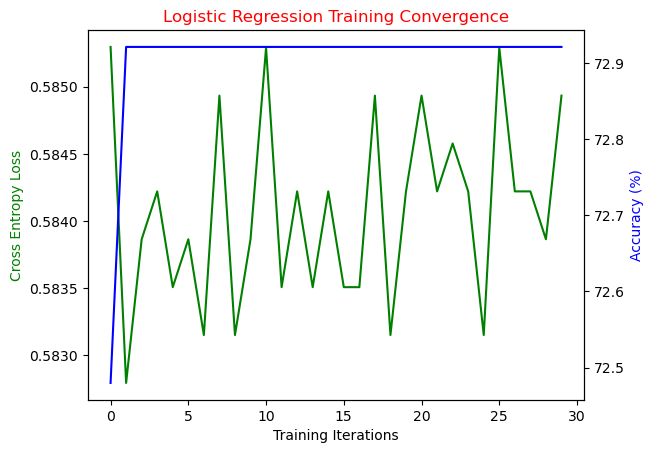

Performance on test data:
	Loss: 0.5753
	Accuracy: 73.91%


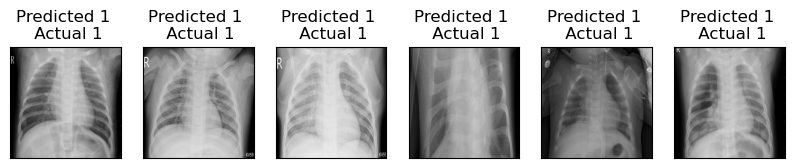

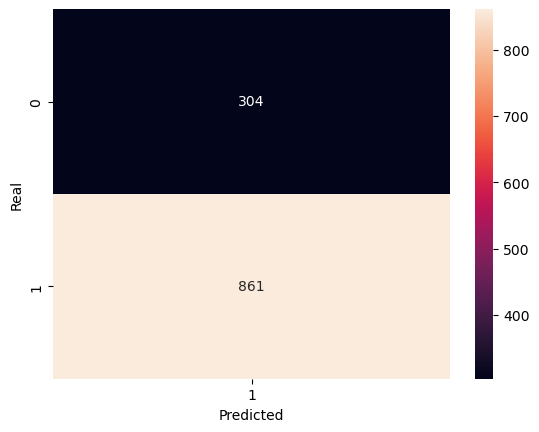

Time taken:  620.8634331226349
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs30_lr0.001_optimizerAdam,620.863433,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 30, learning rate: 0.01, optimizer: SGD
Current: 55/90
Training [3%]	Loss: 0.5849	Accuracy: 72.97%
Training [7%]	Loss: 0.5835	Accuracy: 72.92%
Training [10%]	Loss: 0.5835	Accuracy: 72.92%
Training [13%]	Loss: 0.5853	Accuracy: 72.92%
Training [17%]	Loss: 0.5835	Accuracy: 72.92%
Training [20%]	Loss: 0.5846	Accuracy: 72.92%
Training [23%]	Loss: 0.5846	Accuracy: 72.92%
Training [27%]	Loss: 0.5831	Accuracy: 72.92%
Training [30%]	Loss: 0.5835	Accuracy: 72.92%
Training [33%]	Loss: 0.5846	Accuracy: 72.92%
Training [37%]	Loss: 0.5849	Accuracy: 72.92%
Training [40%]	Loss: 0.5835	Accuracy: 72.92%
Training [43%]	Loss: 0.5839	Accuracy: 72.92%
Training [47%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [53%]	Loss: 0.5846	Accuracy: 72.92%
Training [57%]	Loss: 0.5849	Accuracy: 72.92%
Training [60%]	Loss: 0.5846	Accuracy: 72.92%
Training [63%]	Loss: 0.5835	Accuracy: 72.92%
Training [67%]	Loss: 0.5842	A

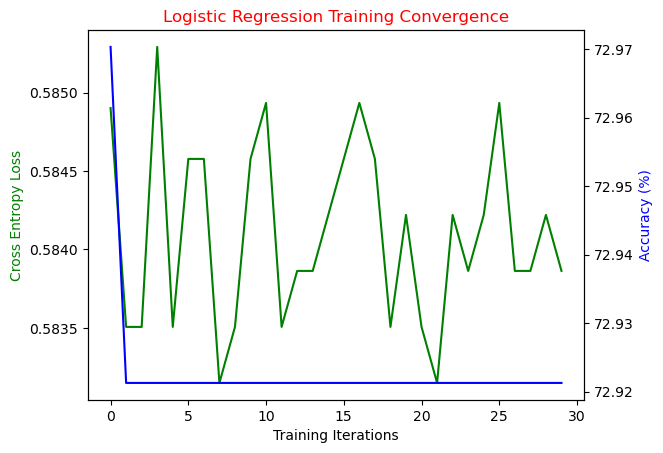

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


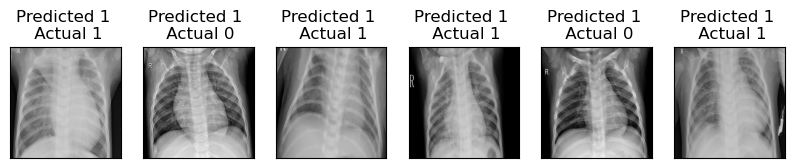

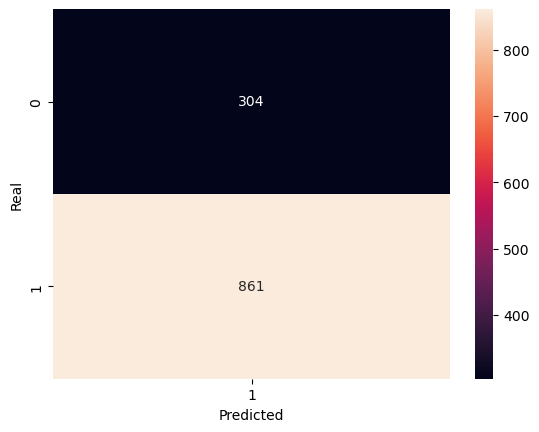

Time taken:  570.585643529892
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs30_lr0.01_optimizerSGD,570.585644,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 30, learning rate: 0.01, optimizer: Adam
Current: 56/90
Training [3%]	Loss: 0.5857	Accuracy: 72.48%
Training [7%]	Loss: 0.5853	Accuracy: 72.92%
Training [10%]	Loss: 0.5842	Accuracy: 72.92%
Training [13%]	Loss: 0.5835	Accuracy: 72.92%
Training [17%]	Loss: 0.5853	Accuracy: 72.92%
Training [20%]	Loss: 0.5846	Accuracy: 72.92%
Training [23%]	Loss: 0.5839	Accuracy: 72.92%
Training [27%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [33%]	Loss: 0.5835	Accuracy: 72.92%
Training [37%]	Loss: 0.5835	Accuracy: 72.92%
Training [40%]	Loss: 0.5846	Accuracy: 72.92%
Training [43%]	Loss: 0.5839	Accuracy: 72.92%
Training [47%]	Loss: 0.5831	Accuracy: 72.92%
Training [50%]	Loss: 0.5849	Accuracy: 72.92%
Training [53%]	Loss: 0.5853	Accuracy: 72.92%
Training [57%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [63%]	Loss: 0.5842	Accuracy: 72.92%
Training [67%]	Loss: 0.5839	

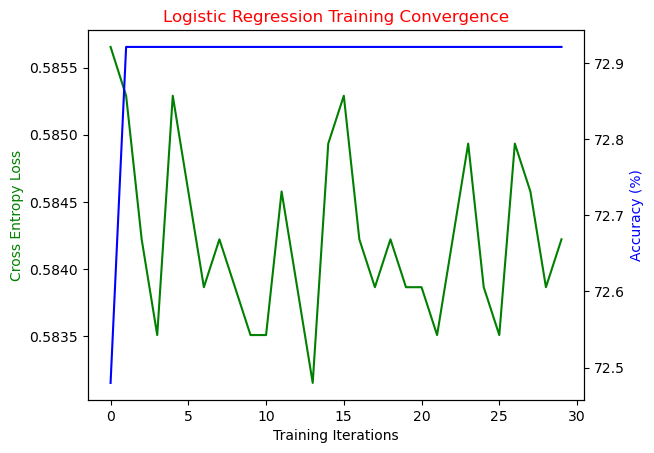

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


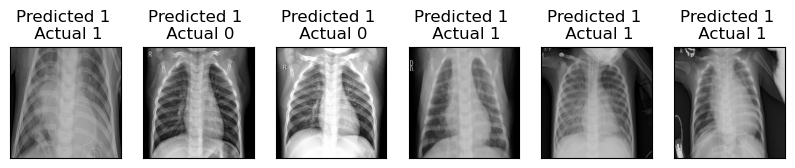

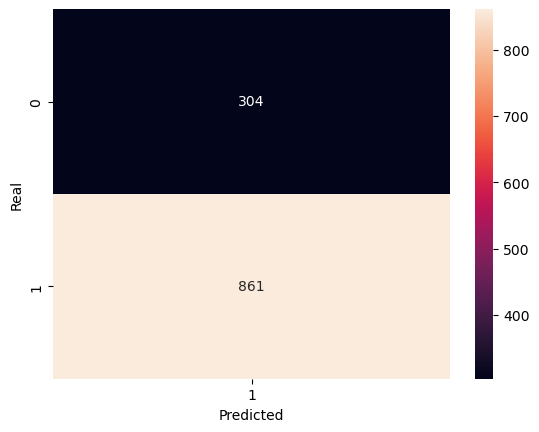

Time taken:  622.9756751060486
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs30_lr0.01_optimizerAdam,622.975675,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 30, learning rate: 0.1, optimizer: SGD
Current: 57/90
Training [3%]	Loss: 0.5844	Accuracy: 72.73%
Training [7%]	Loss: 0.5839	Accuracy: 72.92%
Training [10%]	Loss: 0.5831	Accuracy: 72.92%
Training [13%]	Loss: 0.5846	Accuracy: 72.92%
Training [17%]	Loss: 0.5846	Accuracy: 72.92%
Training [20%]	Loss: 0.5842	Accuracy: 72.92%
Training [23%]	Loss: 0.5831	Accuracy: 72.92%
Training [27%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5835	Accuracy: 72.92%
Training [33%]	Loss: 0.5849	Accuracy: 72.92%
Training [37%]	Loss: 0.5846	Accuracy: 72.92%
Training [40%]	Loss: 0.5853	Accuracy: 72.92%
Training [43%]	Loss: 0.5835	Accuracy: 72.92%
Training [47%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5835	Accuracy: 72.92%
Training [53%]	Loss: 0.5849	Accuracy: 72.92%
Training [57%]	Loss: 0.5828	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [63%]	Loss: 0.5842	Accuracy: 72.92%
Training [67%]	Loss: 0.5842	Ac

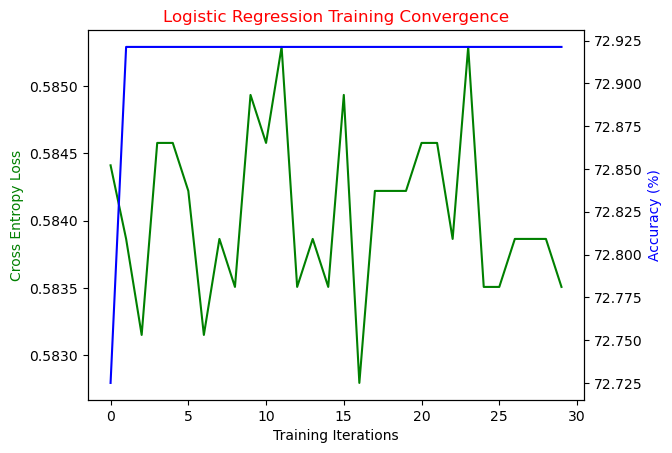

Performance on test data:
	Loss: 0.5751
	Accuracy: 73.91%


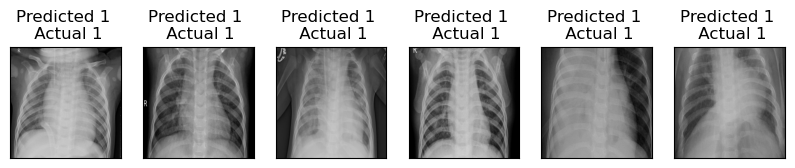

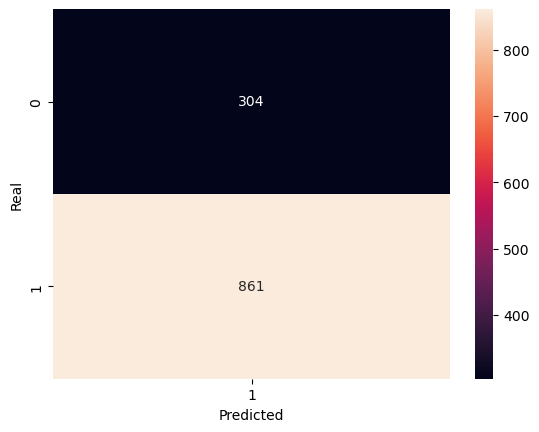

Time taken:  567.6742696762085
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs30_lr0.1_optimizerSGD,567.67427,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 30, learning rate: 0.1, optimizer: Adam
Current: 58/90
Training [3%]	Loss: 0.5847	Accuracy: 72.85%
Training [7%]	Loss: 0.5849	Accuracy: 72.92%
Training [10%]	Loss: 0.5835	Accuracy: 72.92%
Training [13%]	Loss: 0.5842	Accuracy: 72.92%
Training [17%]	Loss: 0.5846	Accuracy: 72.92%
Training [20%]	Loss: 0.5846	Accuracy: 72.92%
Training [23%]	Loss: 0.5835	Accuracy: 72.92%
Training [27%]	Loss: 0.5835	Accuracy: 72.92%
Training [30%]	Loss: 0.5831	Accuracy: 72.92%
Training [33%]	Loss: 0.5831	Accuracy: 72.92%
Training [37%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [43%]	Loss: 0.5842	Accuracy: 72.92%
Training [47%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5846	Accuracy: 72.92%
Training [53%]	Loss: 0.5839	Accuracy: 72.92%
Training [57%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [63%]	Loss: 0.5842	Accuracy: 72.92%
Training [67%]	Loss: 0.5831	A

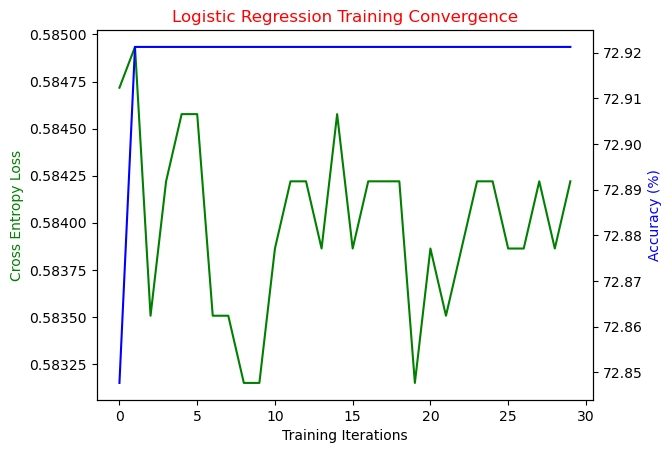

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


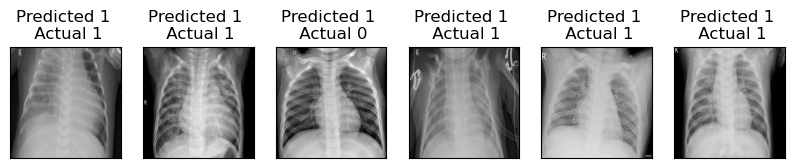

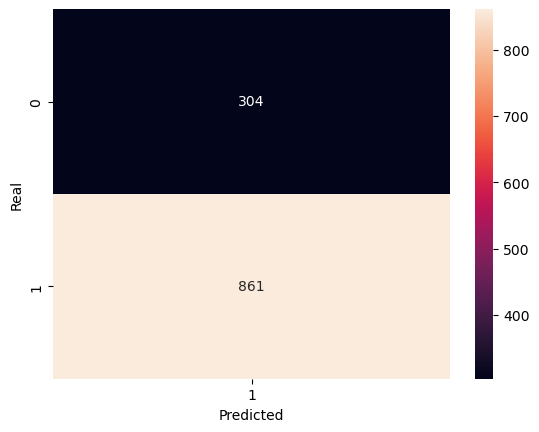

Time taken:  626.2813708782196
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs30_lr0.1_optimizerAdam,626.281371,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 30, learning rate: 1, optimizer: SGD
Current: 59/90
Training [3%]	Loss: 0.5834	Accuracy: 72.82%
Training [7%]	Loss: 0.5846	Accuracy: 72.92%
Training [10%]	Loss: 0.5846	Accuracy: 72.92%
Training [13%]	Loss: 0.5835	Accuracy: 72.92%
Training [17%]	Loss: 0.5842	Accuracy: 72.92%
Training [20%]	Loss: 0.5853	Accuracy: 72.92%
Training [23%]	Loss: 0.5839	Accuracy: 72.92%
Training [27%]	Loss: 0.5835	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [33%]	Loss: 0.5849	Accuracy: 72.92%
Training [37%]	Loss: 0.5835	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [43%]	Loss: 0.5842	Accuracy: 72.92%
Training [47%]	Loss: 0.5835	Accuracy: 72.92%
Training [50%]	Loss: 0.5839	Accuracy: 72.92%
Training [53%]	Loss: 0.5842	Accuracy: 72.92%
Training [57%]	Loss: 0.5846	Accuracy: 72.92%
Training [60%]	Loss: 0.5856	Accuracy: 72.92%
Training [63%]	Loss: 0.5842	Accuracy: 72.92%
Training [67%]	Loss: 0.5842	Accu

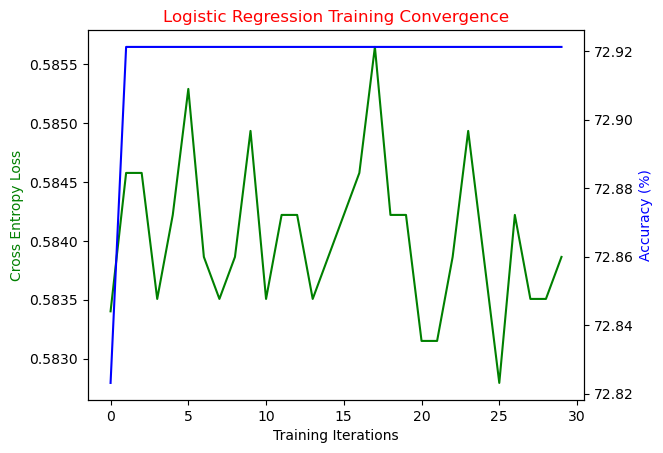

Performance on test data:
	Loss: 0.5752
	Accuracy: 73.91%


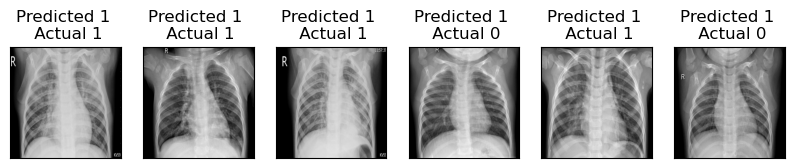

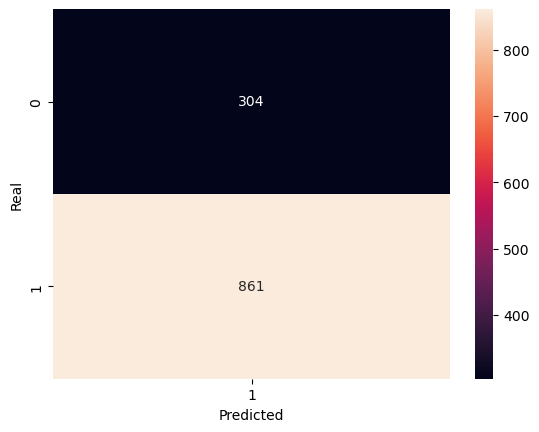

Time taken:  567.8547921180725
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs30_lr1_optimizerSGD,567.854792,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 32, epochs: 30, learning rate: 1, optimizer: Adam
Current: 60/90
Training [3%]	Loss: 0.5841	Accuracy: 72.92%
Training [7%]	Loss: 0.5842	Accuracy: 72.92%
Training [10%]	Loss: 0.5835	Accuracy: 72.92%
Training [13%]	Loss: 0.5839	Accuracy: 72.92%
Training [17%]	Loss: 0.5831	Accuracy: 72.92%
Training [20%]	Loss: 0.5835	Accuracy: 72.92%
Training [23%]	Loss: 0.5846	Accuracy: 72.92%
Training [27%]	Loss: 0.5853	Accuracy: 72.92%
Training [30%]	Loss: 0.5839	Accuracy: 72.92%
Training [33%]	Loss: 0.5839	Accuracy: 72.92%
Training [37%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5846	Accuracy: 72.92%
Training [43%]	Loss: 0.5835	Accuracy: 72.92%
Training [47%]	Loss: 0.5846	Accuracy: 72.92%
Training [50%]	Loss: 0.5831	Accuracy: 72.92%
Training [53%]	Loss: 0.5835	Accuracy: 72.92%
Training [57%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [63%]	Loss: 0.5839	Accuracy: 72.92%
Training [67%]	Loss: 0.5846	Acc

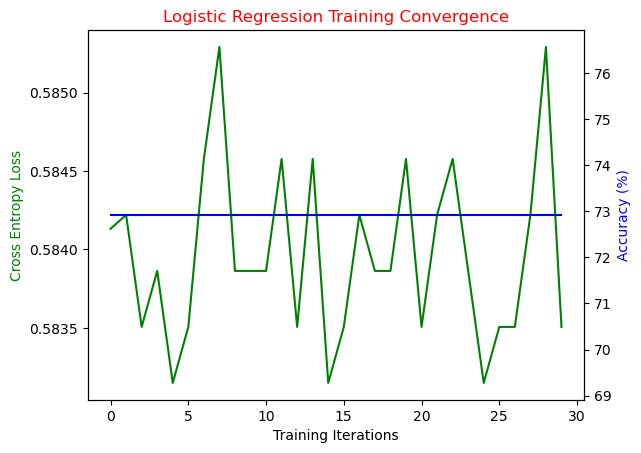

Performance on test data:
	Loss: 0.5751
	Accuracy: 73.91%


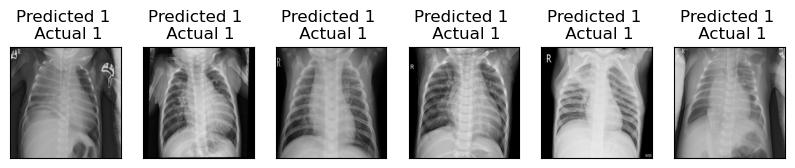

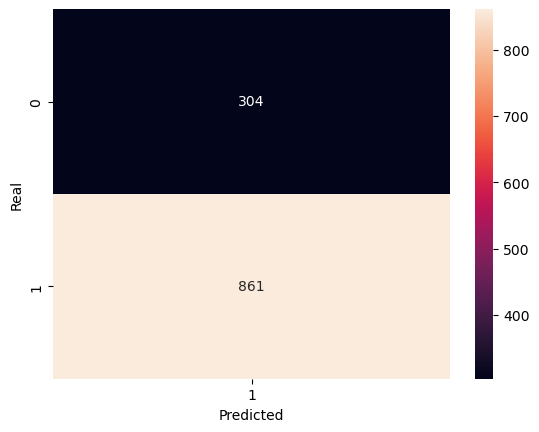

Time taken:  638.1714425086975
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch32_epochs30_lr1_optimizerAdam,638.171443,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 10, learning rate: 0.0001, optimizer: SGD
Current: 61/90
Training [10%]	Loss: 0.5810	Accuracy: 72.68%
Training [20%]	Loss: 0.5511	Accuracy: 72.92%
Training [30%]	Loss: 0.5266	Accuracy: 72.92%
Training [40%]	Loss: 0.5132	Accuracy: 72.92%
Training [50%]	Loss: 0.5051	Accuracy: 72.97%
Training [60%]	Loss: 0.4986	Accuracy: 72.97%
Training [70%]	Loss: 0.4937	Accuracy: 73.04%
Training [80%]	Loss: 0.4904	Accuracy: 73.09%
Training [90%]	Loss: 0.4875	Accuracy: 73.17%
Training [100%]	Loss: 0.4850	Accuracy: 73.19%
Time taken:  203.2997224330902


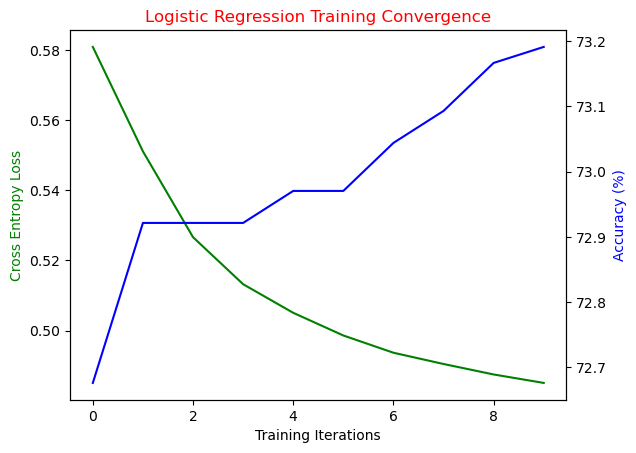

Performance on test data:
	Loss: 0.4745
	Accuracy: 74.16%


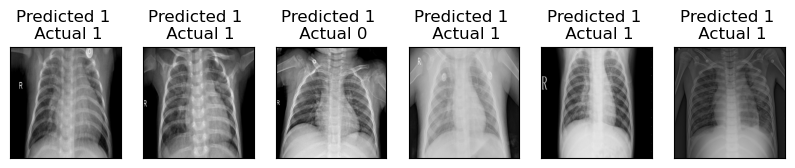

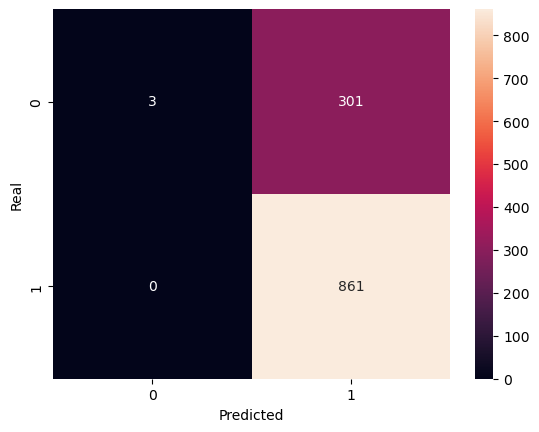

Time taken:  203.2997224330902
Test size: 1165
Total Accuracy:  0.7416309012875536
Total Precision:  0.7409638554216867
Total Recall:  1.0
Total F1 Score:  0.8512110726643599
Classification Report:

              precision    recall  f1-score   support

           0       1.00      0.01      0.02       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.87      0.50      0.44      1165
weighted avg       0.81      0.74      0.63      1165



,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs10_lr0.0001_optimizerSGD,203.299722,0.741631,0.740964,1.0,0.851211


Data Stored Successfully
Training with batch size: 64, epochs: 10, learning rate: 0.0001, optimizer: Adam
Current: 62/90
Training [10%]	Loss: 0.5861	Accuracy: 72.33%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5836	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [60%]	Loss: 0.5846	Accuracy: 72.92%
Training [70%]	Loss: 0.5844	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5844	Accuracy: 72.92%
Training [100%]	Loss: 0.5838	Accuracy: 72.92%
Time taken:  204.6422119140625


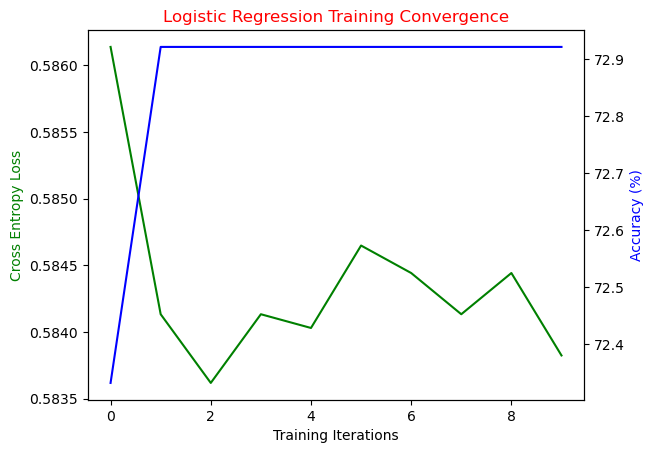

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


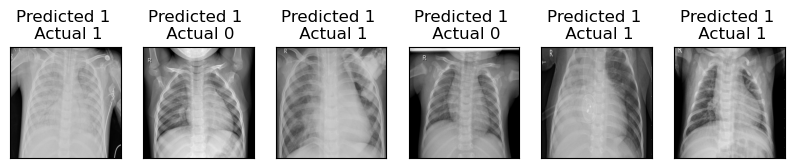

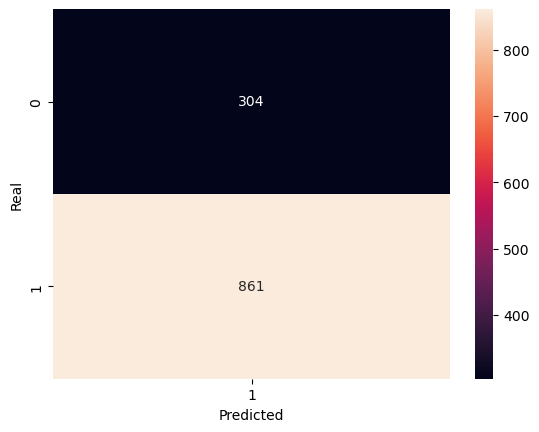

Time taken:  204.6422119140625
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs10_lr0.0001_optimizerAdam,204.642212,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 10, learning rate: 0.001, optimizer: SGD
Current: 63/90
Training [10%]	Loss: 0.5851	Accuracy: 72.92%
Training [20%]	Loss: 0.5844	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5843	Accuracy: 72.92%
Training [70%]	Loss: 0.5843	Accuracy: 72.92%
Training [80%]	Loss: 0.5839	Accuracy: 72.92%
Training [90%]	Loss: 0.5838	Accuracy: 72.92%
Training [100%]	Loss: 0.5843	Accuracy: 72.92%
Time taken:  202.7689220905304


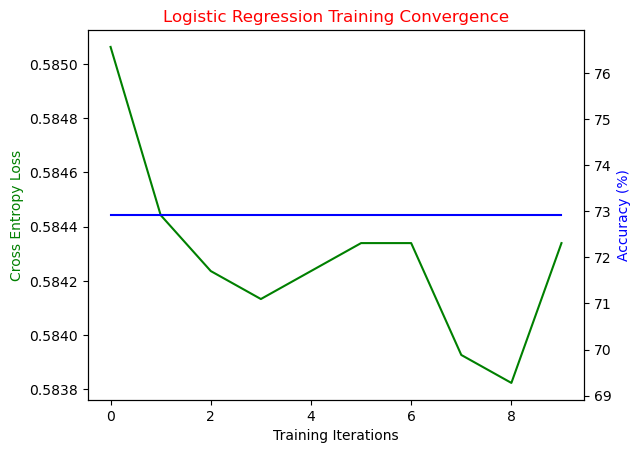

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


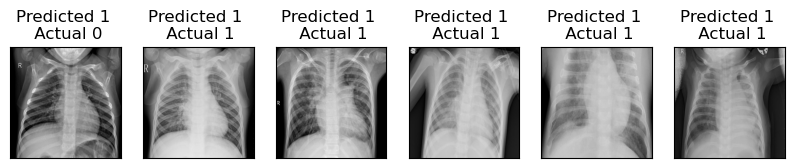

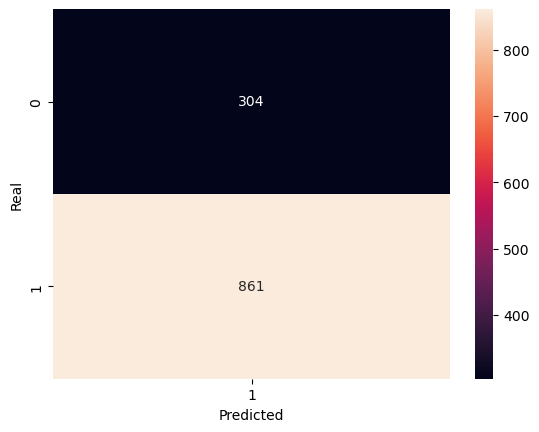

Time taken:  202.7689220905304
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs10_lr0.001_optimizerSGD,202.768922,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 10, learning rate: 0.001, optimizer: Adam
Current: 64/90
Training [10%]	Loss: 0.5870	Accuracy: 72.82%
Training [20%]	Loss: 0.5836	Accuracy: 72.92%
Training [30%]	Loss: 0.5843	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [50%]	Loss: 0.5838	Accuracy: 72.92%
Training [60%]	Loss: 0.5835	Accuracy: 72.92%
Training [70%]	Loss: 0.5839	Accuracy: 72.92%
Training [80%]	Loss: 0.5836	Accuracy: 72.92%
Training [90%]	Loss: 0.5837	Accuracy: 72.92%
Training [100%]	Loss: 0.5840	Accuracy: 72.92%
Time taken:  203.2465853691101


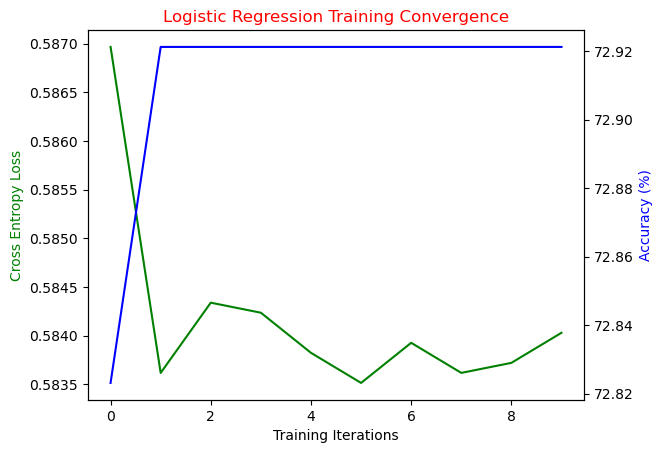

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


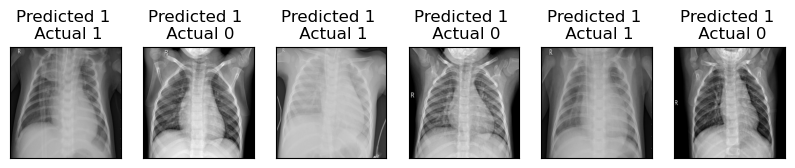

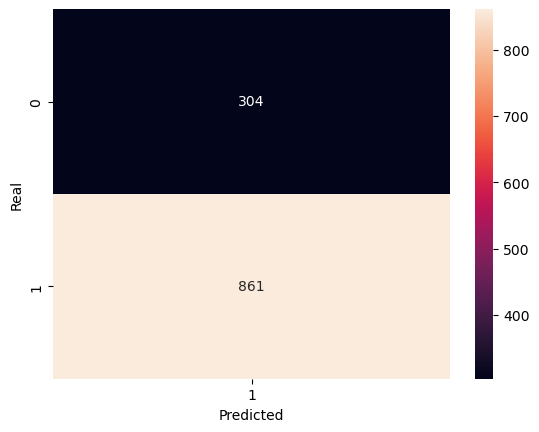

Time taken:  203.2465853691101
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs10_lr0.001_optimizerAdam,203.246585,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 10, learning rate: 0.01, optimizer: SGD
Current: 65/90
Training [10%]	Loss: 0.5861	Accuracy: 72.75%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5834	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5837	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [70%]	Loss: 0.5837	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5839	Accuracy: 72.92%
Training [100%]	Loss: 0.5835	Accuracy: 72.92%
Time taken:  199.65758228302002


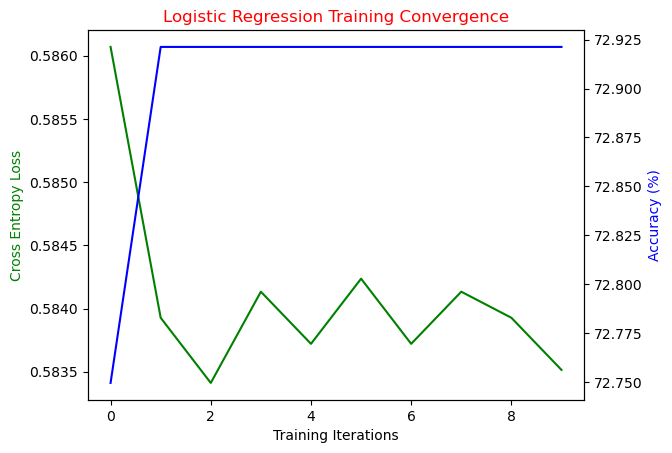

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


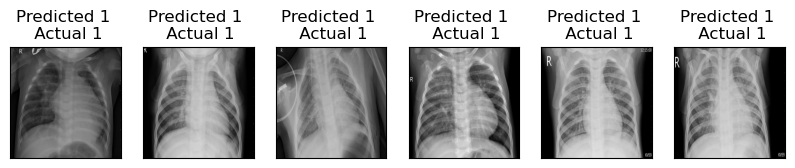

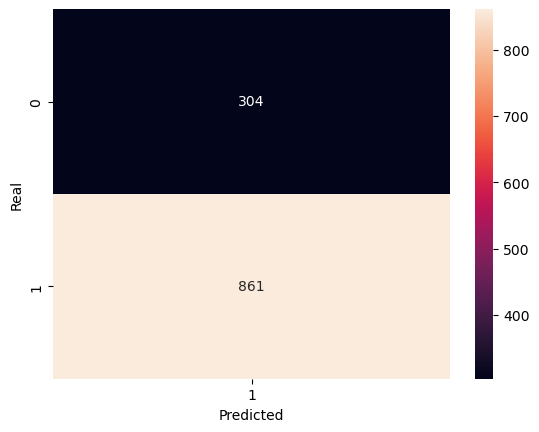

Time taken:  199.65758228302002
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs10_lr0.01_optimizerSGD,199.657582,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 10, learning rate: 0.01, optimizer: Adam
Current: 66/90
Training [10%]	Loss: 0.5865	Accuracy: 72.77%
Training [20%]	Loss: 0.5843	Accuracy: 72.92%
Training [30%]	Loss: 0.5843	Accuracy: 72.92%
Training [40%]	Loss: 0.5837	Accuracy: 72.92%
Training [50%]	Loss: 0.5850	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [70%]	Loss: 0.5839	Accuracy: 72.92%
Training [80%]	Loss: 0.5839	Accuracy: 72.92%
Training [90%]	Loss: 0.5839	Accuracy: 72.92%
Training [100%]	Loss: 0.5841	Accuracy: 72.92%
Time taken:  201.059876203537


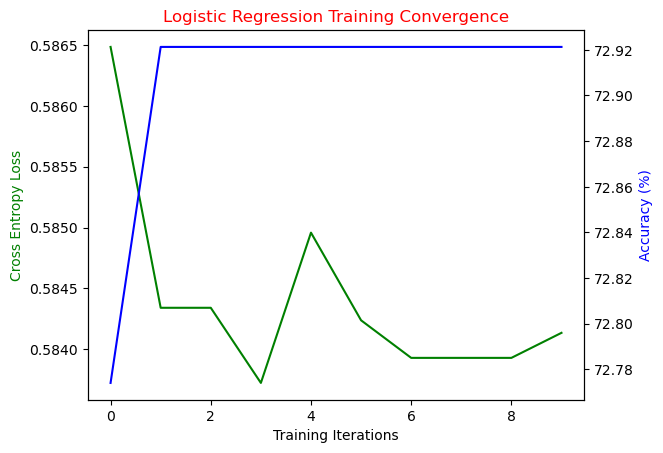

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


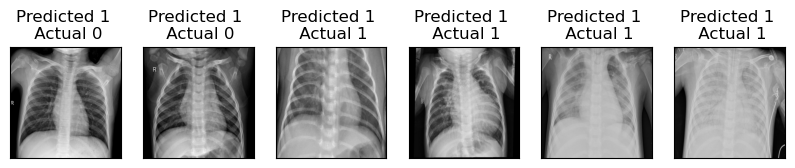

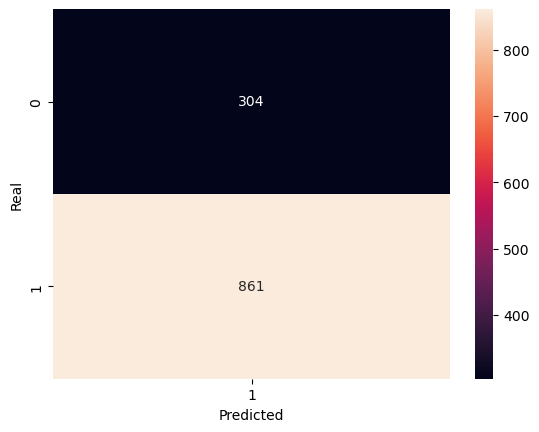

Time taken:  201.059876203537
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs10_lr0.01_optimizerAdam,201.059876,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 10, learning rate: 0.1, optimizer: SGD
Current: 67/90
Training [10%]	Loss: 0.5851	Accuracy: 72.38%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5835	Accuracy: 72.92%
Training [40%]	Loss: 0.5850	Accuracy: 72.92%
Training [50%]	Loss: 0.5843	Accuracy: 72.92%
Training [60%]	Loss: 0.5848	Accuracy: 72.92%
Training [70%]	Loss: 0.5839	Accuracy: 72.92%
Training [80%]	Loss: 0.5838	Accuracy: 72.92%
Training [90%]	Loss: 0.5844	Accuracy: 72.92%
Training [100%]	Loss: 0.5836	Accuracy: 72.92%
Time taken:  198.21016931533813


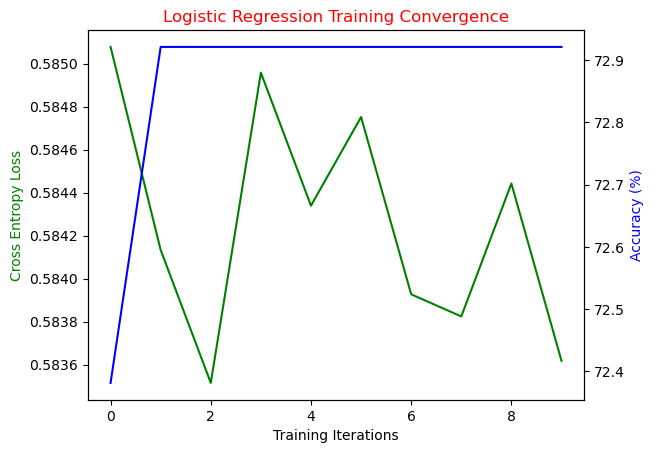

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


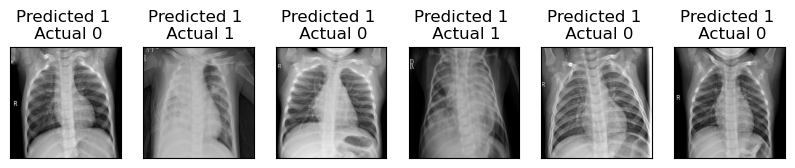

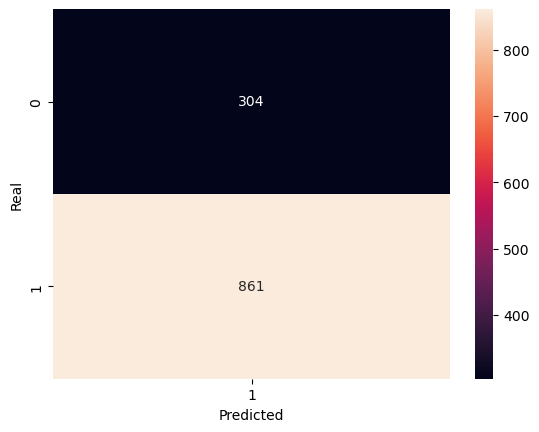

Time taken:  198.21016931533813
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs10_lr0.1_optimizerSGD,198.210169,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 10, learning rate: 0.1, optimizer: Adam
Current: 68/90
Training [10%]	Loss: 0.5863	Accuracy: 72.14%
Training [20%]	Loss: 0.5848	Accuracy: 72.92%
Training [30%]	Loss: 0.5837	Accuracy: 72.92%
Training [40%]	Loss: 0.5835	Accuracy: 72.92%
Training [50%]	Loss: 0.5839	Accuracy: 72.92%
Training [60%]	Loss: 0.5844	Accuracy: 72.92%
Training [70%]	Loss: 0.5846	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5843	Accuracy: 72.92%
Training [100%]	Loss: 0.5836	Accuracy: 72.92%
Time taken:  200.74035692214966


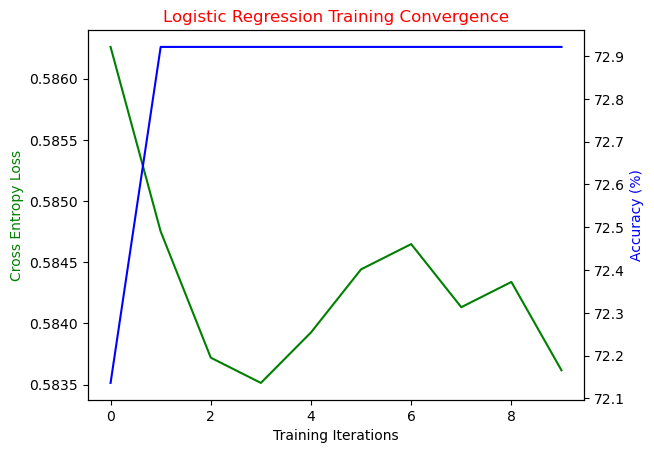

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


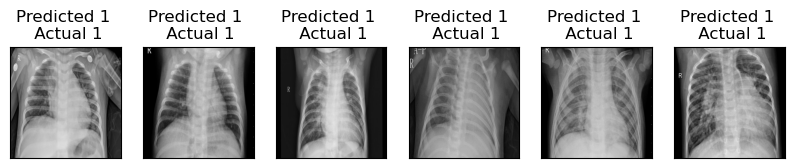

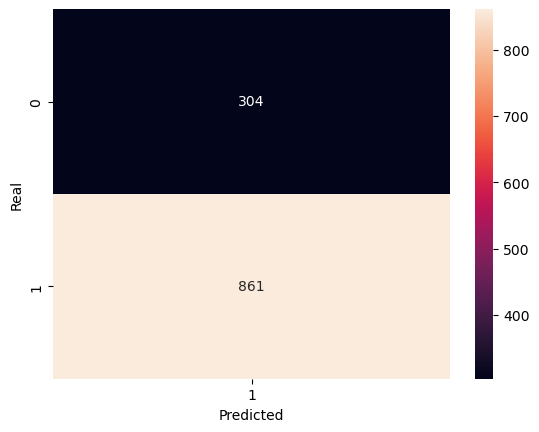

Time taken:  200.74035692214966
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs10_lr0.1_optimizerAdam,200.740357,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 10, learning rate: 1, optimizer: SGD
Current: 69/90
Training [10%]	Loss: 0.5862	Accuracy: 72.92%
Training [20%]	Loss: 0.5843	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [40%]	Loss: 0.5836	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [60%]	Loss: 0.5838	Accuracy: 72.92%
Training [70%]	Loss: 0.5836	Accuracy: 72.92%
Training [80%]	Loss: 0.5839	Accuracy: 72.92%
Training [90%]	Loss: 0.5838	Accuracy: 72.92%
Training [100%]	Loss: 0.5841	Accuracy: 72.92%
Time taken:  198.99372816085815


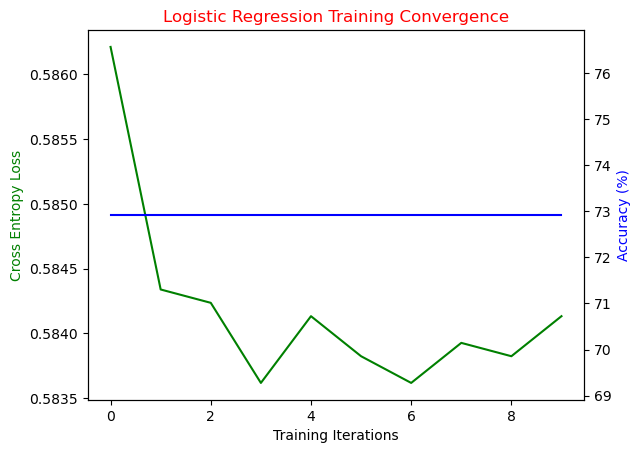

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


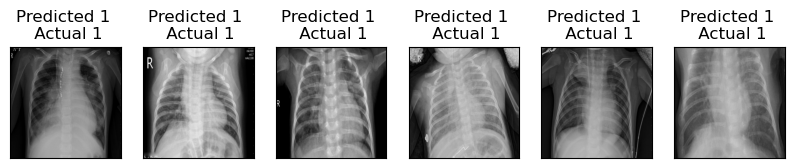

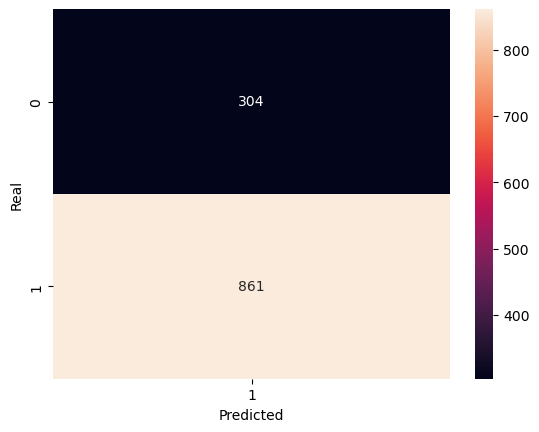

Time taken:  198.99372816085815
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs10_lr1_optimizerSGD,198.993728,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 10, learning rate: 1, optimizer: Adam
Current: 70/90
Training [10%]	Loss: 0.5855	Accuracy: 72.92%
Training [20%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [60%]	Loss: 0.5843	Accuracy: 72.92%
Training [70%]	Loss: 0.5839	Accuracy: 72.92%
Training [80%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5839	Accuracy: 72.92%
Training [100%]	Loss: 0.5843	Accuracy: 72.92%
Time taken:  201.24700164794922


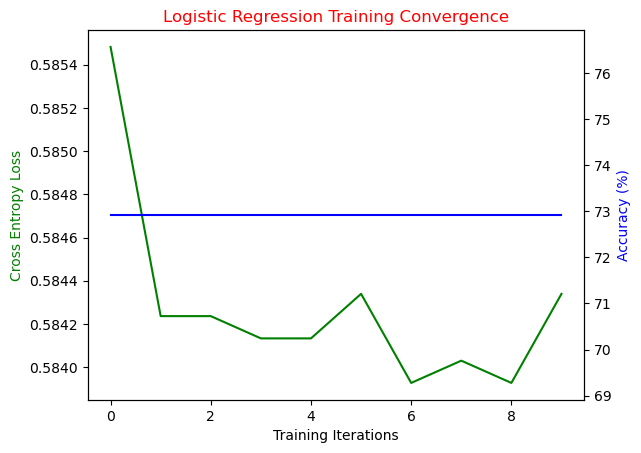

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


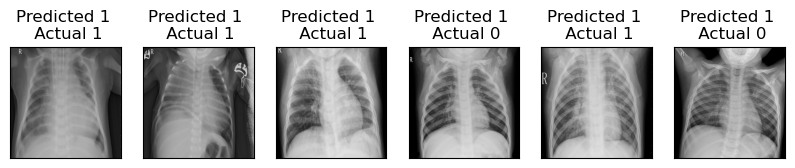

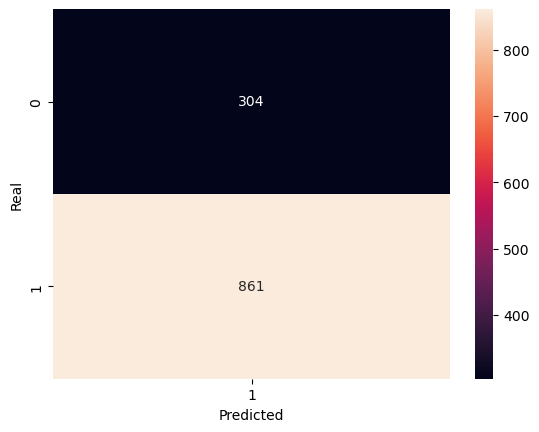

Time taken:  201.24700164794922
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs10_lr1_optimizerAdam,201.247002,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 20, learning rate: 0.0001, optimizer: SGD
Current: 71/90
Training [5%]	Loss: 0.5839	Accuracy: 72.43%
Training [10%]	Loss: 0.5552	Accuracy: 72.92%
Training [15%]	Loss: 0.5290	Accuracy: 73.12%
Training [20%]	Loss: 0.5107	Accuracy: 78.27%
Training [25%]	Loss: 0.4896	Accuracy: 85.09%
Training [30%]	Loss: 0.4745	Accuracy: 87.27%
Training [35%]	Loss: 0.4621	Accuracy: 88.55%
Training [40%]	Loss: 0.4535	Accuracy: 89.31%
Training [45%]	Loss: 0.4464	Accuracy: 89.60%
Training [50%]	Loss: 0.4416	Accuracy: 90.09%
Training [55%]	Loss: 0.4366	Accuracy: 90.46%
Training [60%]	Loss: 0.4323	Accuracy: 90.80%
Training [65%]	Loss: 0.4295	Accuracy: 90.97%
Training [70%]	Loss: 0.4263	Accuracy: 91.22%
Training [75%]	Loss: 0.4236	Accuracy: 91.42%
Training [80%]	Loss: 0.4214	Accuracy: 91.56%
Training [85%]	Loss: 0.4194	Accuracy: 91.51%
Training [90%]	Loss: 0.4174	Accuracy: 91.95%
Training [95%]	Loss: 0.4158	Accuracy: 92.03%
Training [100%]	Loss: 0.41

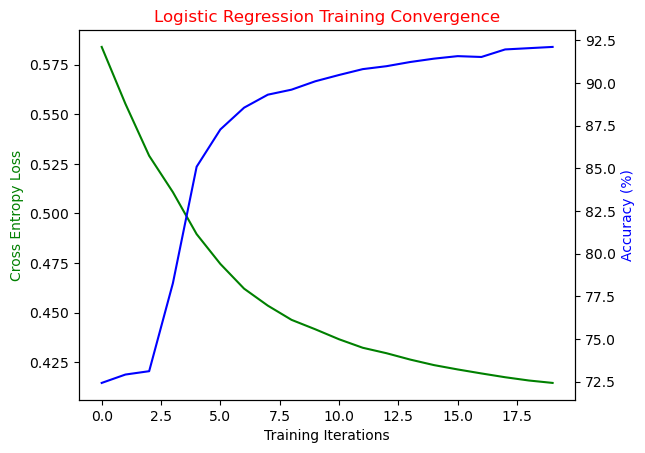

Performance on test data:
	Loss: 0.4042
	Accuracy: 92.79%


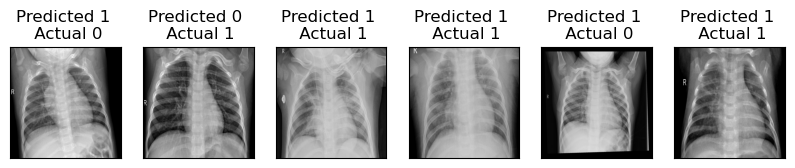

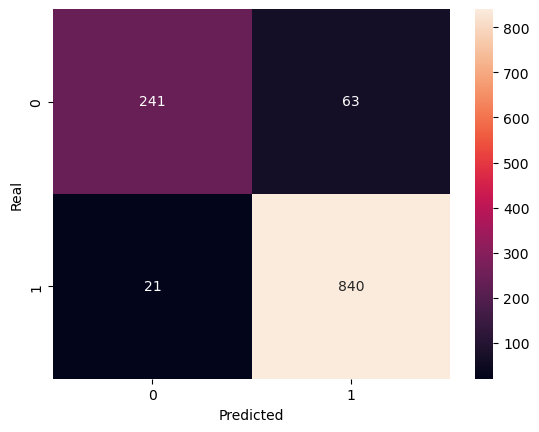

Time taken:  399.7247004508972
Test size: 1165
Total Accuracy:  0.9278969957081545
Total Precision:  0.9302325581395349
Total Recall:  0.975609756097561
Total F1 Score:  0.9523809523809524
Classification Report:

              precision    recall  f1-score   support

           0       0.92      0.79      0.85       304
           1       0.93      0.98      0.95       861

    accuracy                           0.93      1165
   macro avg       0.93      0.88      0.90      1165
weighted avg       0.93      0.93      0.93      1165



,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs20_lr0.0001_optimizerSGD,399.7247,0.927897,0.930233,0.97561,0.952381


Data Stored Successfully
Training with batch size: 64, epochs: 20, learning rate: 0.0001, optimizer: Adam
Current: 72/90
Training [5%]	Loss: 0.5858	Accuracy: 72.28%
Training [10%]	Loss: 0.5843	Accuracy: 72.92%
Training [15%]	Loss: 0.5843	Accuracy: 72.92%
Training [20%]	Loss: 0.5845	Accuracy: 72.92%
Training [25%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5844	Accuracy: 72.92%
Training [35%]	Loss: 0.5843	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [45%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [55%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [65%]	Loss: 0.5839	Accuracy: 72.92%
Training [70%]	Loss: 0.5834	Accuracy: 72.92%
Training [75%]	Loss: 0.5840	Accuracy: 72.92%
Training [80%]	Loss: 0.5837	Accuracy: 72.92%
Training [85%]	Loss: 0.5838	Accuracy: 72.92%
Training [90%]	Loss: 0.5845	Accuracy: 72.92%
Training [95%]	Loss: 0.5835	Accuracy: 72.92%
Training [100%]	Loss: 0.5

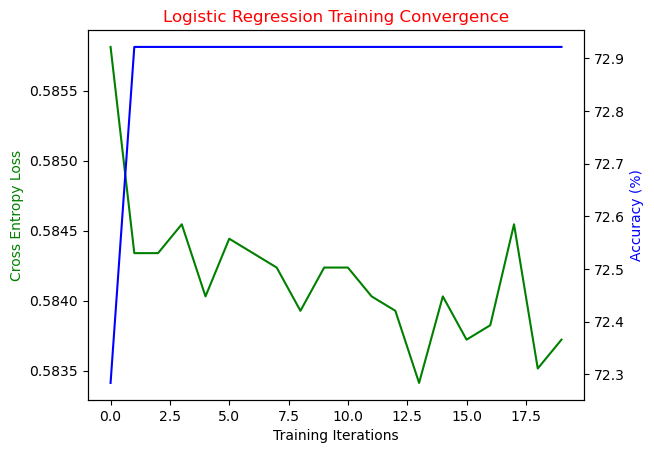

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


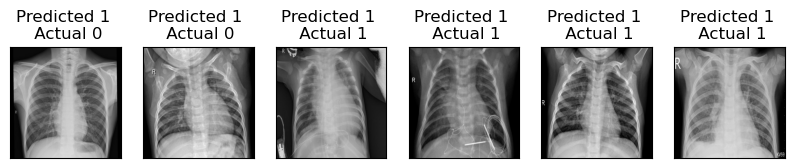

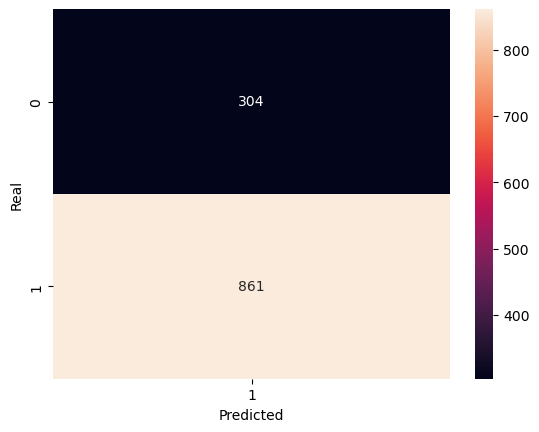

Time taken:  410.6412582397461
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs20_lr0.0001_optimizerAdam,410.641258,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 20, learning rate: 0.001, optimizer: SGD
Current: 73/90
Training [5%]	Loss: 0.5851	Accuracy: 72.19%
Training [10%]	Loss: 0.5843	Accuracy: 72.92%
Training [15%]	Loss: 0.5839	Accuracy: 72.92%
Training [20%]	Loss: 0.5837	Accuracy: 72.92%
Training [25%]	Loss: 0.5844	Accuracy: 72.92%
Training [30%]	Loss: 0.5841	Accuracy: 72.92%
Training [35%]	Loss: 0.5838	Accuracy: 72.92%
Training [40%]	Loss: 0.5843	Accuracy: 72.92%
Training [45%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5843	Accuracy: 72.92%
Training [55%]	Loss: 0.5839	Accuracy: 72.92%
Training [60%]	Loss: 0.5837	Accuracy: 72.92%
Training [65%]	Loss: 0.5835	Accuracy: 72.92%
Training [70%]	Loss: 0.5838	Accuracy: 72.92%
Training [75%]	Loss: 0.5843	Accuracy: 72.92%
Training [80%]	Loss: 0.5842	Accuracy: 72.92%
Training [85%]	Loss: 0.5846	Accuracy: 72.92%
Training [90%]	Loss: 0.5841	Accuracy: 72.92%
Training [95%]	Loss: 0.5844	Accuracy: 72.92%
Training [100%]	Loss: 0.584

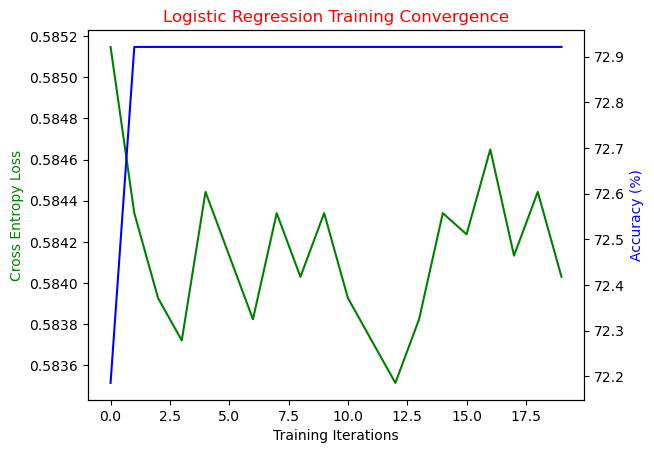

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


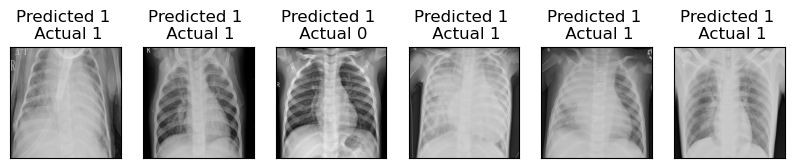

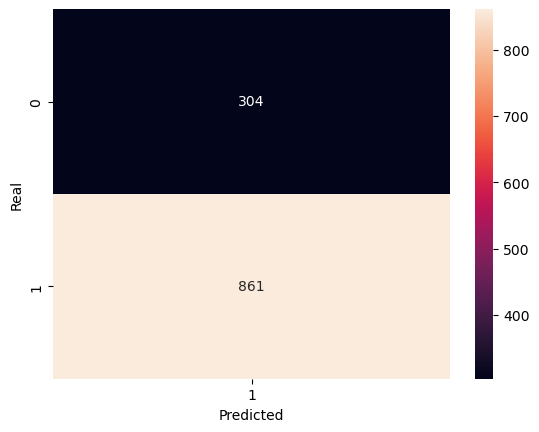

Time taken:  400.1477816104889
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs20_lr0.001_optimizerSGD,400.147782,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 20, learning rate: 0.001, optimizer: Adam
Current: 74/90
Training [5%]	Loss: 0.5850	Accuracy: 72.92%
Training [10%]	Loss: 0.5843	Accuracy: 72.92%
Training [15%]	Loss: 0.5842	Accuracy: 72.92%
Training [20%]	Loss: 0.5834	Accuracy: 72.92%
Training [25%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [35%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5837	Accuracy: 72.92%
Training [45%]	Loss: 0.5842	Accuracy: 72.92%
Training [50%]	Loss: 0.5835	Accuracy: 72.92%
Training [55%]	Loss: 0.5838	Accuracy: 72.92%
Training [60%]	Loss: 0.5840	Accuracy: 72.92%
Training [65%]	Loss: 0.5843	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [75%]	Loss: 0.5843	Accuracy: 72.92%
Training [80%]	Loss: 0.5837	Accuracy: 72.92%
Training [85%]	Loss: 0.5840	Accuracy: 72.92%
Training [90%]	Loss: 0.5835	Accuracy: 72.92%
Training [95%]	Loss: 0.5839	Accuracy: 72.92%
Training [100%]	Loss: 0.58

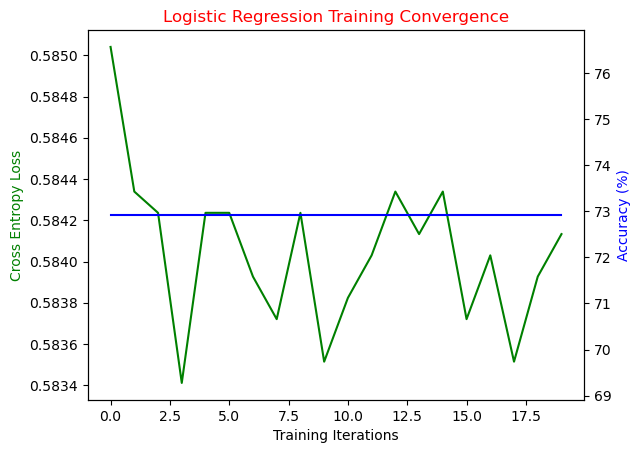

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


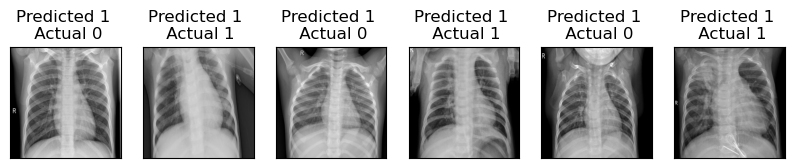

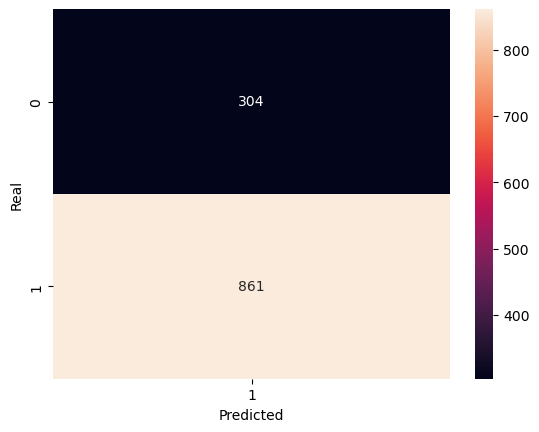

Time taken:  409.8297984600067
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs20_lr0.001_optimizerAdam,409.829798,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 20, learning rate: 0.01, optimizer: SGD
Current: 75/90
Training [5%]	Loss: 0.5876	Accuracy: 71.99%
Training [10%]	Loss: 0.5844	Accuracy: 72.92%
Training [15%]	Loss: 0.5838	Accuracy: 72.92%
Training [20%]	Loss: 0.5836	Accuracy: 72.92%
Training [25%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [35%]	Loss: 0.5839	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [45%]	Loss: 0.5844	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [55%]	Loss: 0.5843	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [65%]	Loss: 0.5839	Accuracy: 72.92%
Training [70%]	Loss: 0.5846	Accuracy: 72.92%
Training [75%]	Loss: 0.5843	Accuracy: 72.92%
Training [80%]	Loss: 0.5841	Accuracy: 72.92%
Training [85%]	Loss: 0.5844	Accuracy: 72.92%
Training [90%]	Loss: 0.5845	Accuracy: 72.92%
Training [95%]	Loss: 0.5841	Accuracy: 72.92%
Training [100%]	Loss: 0.5841

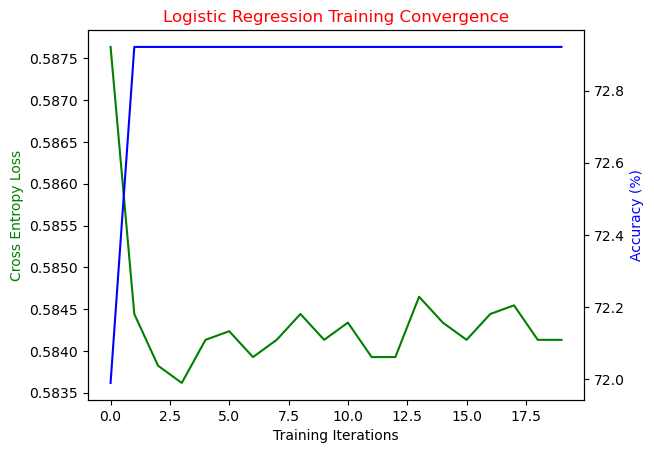

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


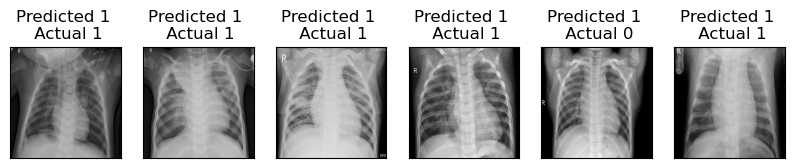

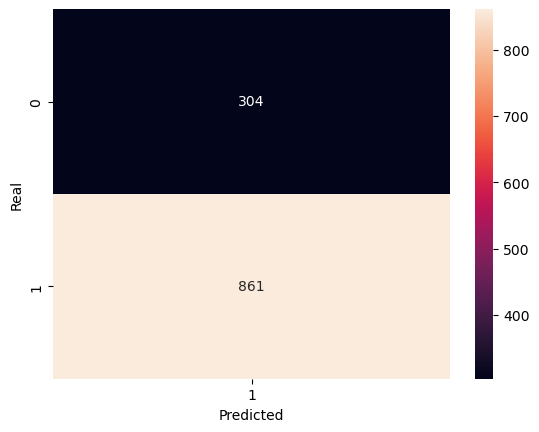

Time taken:  400.8694086074829
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs20_lr0.01_optimizerSGD,400.869409,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 20, learning rate: 0.01, optimizer: Adam
Current: 76/90
Training [5%]	Loss: 0.5866	Accuracy: 72.95%
Training [10%]	Loss: 0.5843	Accuracy: 72.92%
Training [15%]	Loss: 0.5836	Accuracy: 72.92%
Training [20%]	Loss: 0.5837	Accuracy: 72.92%
Training [25%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5838	Accuracy: 72.92%
Training [35%]	Loss: 0.5848	Accuracy: 72.92%
Training [40%]	Loss: 0.5836	Accuracy: 72.92%
Training [45%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [55%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [65%]	Loss: 0.5836	Accuracy: 72.92%
Training [70%]	Loss: 0.5842	Accuracy: 72.92%
Training [75%]	Loss: 0.5846	Accuracy: 72.92%
Training [80%]	Loss: 0.5842	Accuracy: 72.92%
Training [85%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5844	Accuracy: 72.92%
Training [95%]	Loss: 0.5842	Accuracy: 72.92%
Training [100%]	Loss: 0.584

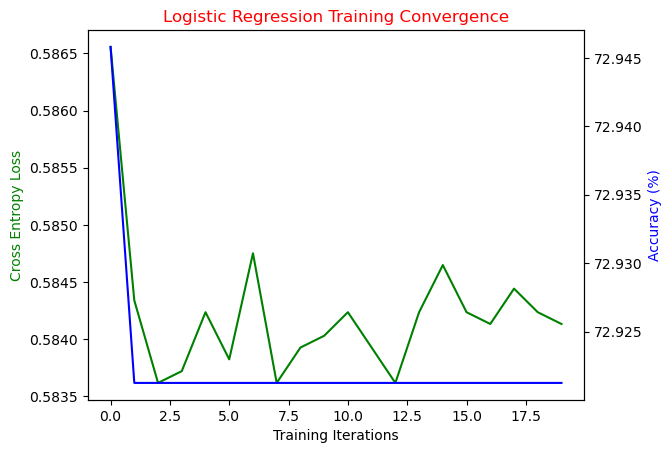

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


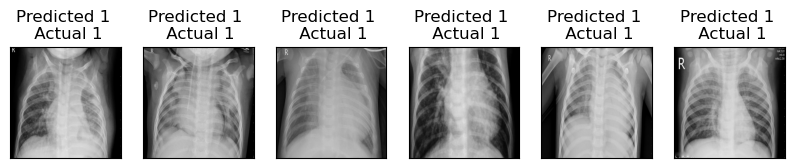

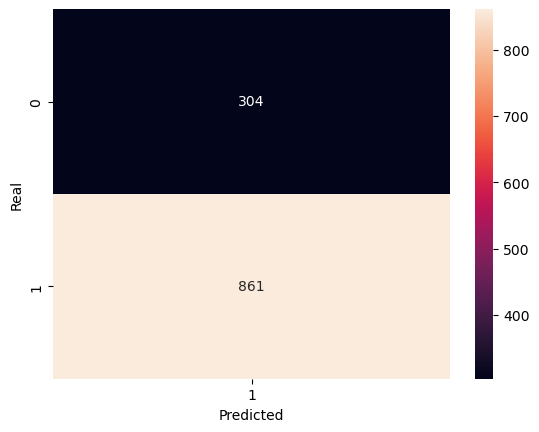

Time taken:  410.1120808124542
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs20_lr0.01_optimizerAdam,410.112081,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 20, learning rate: 0.1, optimizer: SGD
Current: 77/90
Training [5%]	Loss: 0.5858	Accuracy: 72.55%
Training [10%]	Loss: 0.5836	Accuracy: 72.92%
Training [15%]	Loss: 0.5843	Accuracy: 72.92%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [25%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [35%]	Loss: 0.5835	Accuracy: 72.92%
Training [40%]	Loss: 0.5838	Accuracy: 72.92%
Training [45%]	Loss: 0.5843	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [55%]	Loss: 0.5843	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [65%]	Loss: 0.5837	Accuracy: 72.92%
Training [70%]	Loss: 0.5842	Accuracy: 72.92%
Training [75%]	Loss: 0.5840	Accuracy: 72.92%
Training [80%]	Loss: 0.5844	Accuracy: 72.92%
Training [85%]	Loss: 0.5842	Accuracy: 72.92%
Training [90%]	Loss: 0.5842	Accuracy: 72.92%
Training [95%]	Loss: 0.5841	Accuracy: 72.92%
Training [100%]	Loss: 0.5842	

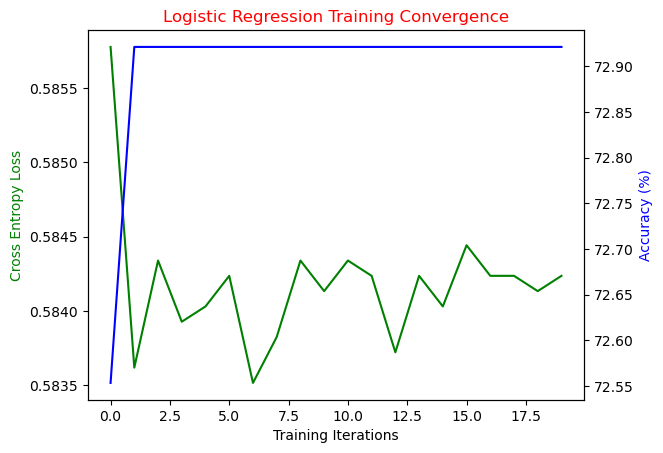

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


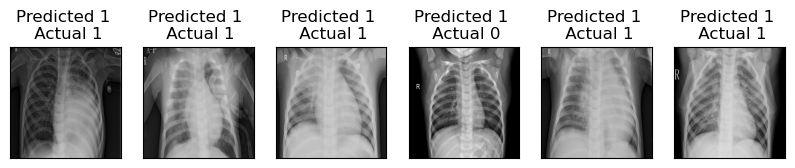

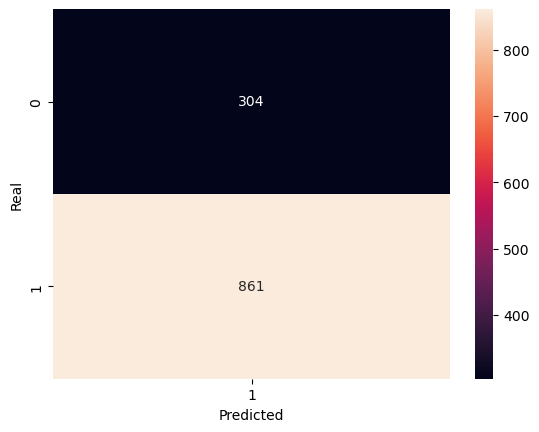

Time taken:  398.9622218608856
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs20_lr0.1_optimizerSGD,398.962222,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 20, learning rate: 0.1, optimizer: Adam
Current: 78/90
Training [5%]	Loss: 0.5863	Accuracy: 72.19%
Training [10%]	Loss: 0.5832	Accuracy: 72.92%
Training [15%]	Loss: 0.5837	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [25%]	Loss: 0.5836	Accuracy: 72.92%
Training [30%]	Loss: 0.5837	Accuracy: 72.92%
Training [35%]	Loss: 0.5842	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [45%]	Loss: 0.5838	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [55%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [65%]	Loss: 0.5841	Accuracy: 72.92%
Training [70%]	Loss: 0.5842	Accuracy: 72.92%
Training [75%]	Loss: 0.5834	Accuracy: 72.92%
Training [80%]	Loss: 0.5845	Accuracy: 72.92%
Training [85%]	Loss: 0.5836	Accuracy: 72.92%
Training [90%]	Loss: 0.5840	Accuracy: 72.92%
Training [95%]	Loss: 0.5844	Accuracy: 72.92%
Training [100%]	Loss: 0.5848

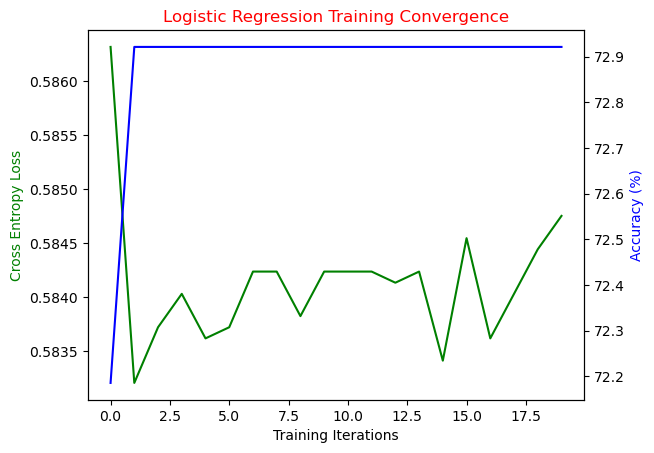

Performance on test data:
	Loss: 0.5748
	Accuracy: 73.91%


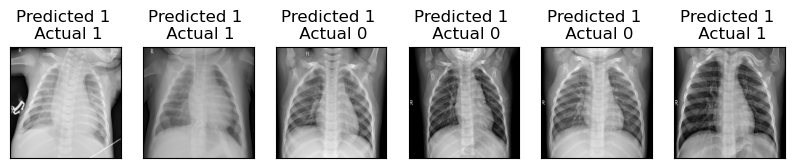

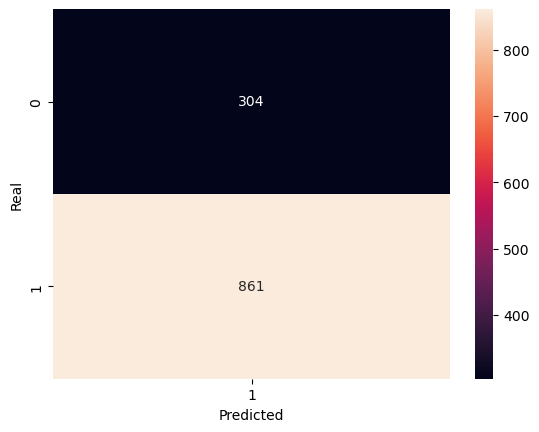

Time taken:  409.20268964767456
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs20_lr0.1_optimizerAdam,409.20269,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 20, learning rate: 1, optimizer: SGD
Current: 79/90
Training [5%]	Loss: 0.5860	Accuracy: 72.31%
Training [10%]	Loss: 0.5834	Accuracy: 72.92%
Training [15%]	Loss: 0.5840	Accuracy: 72.92%
Training [20%]	Loss: 0.5840	Accuracy: 72.92%
Training [25%]	Loss: 0.5840	Accuracy: 72.92%
Training [30%]	Loss: 0.5841	Accuracy: 72.92%
Training [35%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5842	Accuracy: 72.92%
Training [45%]	Loss: 0.5841	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [55%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5835	Accuracy: 72.92%
Training [65%]	Loss: 0.5836	Accuracy: 72.92%
Training [70%]	Loss: 0.5841	Accuracy: 72.92%
Training [75%]	Loss: 0.5840	Accuracy: 72.92%
Training [80%]	Loss: 0.5842	Accuracy: 72.92%
Training [85%]	Loss: 0.5843	Accuracy: 72.92%
Training [90%]	Loss: 0.5842	Accuracy: 72.92%
Training [95%]	Loss: 0.5842	Accuracy: 72.92%
Training [100%]	Loss: 0.5838	Ac

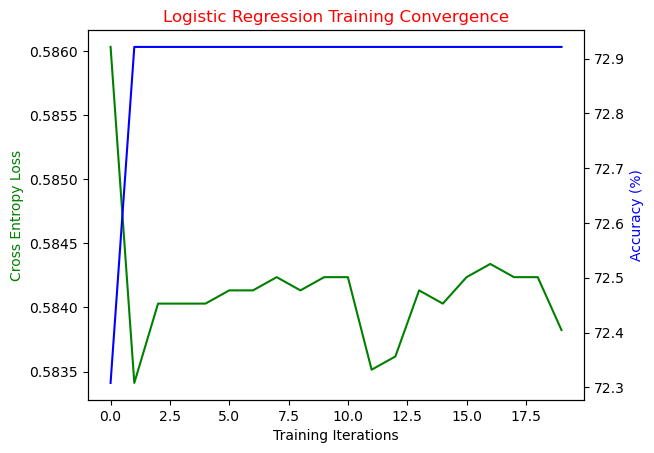

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


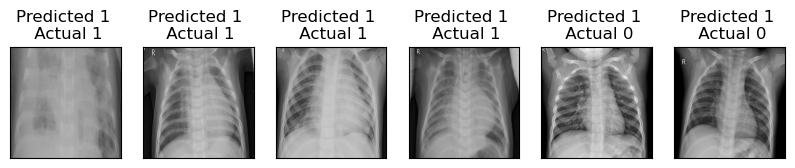

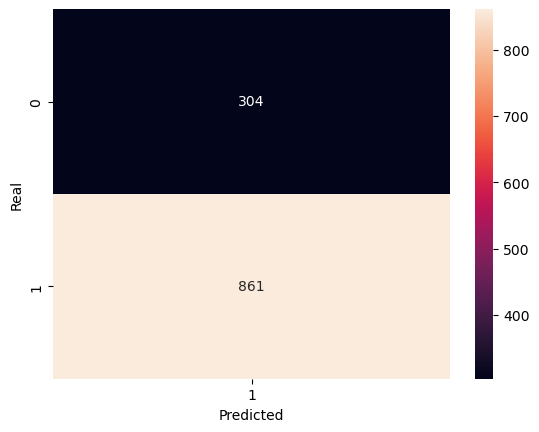

Time taken:  400.8607876300812
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs20_lr1_optimizerSGD,400.860788,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 20, learning rate: 1, optimizer: Adam
Current: 80/90
Training [5%]	Loss: 0.5864	Accuracy: 72.65%
Training [10%]	Loss: 0.5837	Accuracy: 72.92%
Training [15%]	Loss: 0.5838	Accuracy: 72.92%
Training [20%]	Loss: 0.5836	Accuracy: 72.92%
Training [25%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5838	Accuracy: 72.92%
Training [35%]	Loss: 0.5837	Accuracy: 72.92%
Training [40%]	Loss: 0.5839	Accuracy: 72.92%
Training [45%]	Loss: 0.5842	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [55%]	Loss: 0.5843	Accuracy: 72.92%
Training [60%]	Loss: 0.5842	Accuracy: 72.92%
Training [65%]	Loss: 0.5837	Accuracy: 72.92%
Training [70%]	Loss: 0.5837	Accuracy: 72.92%
Training [75%]	Loss: 0.5845	Accuracy: 72.92%
Training [80%]	Loss: 0.5837	Accuracy: 72.92%
Training [85%]	Loss: 0.5841	Accuracy: 72.92%
Training [90%]	Loss: 0.5840	Accuracy: 72.92%
Training [95%]	Loss: 0.5843	Accuracy: 72.92%
Training [100%]	Loss: 0.5840	A

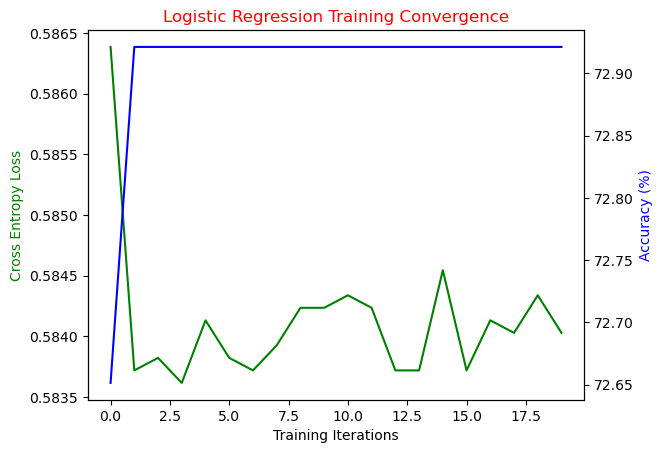

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


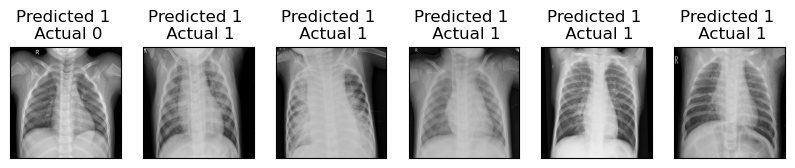

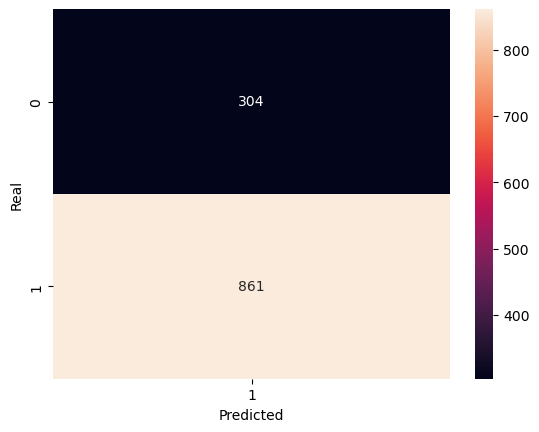

Time taken:  410.8679690361023
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs20_lr1_optimizerAdam,410.867969,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 30, learning rate: 0.0001, optimizer: SGD
Current: 81/90
Training [3%]	Loss: 0.5871	Accuracy: 72.92%
Training [7%]	Loss: 0.5651	Accuracy: 72.92%
Training [10%]	Loss: 0.5348	Accuracy: 72.92%
Training [13%]	Loss: 0.5174	Accuracy: 72.99%
Training [17%]	Loss: 0.5075	Accuracy: 73.39%
Training [20%]	Loss: 0.4992	Accuracy: 76.77%
Training [23%]	Loss: 0.4866	Accuracy: 85.14%
Training [27%]	Loss: 0.4721	Accuracy: 87.54%
Training [30%]	Loss: 0.4601	Accuracy: 88.96%
Training [33%]	Loss: 0.4518	Accuracy: 89.67%
Training [37%]	Loss: 0.4444	Accuracy: 90.19%
Training [40%]	Loss: 0.4401	Accuracy: 90.36%
Training [43%]	Loss: 0.4346	Accuracy: 90.63%
Training [47%]	Loss: 0.4303	Accuracy: 90.78%
Training [50%]	Loss: 0.4273	Accuracy: 91.37%
Training [53%]	Loss: 0.4250	Accuracy: 91.02%
Training [57%]	Loss: 0.4230	Accuracy: 91.44%
Training [60%]	Loss: 0.4200	Accuracy: 91.83%
Training [63%]	Loss: 0.4183	Accuracy: 91.91%
Training [67%]	Loss: 0.4166

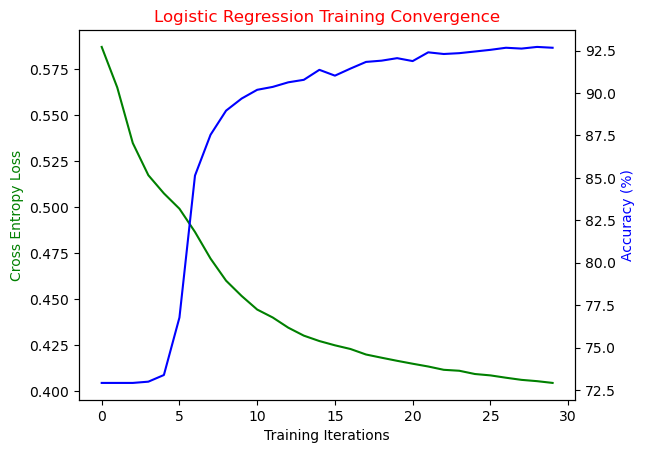

Performance on test data:
	Loss: 0.3980
	Accuracy: 93.65%


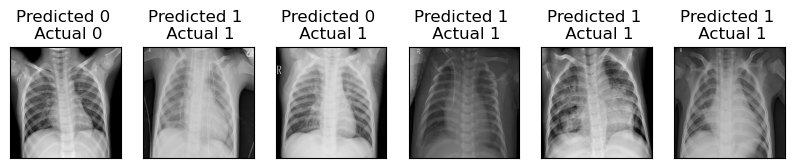

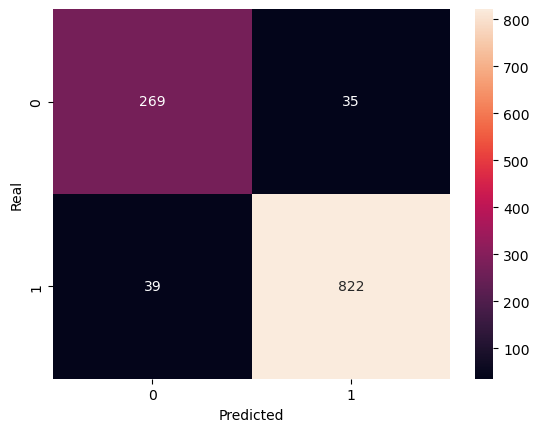

Time taken:  594.5287621021271
Test size: 1165
Total Accuracy:  0.936480686695279
Total Precision:  0.9591598599766628
Total Recall:  0.9547038327526133
Total F1 Score:  0.9569266589057043
Classification Report:

              precision    recall  f1-score   support

           0       0.87      0.88      0.88       304
           1       0.96      0.95      0.96       861

    accuracy                           0.94      1165
   macro avg       0.92      0.92      0.92      1165
weighted avg       0.94      0.94      0.94      1165



,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs30_lr0.0001_optimizerSGD,594.528762,0.936481,0.95916,0.954704,0.956927


Data Stored Successfully
Training with batch size: 64, epochs: 30, learning rate: 0.0001, optimizer: Adam
Current: 82/90
Training [3%]	Loss: 0.5857	Accuracy: 72.70%
Training [7%]	Loss: 0.5840	Accuracy: 72.92%
Training [10%]	Loss: 0.5837	Accuracy: 72.92%
Training [13%]	Loss: 0.5840	Accuracy: 72.92%
Training [17%]	Loss: 0.5843	Accuracy: 72.92%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [23%]	Loss: 0.5838	Accuracy: 72.92%
Training [27%]	Loss: 0.5835	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [33%]	Loss: 0.5844	Accuracy: 72.92%
Training [37%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [43%]	Loss: 0.5837	Accuracy: 72.92%
Training [47%]	Loss: 0.5840	Accuracy: 72.92%
Training [50%]	Loss: 0.5841	Accuracy: 72.92%
Training [53%]	Loss: 0.5840	Accuracy: 72.92%
Training [57%]	Loss: 0.5846	Accuracy: 72.92%
Training [60%]	Loss: 0.5836	Accuracy: 72.92%
Training [63%]	Loss: 0.5842	Accuracy: 72.92%
Training [67%]	Loss: 0.584

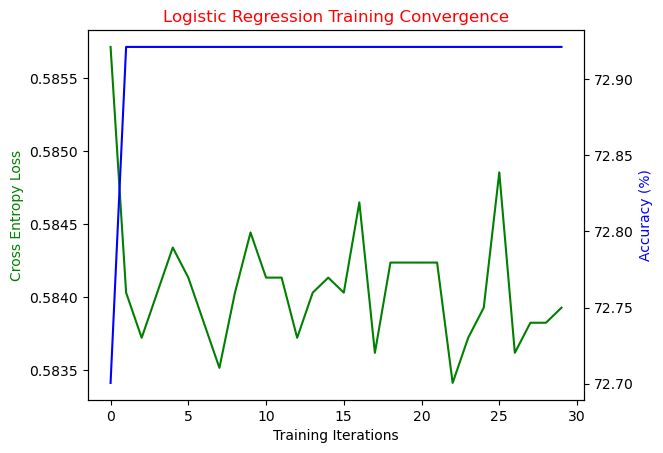

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


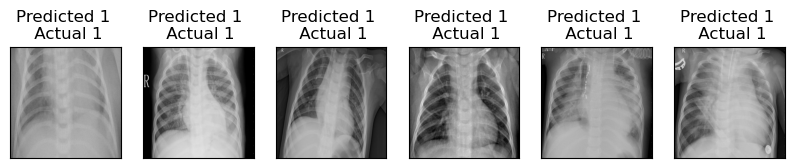

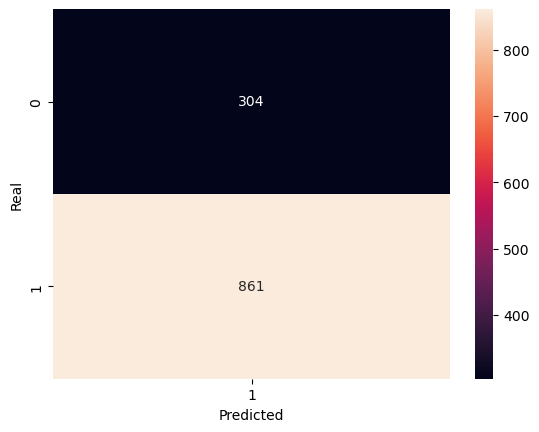

Time taken:  619.6276483535767
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs30_lr0.0001_optimizerAdam,619.627648,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 30, learning rate: 0.001, optimizer: SGD
Current: 83/90
Training [3%]	Loss: 0.5862	Accuracy: 72.92%
Training [7%]	Loss: 0.5841	Accuracy: 72.92%
Training [10%]	Loss: 0.5843	Accuracy: 72.92%
Training [13%]	Loss: 0.5838	Accuracy: 72.92%
Training [17%]	Loss: 0.5841	Accuracy: 72.92%
Training [20%]	Loss: 0.5836	Accuracy: 72.92%
Training [23%]	Loss: 0.5835	Accuracy: 72.92%
Training [27%]	Loss: 0.5838	Accuracy: 72.92%
Training [30%]	Loss: 0.5837	Accuracy: 72.92%
Training [33%]	Loss: 0.5838	Accuracy: 72.92%
Training [37%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [43%]	Loss: 0.5837	Accuracy: 72.92%
Training [47%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5839	Accuracy: 72.92%
Training [53%]	Loss: 0.5840	Accuracy: 72.92%
Training [57%]	Loss: 0.5837	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [63%]	Loss: 0.5836	Accuracy: 72.92%
Training [67%]	Loss: 0.5843	

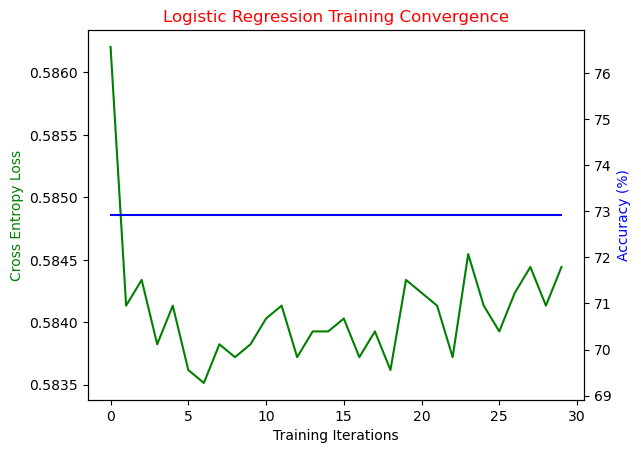

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


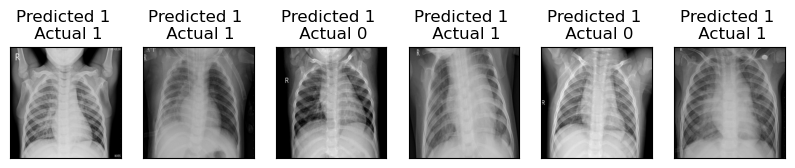

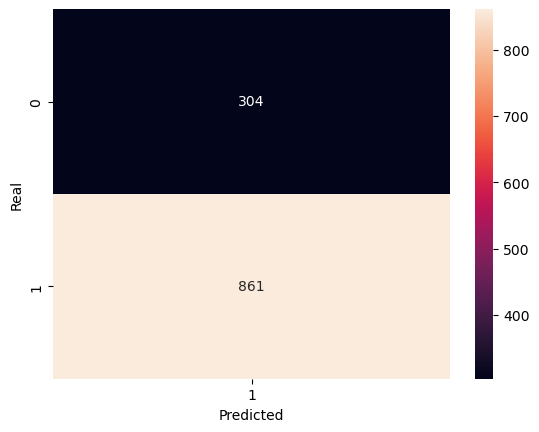

Time taken:  599.9544579982758
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs30_lr0.001_optimizerSGD,599.954458,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 30, learning rate: 0.001, optimizer: Adam
Current: 84/90
Training [3%]	Loss: 0.5860	Accuracy: 72.19%
Training [7%]	Loss: 0.5840	Accuracy: 72.92%
Training [10%]	Loss: 0.5843	Accuracy: 72.92%
Training [13%]	Loss: 0.5833	Accuracy: 72.92%
Training [17%]	Loss: 0.5840	Accuracy: 72.92%
Training [20%]	Loss: 0.5843	Accuracy: 72.92%
Training [23%]	Loss: 0.5838	Accuracy: 72.92%
Training [27%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [33%]	Loss: 0.5841	Accuracy: 72.92%
Training [37%]	Loss: 0.5844	Accuracy: 72.92%
Training [40%]	Loss: 0.5840	Accuracy: 72.92%
Training [43%]	Loss: 0.5846	Accuracy: 72.92%
Training [47%]	Loss: 0.5835	Accuracy: 72.92%
Training [50%]	Loss: 0.5840	Accuracy: 72.92%
Training [53%]	Loss: 0.5842	Accuracy: 72.92%
Training [57%]	Loss: 0.5843	Accuracy: 72.92%
Training [60%]	Loss: 0.5837	Accuracy: 72.92%
Training [63%]	Loss: 0.5845	Accuracy: 72.92%
Training [67%]	Loss: 0.5846

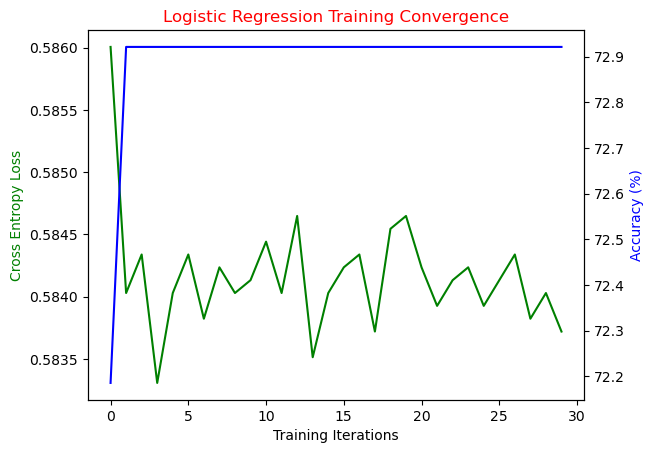

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


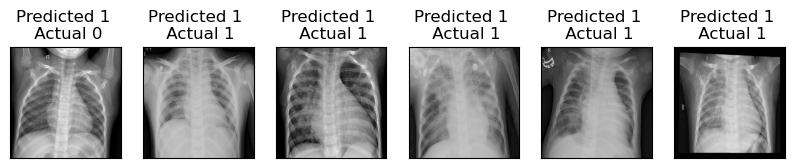

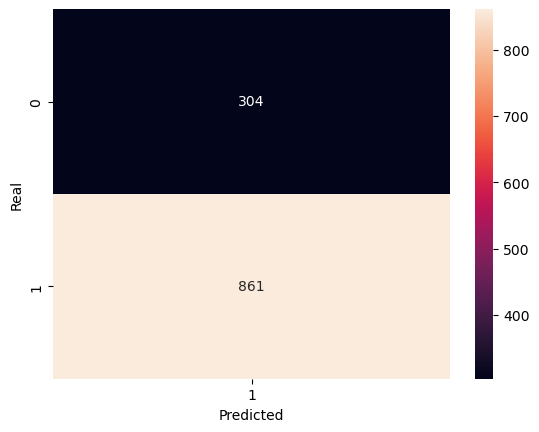

Time taken:  623.4417991638184
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs30_lr0.001_optimizerAdam,623.441799,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 30, learning rate: 0.01, optimizer: SGD
Current: 85/90
Training [3%]	Loss: 0.5858	Accuracy: 72.31%
Training [7%]	Loss: 0.5841	Accuracy: 72.92%
Training [10%]	Loss: 0.5843	Accuracy: 72.92%
Training [13%]	Loss: 0.5843	Accuracy: 72.92%
Training [17%]	Loss: 0.5840	Accuracy: 72.92%
Training [20%]	Loss: 0.5843	Accuracy: 72.92%
Training [23%]	Loss: 0.5837	Accuracy: 72.92%
Training [27%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5840	Accuracy: 72.92%
Training [33%]	Loss: 0.5839	Accuracy: 72.92%
Training [37%]	Loss: 0.5838	Accuracy: 72.92%
Training [40%]	Loss: 0.5837	Accuracy: 72.92%
Training [43%]	Loss: 0.5842	Accuracy: 72.92%
Training [47%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5835	Accuracy: 72.92%
Training [53%]	Loss: 0.5837	Accuracy: 72.92%
Training [57%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5844	Accuracy: 72.92%
Training [63%]	Loss: 0.5842	Accuracy: 72.92%
Training [67%]	Loss: 0.5842	A

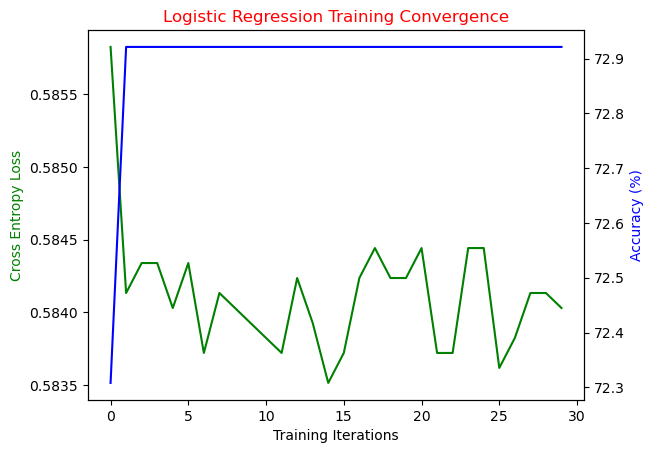

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


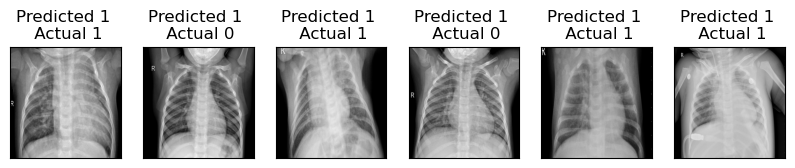

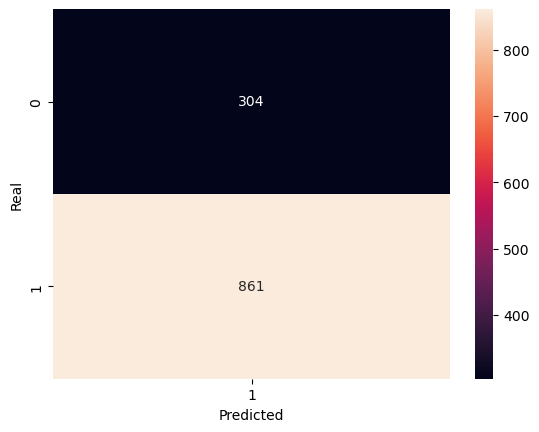

Time taken:  602.9936096668243
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs30_lr0.01_optimizerSGD,602.99361,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 30, learning rate: 0.01, optimizer: Adam
Current: 86/90
Training [3%]	Loss: 0.5850	Accuracy: 72.92%
Training [7%]	Loss: 0.5844	Accuracy: 72.92%
Training [10%]	Loss: 0.5839	Accuracy: 72.92%
Training [13%]	Loss: 0.5843	Accuracy: 72.92%
Training [17%]	Loss: 0.5843	Accuracy: 72.92%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [23%]	Loss: 0.5841	Accuracy: 72.92%
Training [27%]	Loss: 0.5839	Accuracy: 72.92%
Training [30%]	Loss: 0.5844	Accuracy: 72.92%
Training [33%]	Loss: 0.5842	Accuracy: 72.92%
Training [37%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5837	Accuracy: 72.92%
Training [43%]	Loss: 0.5844	Accuracy: 72.92%
Training [47%]	Loss: 0.5837	Accuracy: 72.92%
Training [50%]	Loss: 0.5835	Accuracy: 72.92%
Training [53%]	Loss: 0.5831	Accuracy: 72.92%
Training [57%]	Loss: 0.5836	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [63%]	Loss: 0.5836	Accuracy: 72.92%
Training [67%]	Loss: 0.5841	

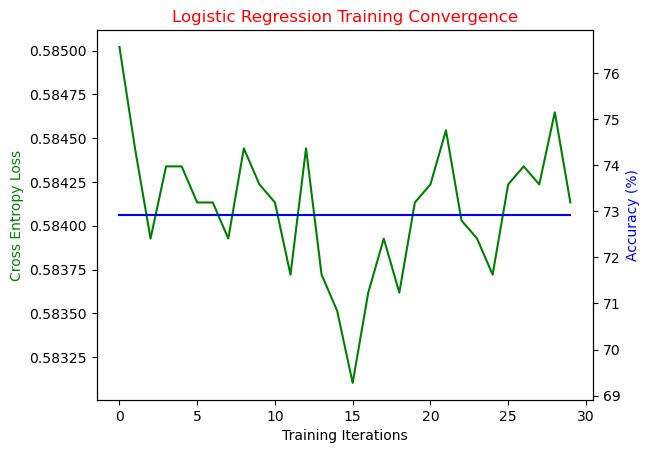

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


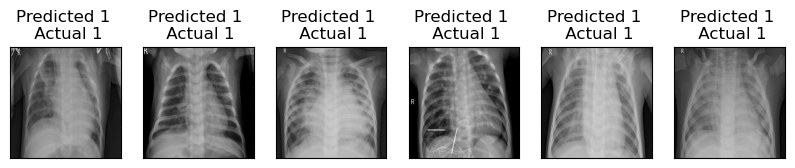

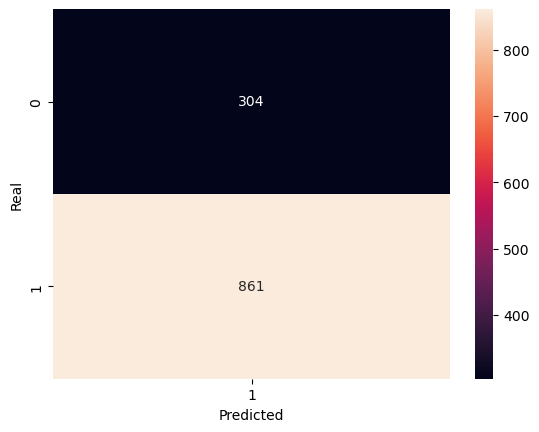

Time taken:  618.9918177127838
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs30_lr0.01_optimizerAdam,618.991818,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 30, learning rate: 0.1, optimizer: SGD
Current: 87/90
Training [3%]	Loss: 0.5869	Accuracy: 72.14%
Training [7%]	Loss: 0.5843	Accuracy: 72.92%
Training [10%]	Loss: 0.5843	Accuracy: 72.92%
Training [13%]	Loss: 0.5836	Accuracy: 72.92%
Training [17%]	Loss: 0.5839	Accuracy: 72.92%
Training [20%]	Loss: 0.5837	Accuracy: 72.92%
Training [23%]	Loss: 0.5840	Accuracy: 72.92%
Training [27%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [33%]	Loss: 0.5844	Accuracy: 72.92%
Training [37%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5841	Accuracy: 72.92%
Training [43%]	Loss: 0.5836	Accuracy: 72.92%
Training [47%]	Loss: 0.5842	Accuracy: 72.92%
Training [50%]	Loss: 0.5843	Accuracy: 72.92%
Training [53%]	Loss: 0.5844	Accuracy: 72.92%
Training [57%]	Loss: 0.5845	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [63%]	Loss: 0.5841	Accuracy: 72.92%
Training [67%]	Loss: 0.5839	Ac

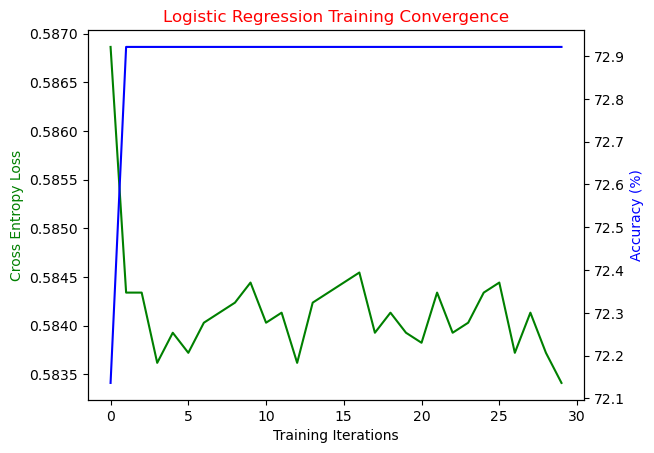

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


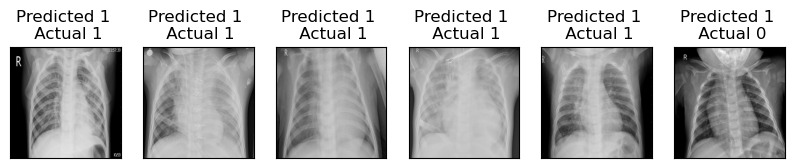

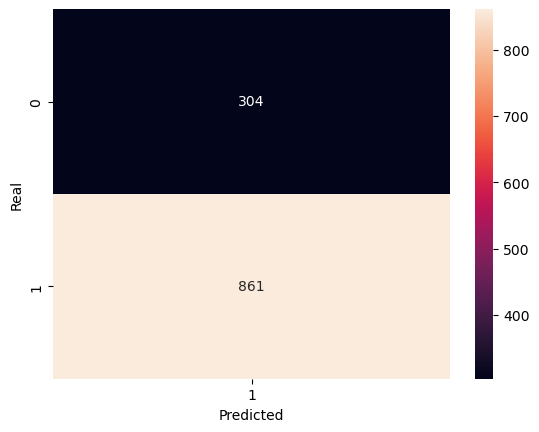

Time taken:  601.7377729415894
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs30_lr0.1_optimizerSGD,601.737773,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 30, learning rate: 0.1, optimizer: Adam
Current: 88/90
Training [3%]	Loss: 0.5865	Accuracy: 72.28%
Training [7%]	Loss: 0.5844	Accuracy: 72.92%
Training [10%]	Loss: 0.5846	Accuracy: 72.92%
Training [13%]	Loss: 0.5841	Accuracy: 72.92%
Training [17%]	Loss: 0.5840	Accuracy: 72.92%
Training [20%]	Loss: 0.5837	Accuracy: 72.92%
Training [23%]	Loss: 0.5843	Accuracy: 72.92%
Training [27%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5843	Accuracy: 72.92%
Training [33%]	Loss: 0.5848	Accuracy: 72.92%
Training [37%]	Loss: 0.5842	Accuracy: 72.92%
Training [40%]	Loss: 0.5848	Accuracy: 72.92%
Training [43%]	Loss: 0.5844	Accuracy: 72.92%
Training [47%]	Loss: 0.5839	Accuracy: 72.92%
Training [50%]	Loss: 0.5837	Accuracy: 72.92%
Training [53%]	Loss: 0.5851	Accuracy: 72.92%
Training [57%]	Loss: 0.5843	Accuracy: 72.92%
Training [60%]	Loss: 0.5839	Accuracy: 72.92%
Training [63%]	Loss: 0.5848	Accuracy: 72.92%
Training [67%]	Loss: 0.5844	A

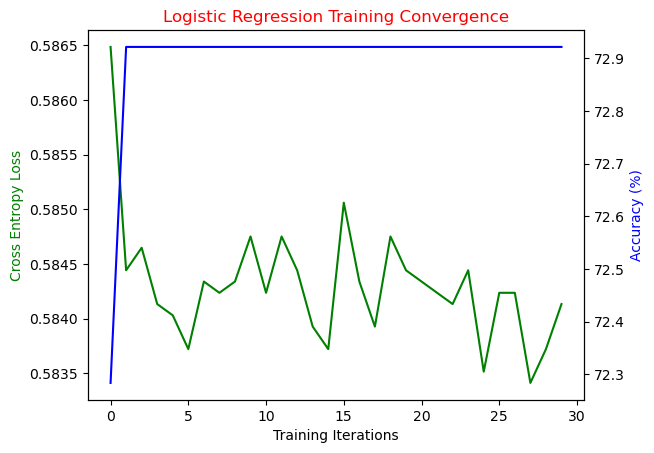

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


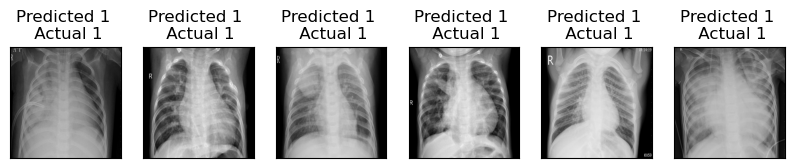

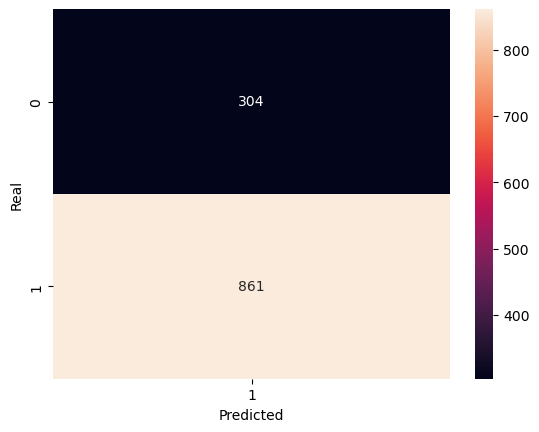

Time taken:  623.172290802002
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs30_lr0.1_optimizerAdam,623.172291,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 30, learning rate: 1, optimizer: SGD
Current: 89/90
Training [3%]	Loss: 0.5855	Accuracy: 72.80%
Training [7%]	Loss: 0.5842	Accuracy: 72.92%
Training [10%]	Loss: 0.5842	Accuracy: 72.92%
Training [13%]	Loss: 0.5845	Accuracy: 72.92%
Training [17%]	Loss: 0.5843	Accuracy: 72.92%
Training [20%]	Loss: 0.5839	Accuracy: 72.92%
Training [23%]	Loss: 0.5842	Accuracy: 72.92%
Training [27%]	Loss: 0.5841	Accuracy: 72.92%
Training [30%]	Loss: 0.5842	Accuracy: 72.92%
Training [33%]	Loss: 0.5840	Accuracy: 72.92%
Training [37%]	Loss: 0.5840	Accuracy: 72.92%
Training [40%]	Loss: 0.5844	Accuracy: 72.92%
Training [43%]	Loss: 0.5842	Accuracy: 72.92%
Training [47%]	Loss: 0.5838	Accuracy: 72.92%
Training [50%]	Loss: 0.5844	Accuracy: 72.92%
Training [53%]	Loss: 0.5837	Accuracy: 72.92%
Training [57%]	Loss: 0.5841	Accuracy: 72.92%
Training [60%]	Loss: 0.5838	Accuracy: 72.92%
Training [63%]	Loss: 0.5839	Accuracy: 72.92%
Training [67%]	Loss: 0.5836	Accu

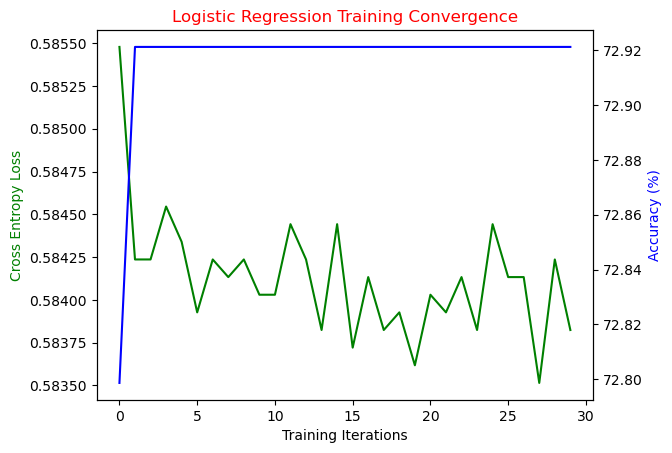

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


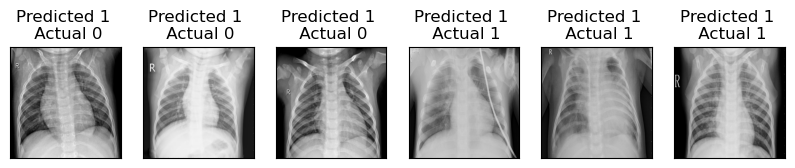

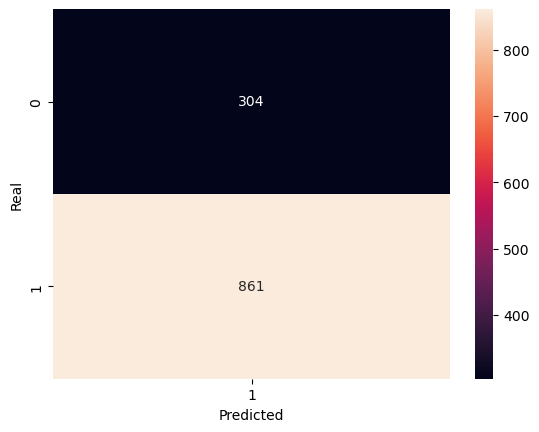

Time taken:  599.8099925518036
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs30_lr1_optimizerSGD,599.809993,0.739056,0.739056,1.0,0.849951


Data Stored Successfully
Training with batch size: 64, epochs: 30, learning rate: 1, optimizer: Adam
Current: 90/90
Training [3%]	Loss: 0.5868	Accuracy: 72.16%
Training [7%]	Loss: 0.5841	Accuracy: 72.92%
Training [10%]	Loss: 0.5843	Accuracy: 72.92%
Training [13%]	Loss: 0.5841	Accuracy: 72.92%
Training [17%]	Loss: 0.5835	Accuracy: 72.92%
Training [20%]	Loss: 0.5841	Accuracy: 72.92%
Training [23%]	Loss: 0.5842	Accuracy: 72.92%
Training [27%]	Loss: 0.5842	Accuracy: 72.92%
Training [30%]	Loss: 0.5837	Accuracy: 72.92%
Training [33%]	Loss: 0.5845	Accuracy: 72.92%
Training [37%]	Loss: 0.5841	Accuracy: 72.92%
Training [40%]	Loss: 0.5837	Accuracy: 72.92%
Training [43%]	Loss: 0.5841	Accuracy: 72.92%
Training [47%]	Loss: 0.5843	Accuracy: 72.92%
Training [50%]	Loss: 0.5842	Accuracy: 72.92%
Training [53%]	Loss: 0.5841	Accuracy: 72.92%
Training [57%]	Loss: 0.5842	Accuracy: 72.92%
Training [60%]	Loss: 0.5841	Accuracy: 72.92%
Training [63%]	Loss: 0.5840	Accuracy: 72.92%
Training [67%]	Loss: 0.5845	Acc

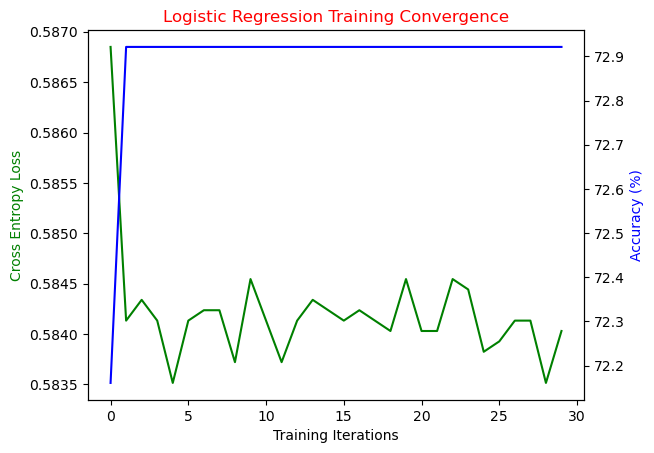

Performance on test data:
	Loss: 0.5747
	Accuracy: 73.91%


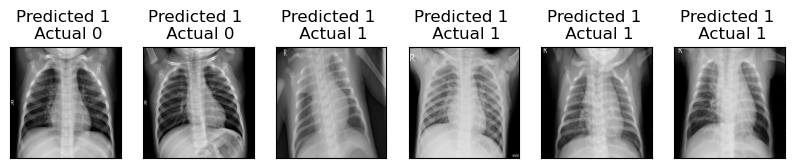

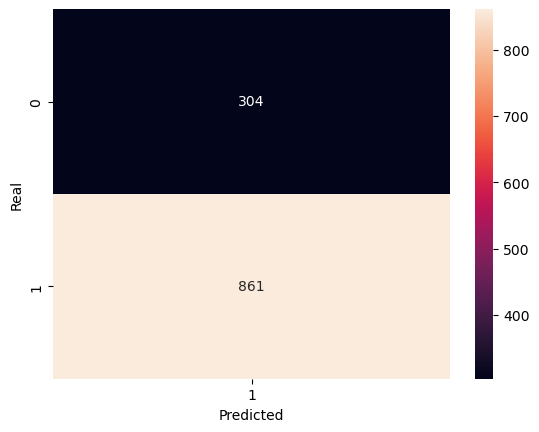

Time taken:  623.4913277626038
Test size: 1165
Total Accuracy:  0.7390557939914163
Total Precision:  0.7390557939914163
Total Recall:  1.0
Total F1 Score:  0.8499506416584404
Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       304
           1       0.74      1.00      0.85       861

    accuracy                           0.74      1165
   macro avg       0.37      0.50      0.42      1165
weighted avg       0.55      0.74      0.63      1165



c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\rjuya\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Time,Accuracy,Precision,Recall,F1 score
Logistic Regression model_batch64_epochs30_lr1_optimizerAdam,623.491328,0.739056,0.739056,1.0,0.849951


Data Stored Successfully


In [26]:
number_done = 0
for size in batch_sizes:
    train_loader = DataLoader(train_data, shuffle=True, batch_size=size)
    test_loader = DataLoader(valid_data, shuffle=True, batch_size=1)
    for epochs in num_epochs_list:
        for learning_rate in learning_rates:
            for optimizer_name in optimizers:
                print(f"Training with batch size: {size}, epochs: {epochs}, learning rate: {learning_rate}, optimizer: {optimizer_name}")
                number_done+=1
                print(f"Current: {number_done}/90")
                # Define logistic regression model
                model = LogisticRegression(input_size,num_classes)
                loss_func = CrossEntropyLoss()
                if optimizer_name == 'SGD':
                    optimizer = optim.SGD(model.parameters(),lr=learning_rate)
                else:
                    optimizer = optim.Adam(model.parameters(),lr=learning_rate)

                # Training loop
                tic = time.time()
                loss_list = []
                total_accuracy = []
                for epoch in range(epochs):
                    correct = 0
                    total_loss = []
                    batch_size = 0
                    for i, (images, labels) in enumerate(train_loader):
                        batch_size+=1
                        optimizer.zero_grad()
                        # print(images.shape)
                        # print(images.view(-1, input_size).shape)
                        output = model(images)
                        loss = loss_func(output, labels)
                        # Loss.append(loss.item())
                        loss.backward()
                        optimizer.step()
                        total_loss.append(loss.item())
                        train_pred = output.argmax(dim=1, keepdim=True)
                        correct += train_pred.eq(labels.view_as(train_pred)).sum().item()
                    loss_list.append(sum(total_loss) / len(total_loss))
                    accuracy = 100 * correct / 4077 # No. of training examples = 4077
                    total_accuracy.append(accuracy)
                    print(f"Training [{100.0 * (epoch + 1) / epochs:.0f}%]\tLoss: {loss_list[-1]:.4f}\tAccuracy: {accuracy:.2f}%")

                # Evaluate the model on the test set
                toc = time.time()
                time_taken = toc-tic
                print('Time taken: ',time_taken)
                
                
                fig, ax1 = plt.subplots()
                ax1.plot(loss_list, 'g-')
                ax2 = ax1.twinx()
                ax2.plot(total_accuracy, 'b')
                plt.title("Logistic Regression Training Convergence", color='red')
                ax1.set_xlabel("Training Iterations")
                ax1.set_ylabel("Cross Entropy Loss", color='g')
                ax2.set_ylabel("Accuracy (%)", color='b')
                plt.show()
                
                model_path = f"C:/Users/rjuya/OneDrive/Desktop/github stuff/EE5610/Project/Models/log_reg model_batch{size}_epochs{epochs}_lr{learning_rate}_optimizer{optimizer_name}.pt"
                torch.save(model.state_dict(), model_path)
                
                model_temp = LogisticRegression(input_size,num_classes)
                model_temp.load_state_dict(torch.load(model_path))
                batch_size=1

                model_temp.eval()
                pred_targets = []
                test_targets= []
                
                with no_grad():

                    correct = 0
                    for batch_idx, (data, target) in enumerate(test_loader):
                        output = model_temp(data)
                        if len(output.shape) == 1:
                            output = output.reshape(1, *output.shape)
                        pred = output.argmax(dim=1, keepdim=True)
                        pred_targets.append(pred.item())
                        test_targets.append(target.item())
                        correct += pred.eq(target.view_as(pred)).sum().item()

                        loss = loss_func(output, target)
                        total_loss.append(loss.item())

                    print(f"Performance on test data:\n\tLoss: {sum(total_loss) / len(total_loss):.4f}\n\tAccuracy: {100 * correct / len(test_loader) / batch_size:.2f}%")


                from PIL import Image
                #abc
                n_samples_show = 6
                count = 0
                fig, axes = plt.subplots(nrows=1, ncols=n_samples_show, figsize=(10, 3))

                model_temp.eval()
                with no_grad():
                    for batch_idx, (data, target) in enumerate(test_loader):
                        if count == n_samples_show:
                            break
                        output = model_temp(data[0:1])
                        if len(output.shape) == 1:
                            output = output.reshape(3, *output.shape)

                        pred = output.argmax(dim=1, keepdim=True)
                        test_targets2 = target.item()
                        axes[count].imshow(torchvision.transforms.ToPILImage(mode='RGB')(data[0].squeeze()), cmap=plt.cm.rainbow)

                        axes[count].set_xticks([])
                        axes[count].set_yticks([])
                        axes[count].set_title("Predicted {} \n Actual {}".format(pred.item(),test_targets2))

                        count += 1
                        
                plt.show()       
                name_logreg = f"Logistic Regression model_batch{size}_epochs{epochs}_lr{learning_rate}_optimizer{optimizer_name}"
                val_logreg = matrix_confusion(test_targets, pred_targets,time_taken)
                out = pd.DataFrame([val_logreg],
                                index = [name_logreg],
                                columns=['Time','Accuracy','Precision','Recall','F1 score'])
                out.sort_values('Time')
                display(out)  
                
                filepath1 = f"C:/Users/rjuya/OneDrive/Desktop/github stuff/EE5610/Project/Models/output of log_reg model_batch{size}_epochs{epochs}_lr{learning_rate}_optimizer{optimizer_name}.pickle"
                with open(filepath1, 'wb') as file:
                    # Serialize and write the variable to the file
                    pickle.dump(out, file)
                    print("Data Stored Successfully")
                
                